In [1]:
import warnings
warnings.filterwarnings("ignore")

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Semi-Empirical Model</p>
## Objective:
 + Doing Non-Linear Least Square Adjustment for the Soil Moisture

### Ulaby's Water Cloud Model

#### $${Pr_{eff}} = [({A{V_1}cos𝛉})(1-{𝐞^{\frac{−2B{V_2}}{cos𝛉}}})]+({{C}{M_v}+{D}}){𝐞^{\frac{−2B{V_2}}{cos𝛉}}}$$
Where,
$$ {V_1} = {L}^{E_1} $$
 
$$ {V_2} = {L}^{E_2} $$
+ L = Biomass data calculated from LAI
+ 𝛉 = CYGNSS specular point incidence angle
+ Preff = Backscatter from CYGNSS
+ Mv = Soil Moisture 
+ V1 and V2 describe the effect of canopy geometry and water content on the backscatter coefficient. 
+ A and B are vegetation parameters, A corresponds to the albedo of the vegetation and B is an attenuation factor. 
+ C and D are soil parameters, D indicates the sensitivity of the radar signal to soil moisture and C  the calibration constant.

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Non-linear least square adjustment</p>
   + Performing adjustment for the daily soil moisture in a particular 36 km grid cell of SMAP
   + Actually number of parameters to be estimated was 7 (A, B, C, D, E1, E2 and Mvt)
   + Minimum number of observations required should be more than 7 for the adjustment in daily data
   + So in order to account for the day with the low number of observations I have applied adjustment for whole year data
     + I have gathered those days having at least 1 observation
     + ${Mv}_t$ was not considered for the day having no observations
     + Parameters were nD+6
        + Where nD = Number of all days soil moisture as parameters which has at least one observation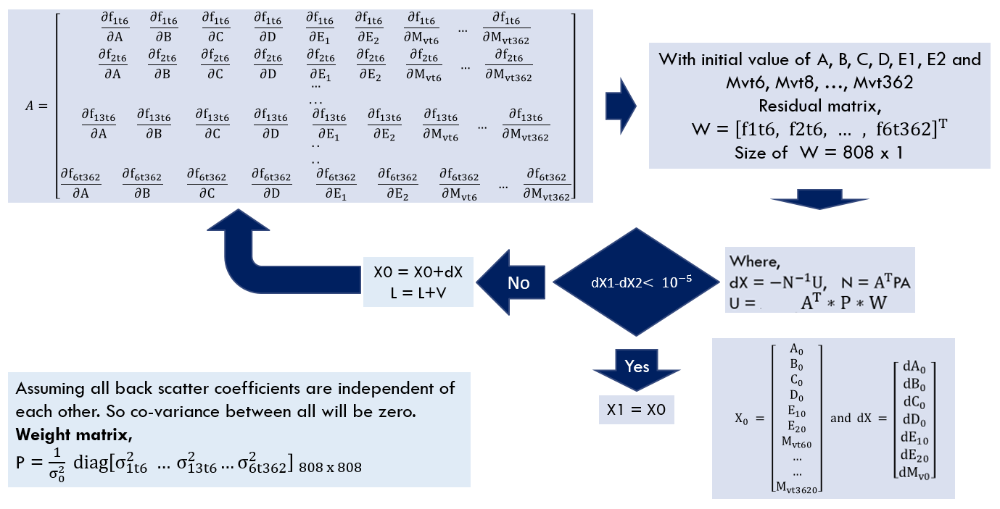

#### Loading Module

In [2]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import seaborn as sns
import sympy
from sympy import *

In [3]:
import Preparing_Dataset_for_BatchProcessing
import imp
imp.reload(Preparing_Dataset_for_BatchProcessing)
import Preparing_Dataset_for_BatchProcessing as r5

#### Collecting one year data within a 36 km grid cell
+ CYGNSS daily observations were collected within 36 km grid cell (more than 7 observations were seen in a single day).
+ LAI from NOAA were taken and interpolated along the CYGNSS observations.

#### Stacking all the samples within a particular grid cell for whole year of 2020

In [4]:
lat = 23.62   # Latitude of the centroid of the grid cell
lon = 78.22   # Longitude of the centroid of the grid cell

# Calling Stacking function from the module
DF_batch = r5.Data_Batch_2020(lat,lon)

In [5]:
# Stacked data of the whole year for a single 36 km grid cell
DF_batch

,SR_eff,SP_I,sp_lat,sp_lon,LAI,Day_No
0,6.038855,23.059137,23.690813,78.065280,0.881,1.0
1,4.631810,23.067894,23.704811,78.091160,0.896,1.0
2,5.398931,23.076675,23.718813,78.117065,0.877,1.0
3,4.923258,23.085495,23.732817,78.142960,0.877,1.0
4,5.827567,23.094381,23.746794,78.168884,0.932,1.0
...,...,...,...,...,...,...
11,1.736492,23.198532,23.745024,78.254050,0.000,365.0
12,1.791297,23.174530,23.758152,78.280110,0.000,365.0
13,1.481883,23.150581,23.771260,78.306160,0.000,365.0
14,1.204441,23.126648,23.784369,78.332220,0.000,365.0


+ So in a single grid cell there are 10 observations daily 

### Resampling GLDAS data for initialization purpose 
+ GLDAS soil moisture data were resampled into 36 km grid cell of SMAP.
+ Since SMAP validation data for the adjusted soil moisture is available in 36 km grid cell.

In [6]:
# Path of the resampled GLDAS soil moisture data
GLDAS_Path = f'D:\EG\Project Data\CYGNSS_Obs_Chambal_{lat}_{lon}'+f'\GLDAS_SM_{lat}_{lon}_Day_1-366.csv'
GLDAS_SM1  = pd.read_csv(GLDAS_Path)

# Droping irrelevant variables
GLDAS_SM1  = GLDAS_SM1.drop(np.array(GLDAS_SM1.keys())[:-1],axis=1)
GLDAS_SM   = np.array(GLDAS_SM1['GLDAS_SM'])
Mv0        = GLDAS_SM

### Tagging the daily soil moisture their daily CYGNSS observations

In [7]:
SM_initialized = []
for i in range(len(DF_batch)):
    D = np.array(DF_batch['Day_No'])[i]-1
    SM_initialized.append(Mv0[int(D)])

DF_batch['GLDAS_SM'] = SM_initialized

# Looking observations in 36 km grid cell for a particular day; say 6th January
DF_batch[DF_batch['Day_No']==6]

,SR_eff,SP_I,sp_lat,sp_lon,LAI,Day_No,GLDAS_SM
0,1.338698,12.005059,23.538832,78.059140,0.0,6.0,0.669943
1,1.101488,11.969226,23.526140,78.085160,0.0,6.0,0.669943
2,0.773465,11.861786,23.488018,78.163140,0.0,6.0,0.669943
3,0.700457,11.825986,23.475307,78.189125,0.0,6.0,0.669943
4,1.106099,11.790198,23.462587,78.215100,0.0,6.0,0.669943
5,1.409840,11.754416,23.449860,78.241070,0.0,6.0,0.669943


### Extracting biomass from LAI
+ Calculation of Biomass from the Leaf Area Index data

In [8]:
def LAI_L(LAI):
    LAI_F     = 2.1
    SLA       = 30
    wd_fract  = 0.25
    LAI_MX    = 2.5
    foliar_W  = 1.30
    wood_W    = 0.54
    foliar_C  = LAI*LAI_F/SLA
    wood_C    = wd_fract*LAI_MX*1.25
    veg_water = foliar_C*2.22*foliar_W + wood_C*2.22*wood_W
    L         = 2.22*foliar_C + 2.22*wood_C + veg_water
    return L

+ Counting the number of unique days available within a single 36 km grid cell having CYGNSS observations

In [9]:
Df1 = DF_batch
DD  = (Df1['Day_No'])
DD  = DD.drop_duplicates()
DD

0      1.0
0      2.0
0      3.0
0      4.0
0      5.0
     ...  
0    361.0
0    362.0
0    363.0
0    364.0
0    365.0
Name: Day_No, Length: 252, dtype: float64

+ So here total 252 unique days are available for adjustment
+ Therefore we will have 252 soil moisture data after adjustment

### Collecting raw observations for adjustment

In [10]:
Sgma0    = Df1['SR_eff']       # CYGNSS back-scatter
L        = LAI_L(Df1['LAI'])   # Biomass data from LAI 
Theta    = Df1['SP_I']         # CYGNSS inclination angle 
GLDAS_SM = Df1['GLDAS_SM']     # GLDAS soil moisture data for the initialization purpose
Day_No   = Df1['Day_No']       # Unique days so that the initialization tagged appropriately

#### Ulaby's semi-empirical Water Cloud Model Equation for the adjustment
$${Pr_{eff}} = [({A{V_1}cos𝛉})(1-{𝐞^{\frac{−2B{V_2}}{cos𝛉}}})]+({{C}{M_v}+{D}}){𝐞^{\frac{−2B{V_2}}{cos𝛉}}}$$

In [11]:
a,b,c,d,e1,e2,Mvt,Sgma,theeta,l = symbols('a b c d e1 e2 Mvt Sgma theeta l')

exp1 = a*((l)**e1)*cos(theeta)*(1-exp(-2*b*((l)**e2)/cos(theeta)))
exp2 = c*Mvt*exp(-2*b*((l)**e2)/cos(theeta))
exp3 = d*exp(-2*b*((l)**e2)/cos(theeta))
f    = Sgma-(exp1+exp2+exp3)
f

-Mvt*c*exp(-2*b*l**e2/cos(theeta)) + Sgma - a*l**e1*(1 - exp(-2*b*l**e2/cos(theeta)))*cos(theeta) - d*exp(-2*b*l**e2/cos(theeta))

### Model Parameters (n, u, r, P)
+ n = number of observations
+ r = redundancy 
+ u = number of unknowns
+ P = weight matrix (assumed as identity giving equal weights to all the observations)

In [12]:
def Adjustment_Parameters(Sgma0,DD):
    P = np.identity(len(Sgma0))         # Weight matrix (Precision matrix)
    n = len(Sgma0)                      # As total n erroneous observations are there  
    
    # We have to calculate the model parameters and soil moisture 
    u = 6+len(DD)   # A, B, C, D, E1, E2, Mvt6, Mvt8, ....., Mvt365 Assume those day soil moisture only having Biomass
    r = n-u         # Redundancy
    return P,n,u,r

P,n,u,r = Adjustment_Parameters(Sgma0,DD)
P,n,u,r

(array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 0., 0.],
        [0., 0., 0., ..., 0., 1., 0.],
        [0., 0., 0., ..., 0., 0., 1.]]),
 3449,
 258,
 3191)

### Generating Design Matrix
#### Deriving the Jacobian

In [13]:
def Der(f,var):
    A1 = (Derivative(f,var)).doit()
    return A1

def Design_Matrix(Df1,a,b,c,d,e1,e2,Mvt,DD):
    C1 = Der(f,a)
    C2 = Der(f,b)
    C3 = Der(f,c)
    C4 = Der(f,d)
    C5 = Der(f,e1)
    C6 = Der(f,e2)
    C7 = Der(f,Mvt)
    A1 = []
    for j in range(len(Df1)):
        Single_Row_A = [C1,C2,C3,C4,C5,C6]
        for i in range(len(DD)):
            d1 = np.array(DD)[i]
            d2 = int(np.array(Df1['Day_No'])[j])
            if d1 == d2:
                Single_Row_A += [C7]
            else:
                Single_Row_A += [0]
        A1 += Single_Row_A
    A2 = np.array(A1)
    A1 = A2.reshape(len(Df1),(len(DD)+6))
    return A1

In [14]:
%%time
A1 = Design_Matrix(Df1,a,b,c,d,e1,e2,Mvt,DD)
#pd.DataFrame(A1)

Wall time: 13 s


### Substituting values in Jacobian to get the design matrix

In [15]:
def Resubstituting_Values(A1,Sgma0,L,Theta,SM_GLDAS,a0,b0,c0,d0,e10,e20):
    n1,n2 = A1.shape
    A_1   = []
    for i in range(n1):
        Sgma1  = np.array(Sgma0)[i]
        L1     = np.array(L)[i]
        Theta1 = np.array(Theta)[i]
        Mv0    = np.array(SM_GLDAS)[i]
        for j in range(n2):
            a1 = A1[i][j]
            if a1!=0:
                aij = a1.subs({Sgma:Sgma1,l:L1,theeta:Theta1,Mvt:Mv0,a:a0,b:b0,c:c0,d:d0,e1:e10,e2:e20})
                A_1.append(aij)
            else:
                A_1.append(0)
    A_1 = np.array(A_1)    
    A1  = A_1.reshape(n1,n2)
    A   = pd.DataFrame(np.array(A1))
    A.to_csv(rf'D:\EG\Project Data\A_WCM.csv',index=False)
    A   = np.array(pd.read_csv(rf'D:\EG\Project Data\A_WCM.csv'))
    return A

### Setting initial values to the Model parameters 
+ Used Hit and Trail Method to approximate these values

In [16]:
a0    = 0.0094645
b0    = 0.09645
c0    = 13.92
d0    = 0
e10   = -5
e20   = -190       

### Adding the initialized soil moisture 

In [17]:
SM_initial = np.array(DF_batch['GLDAS_SM'].drop_duplicates())
X0         = [a0,b0,c0,d0,e10,e20]
for i in range(len(SM_initial)):
    X0.append(SM_initial[i])
#pd.DataFrame(X0)

+ X0 is the Initial Parameter vector

In [18]:
%%time
A = Resubstituting_Values(A1,Sgma0,L,Theta,GLDAS_SM,a0,b0,c0,d0,e10,e20)
#pd.DataFrame(A)

Wall time: 44.7 s


### Deriving the residual vector for all the observation equations
+ After substituting the initial parameters and the observations 
+ Derived the residual vector for adjustment

In [19]:
## Residual vector also called as Misclosure
def Misclosure(Sgma0,L,Theta,SM_GLDAS,a0,b0,c0,d0,e10,e20,f):
    W_0 = []
    for i in range(len(Sgma0)):
        Sgma1  = np.array(Sgma0)[i]
        L1     = np.array(L)[i]
        Theta1 = np.array(Theta)[i]
        Mv0    = np.array(SM_GLDAS)[i]
        f5 = f.subs({Sgma:Sgma1,l:L1,theeta:Theta1,Mvt:Mv0,a:a0,b:b0,c:c0,d:d0,e1:e10,e2:e20})
        W_0.append(f5)
    W_0 = np.array(W_0)
    W1  = W_0.reshape(len(Sgma0),1)
    W   = pd.DataFrame(W1)
    
    W.to_csv(rf'D:\EG\Project Data\W_WCM.csv',index = False)
    W   = pd.read_csv(rf'D:\EG\Project Data\W_WCM.csv')
    W   = (np.array(W))
    return W

In [20]:
%%time
W = Misclosure(Sgma0,L,Theta,GLDAS_SM,a0,b0,c0,d0,e10,e20,f)
#pd.DataFrame(W)

Wall time: 22.8 s


+ Since residuals are very high in the observed back-scatter so we need to adjust

### Finding Normal Matrix

In [21]:
%%time
N = np.array(np.transpose(A)@P@A)
N.shape

Wall time: 75.1 ms


(258, 258)

#### Converting the elements of the matrix from the object to the float

In [22]:
def Object_toFloat(Matrix):
    m,n = Matrix.shape
    M1 = []
    for i in range(m):
        for j in range(n):
            M1.append(float(Matrix[i,j]))
    M2 = np.array(M1)
    M = M2.reshape(m,n)
    return M

In [23]:
N = Object_toFloat(N)
#pd.DataFrame(N)

In [24]:
%%time
U = (np.transpose(A))@P@W
#U

Wall time: 75.5 ms


### Updates in the parameters

In [25]:
Part1  = np.linalg.pinv(N)       ## Inverse of N
Part2  = Object_toFloat(Part1)   ## Converting elements to float
dX     = -Part2@U                ## Change in X

In [26]:
np.max(abs(dX))

2.2028023081560826

In [27]:
X0 = np.array(X0)
X0 = X0.reshape(len(X0),1)
X  = X0+dX
#X

### Creating Index for updating soil moisture

In [28]:
Df = pd.DataFrame(DF_batch['Day_No'].value_counts(sort=False))['Day_No']
DD = Df.values
idx = []
m = 0
for i in range(len(DD)):
    j = DD[i]
    for k in range(j):
        idx.append(m)
    m = m+1
np.array(idx).shape

(3449,)

### 1st Iteration

In [29]:
X_SM = X[6:]
X_SM.shape

(252, 1)

#### Updating soil moisture

In [30]:
def New_SM(DF_batch,X_SM,idx):
    Mv0 = X_SM
    DF_batch = DF_batch.drop(['GLDAS_SM'], axis=1)
    SM_initialized = []
    for i in range(len(DF_batch)):
        D  = int(np.array(idx)[i])
        SM = Mv0[D]
        SM_initialized.append(SM)
    SM_initialized = np.array(SM_initialized).reshape(len(SM_initialized),) 
    return SM_initialized

In [31]:
%%time
GLDAS_SM = New_SM(DF_batch,X_SM,idx)
A        = Resubstituting_Values(A1,Sgma0,L,Theta,GLDAS_SM,X[0][0],X[1][0],X[2][0],X[3][0],X[4][0],X[5][0])
W        = Misclosure(Sgma0,L,Theta,GLDAS_SM,X[0][0],X[1][0],X[2][0],X[3][0],X[4][0],X[5][0],f)
N        = np.array(np.transpose(A)@P@A)
U        = (np.transpose(A))@P@W
N        = Object_toFloat(N)
Part1    = np.linalg.pinv(N)       ## Inverse of N
Part2    = Object_toFloat(Part1)   ## Converting elements to float
dX1      = -Part2@U                ## Change in X

Wall time: 1min 15s


#### Setting threshold to stop the adjustment

In [32]:
np.max(abs(dX1-dX))<10**(-5)

False

+ Subsequent change in the parameters is more than the threshold so we need to perform more iterations here

#### Updated parameters for next iteration

In [33]:
X = X+dX1
#X

### Performing more Iteration

In [34]:
def Adjustment_Parameters(DF_batch,idx,A1,Sgma0,L,Theta,X,f):
    X_SM     = X[6:]
    GLDAS_SM = New_SM(DF_batch,X_SM,idx)
    A        = Resubstituting_Values(A1,Sgma0,L,Theta,GLDAS_SM,X[0][0],X[1][0],X[2][0],X[3][0],X[4][0],X[5][0])
    W        = Misclosure(Sgma0,L,Theta,GLDAS_SM,X[0][0],X[1][0],X[2][0],X[3][0],X[4][0],X[5][0],f)
    N        = np.array(np.transpose(A)@P@A)
    U        = (np.transpose(A))@P@W
    N        = Object_toFloat(N)
    Part1    = np.linalg.pinv(N)       ## Inverse of N
    Part2    = Object_toFloat(Part1)   ## Converting elements to float
    dX       = -Part2@U                ## Change in X
    return A,W,N,U,dX

dX = dX1
for i in range(1,200):
    A,W,N,U,dX1 = Adjustment_Parameters(DF_batch,idx,A1,Sgma0,L,Theta,X,f)
    Thres       = np.max(abs(dX-dX1))
    if Thres<10**(-5):
        A_adjusted  = A
        W_adjusted  = W
        N_adjusted  = N
        U_adjusted  = U
        X_adjusted  = X
        dX_adjusted = dX
        Number_Iteration = i
        break
    else:
        dX = dX1
        X  = X+dX
        
print('Threshold = ',Thres)
print('Total number of iterations = ',Number_Iteration+1)

Threshold =  5.784094554460403e-11
Total number of iterations =  4


#### Final design matrix

In [35]:
A = pd.DataFrame(A_adjusted) 
#A

#### Final residual matrix

In [36]:
W = pd.DataFrame(W_adjusted) 
#W

#### Final Normal Matrix

In [37]:
N = pd.DataFrame(N_adjusted) 
#N

#### Final adjusted parameters

In [38]:
X = pd.DataFrame(X_adjusted) 
#X

#### Subsequent change in the parameters

In [39]:
dX = pd.DataFrame(dX_adjusted)
#dX

### Design Matrix corresponding to WCM Parameters
+ Adjusted WCM parameters (A,B,C,D,$E_1$,$E_2$)

In [40]:
pd.DataFrame(X[:6])

,0
0,0.009465
1,0.096450
2,12.523447
3,-2.309836
4,-5.000000
5,-190.000000


+ Corresponding design matrix

In [41]:
pd.DataFrame(A_adjusted[:,:6])

,0,1,2,3,4,5
0,0.0,-1.112101e-89,-0.575775,-1.0,0.0,-1.173315e-90
1,0.0,-8.037124e-90,-0.575775,-1.0,0.0,-8.493421e-91
2,0.0,-1.258368e-89,-0.575775,-1.0,0.0,-1.327052e-90
3,0.0,-1.279824e-89,-0.575775,-1.0,0.0,-1.349679e-90
4,0.0,-3.740785e-90,-0.575775,-1.0,0.0,-3.968650e-91
...,...,...,...,...,...,...
3444,0.0,-6.861243e-81,-0.297824,-1.0,0.0,-6.501394e-82
3445,0.0,-6.455712e-81,-0.297824,-1.0,0.0,-6.117132e-82
3446,0.0,-6.099503e-81,-0.297824,-1.0,0.0,-5.779604e-82
3447,0.0,-5.783890e-81,-0.297824,-1.0,0.0,-5.480544e-82


### Design Matrix corresponding to the Soil Moisture

+ Adjusted soil moisture

In [42]:
pd.DataFrame(X[6:])

,0
6,0.575775
7,0.414812
8,0.458546
9,0.489904
10,0.381304
...,...
253,0.436466
254,0.511085
255,0.309057
256,0.310012


+ Corresponding design matrix

In [43]:
pd.DataFrame(A_adjusted[:,6:])

,0,1,2,3,4,5,6,7,8,9,...,242,243,244,245,246,247,248,249,250,251
0,-12.523447,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,-12.523447,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,-12.523447,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
3,-12.523447,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
4,-12.523447,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3444,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-12.523447
3445,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-12.523447
3446,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-12.523447
3447,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-12.523447


In [44]:
np.linalg.matrix_rank(A_adjusted)

252

<a id="1"></a>
## <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:4px 4px;">Hypothesis Test</p>

In [45]:
S   = np.transpose(W)@P@W/r       ## Sum of the square of the residuals
S02 = np.std(Sgma0)               ## Standard deviation in original observed backscatter

In [46]:
r

3191

+ For 5 % significance level 
  + From look up table critical value:
    + DOF = r , alpha = 0.05
    + Critical value, P = r-1 

In [47]:
Test_Statistic = r*S02/S[0][0]
P = r-1
Test_Statistic<P,Test_Statistic

(True, 2077.3470781609126)

+ Test statistic is less than critical value 

### Orthogonality Test 

In [48]:
V = np.transpose(A)@W 
np.sum(V**2)<10**(-15),np.sum(V**2)

(0    True
 dtype: bool,
 0    2.513072e-23
 dtype: float64)

<a id="1"></a>
## <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:4px 4px;">Validation of Adjusted Soil Moisture</p>

### 1. Improved correlation of adjusted soil moisture with the SMAP soil moisture

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

In [50]:
def Annual_To_Pre_Post_Monsoon1(DF):
    PSM = []
    i2   = np.array(DF['Day_No'])
    for i1 in range(len(i2)):
        i = i2[i1]
        if ((i>=1) and (i<=60)) or ((i>=336) and (i<=365)):     # Winter: December, January, February
            PSM.append('Winter')
        elif (i>=61) and (i<=152):                              # Pre-Monsoon: March, April, May
            PSM.append('Pre-Monsoon')
        elif (i>=153) and (i<=274):
            PSM.append('Monsoon')                               # Monsoon: June, July, August, September
        elif (i>=275) and (i<=336):
            PSM.append('Post-Monsoon')                          # Post-Monsoon: October, November
    DF['Seasonality'] = PSM
    return DF

def Annual_To_Pre_Post_Monsoon(DF):
    PSM = []
    for i in range(1,366):
        if ((i>=1) and (i<=60)) or ((i>=336) and (i<=365)):     # Winter: December, January, February
            PSM.append('Winter')
        elif (i>=61) and (i<=152):                              # Pre-Monsoon: March, April, May
            PSM.append('Pre-Monsoon')
        elif (i>=153) and (i<=274):
            PSM.append('Monsoon')                               # Monsoon: June, July, August, September
        elif (i>=275) and (i<=336):
            PSM.append('Post-Monsoon')                          # Post-Monsoon: October, November
    DF['Seasonality'] = PSM
    return DF
    
def Plotting_Var(Df,lat,lon):
    CR = np.array(Df.corr())[1][2]*100
    RMSE = round(np.sum((Df['SMAP_SM'] - Df['Improved_SM'])**2)/len(Df['SMAP_SM']),3)
    Df = Df.append(Df)
    Df['Improved_SM'] = Df['Improved_SM'].rolling(15).mean()
    Df = Df.interpolate(method='linear')
    Df = Df.tail(int(abs(len(Df)/2)))

    plt.figure(figsize=(25,14))
    plt.scatter(Df['Day_No'],Df['SMAP_SM'],label='SMAP Soil Moisture (SM)',color='blue')
    plt.scatter(Df['Day_No'],Df['Improved_SM'],label='''Ulaby's WCM Soil Moisture''',color='darkolivegreen')
    plt.title(f'''Latitude:{lat}°N Longitude:{lon}°E RMSE:{round(RMSE,4)}
Correlation:{np.round(CR,2)}% NSE or CD:{np.round(CR**2/100,2)}%''',size=50) 
    plt.xlabel('Day of Year 2020',size=50)
    plt.ylabel('Soil Moisture (m3/m3)',size=50)
    plt.ylim(0,1.4)
    plt.xticks(np.arange(1, 370, 40),size=50)
    plt.yticks(np.arange(0.1, 1, 0.2),size=50)
    plt.tick_params(axis='both', which='major', labelsize=50)
    plt.legend(fontsize=50)
    
    data=Annual_To_Pre_Post_Monsoon1(Df) 
    import colorbrewer as Cl
    plt.figure(figsize=(8,8))
    DF1  = data[data['Seasonality']=='Winter']
    plt.scatter(DF1['SMAP_SM'],DF1['Improved_SM'],color='#a6611a',label='Winter',alpha=0.6)
    
    DF2  = data[data['Seasonality']=='Pre-Monsoon']
    plt.scatter(DF2['SMAP_SM'],DF2['Improved_SM'],color='#dfc27d',label='Pre-Monsoon',alpha=0.6)
    
    DF3  = data[data['Seasonality']=='Monsoon']
    plt.scatter(DF3['SMAP_SM'],DF3['Improved_SM'],color='#80cdc1',label='Monsoon',alpha=0.6)
    
    DF4  = data[data['Seasonality']=='Post-Monsoon']
    plt.scatter(DF4['SMAP_SM'],DF4['Improved_SM'],color='#018571',label='Post-Monsoon',alpha=0.6)
 
    plt.plot([0,1],[0,1],c='gray')
    plt.xlim(0,1)
    plt.ylim(0,1)
    plt.xticks(np.arange(0.1, 1, 0.2))
    plt.yticks(np.arange(0.1, 1, 0.2))  
    plt.tick_params(axis='both', labelsize=25,labelleft=False, labelright=True)
    plt.ylabel('''Ulaby's WCM SM''', labelpad=-530, fontsize=25)
    plt.xlabel('SMAP SM',fontsize=25)
    plt.legend(fontsize=24,loc='lower right')
    
    
def Plotting_Variations(Df,Var1,Var2,label1,label2,lat,lon,RMSE,CR):
    plt.figure(figsize=(25,14))
    plt.scatter(Df['Day_No'],Df[f'{Var2}'],label = label2,color='blue')
    plt.scatter(Df['Day_No'],Df[f'{Var1}'],label = label1,color='black')
    
    plt.title(f'''Latitude:{lat}°N Longitude:{lon}°E RMSE:{round(RMSE,4)}
Correlation:{CR}% NSE or CD:{np.round(CR**2/100,2)}%''',size=50) 
    plt.xlabel('Day of Year 2020',size=50)
    plt.ylabel('Soil Moisture (m3/m3)',size=50)
    plt.ylim(0,1.4)
    plt.xticks(np.arange(1, 370, 40),size=50)
    plt.yticks(np.arange(0.1, 1, 0.2),size=50)
    plt.legend(fontsize=50)

    data=Annual_To_Pre_Post_Monsoon1(Df.head(365))
    import colorbrewer as Cl
    plt.figure(figsize=(8,8))
    DF1  = data[data['Seasonality']=='Winter']
    plt.scatter(DF1[f'{Var2}'],DF1[f'{Var1}'],color='#a6611a',label='Winter',alpha=0.6)
    
    DF2  = data[data['Seasonality']=='Pre-Monsoon']
    plt.scatter(DF2[f'{Var2}'],DF2[f'{Var1}'],color='#dfc27d',label='Pre-Monsoon',alpha=0.6)
    
    DF3  = data[data['Seasonality']=='Monsoon']
    plt.scatter(DF3[f'{Var2}'],DF3[f'{Var1}'],color='#80cdc1',label='Monsoon',alpha=0.6)
    
    DF4  = data[data['Seasonality']=='Post-Monsoon']
    plt.scatter(DF4[f'{Var2}'],DF4[f'{Var1}'],color='#018571',label='Post-Monsoon',alpha=0.6)
 
    plt.plot([0,1],[0,1],c='gray')
    plt.xlim(0,1)
    plt.ylim(0,1)
    plt.xticks(np.arange(0.1, 1, 0.2))
    plt.yticks(np.arange(0.1, 1, 0.2))  
    plt.tick_params(axis='both', labelsize=25,labelleft=False, labelright=True)
    plt.ylabel(f'{Var1.replace("_SM"," SM")}', labelpad=-530, fontsize=25)
    plt.xlabel(f'{Var2.replace("_SM"," SM")}',fontsize=25)
    plt.legend(fontsize=24,loc='lower right')

In [51]:
DD1 = DF_batch['Day_No'].drop_duplicates()
DD  = DD1.values
SM_adjusted = X[6:].values

In [52]:
SMAP_SM = pd.read_csv(f'D:\EG\Project Data\CYGNSS_Data_in_0p36Dg\SMAP_RF_SM\SMAP_SM_Variations_{lat}_{lon}.csv')  
SMAP_SM['SMAP_SM'] = SMAP_SM['SMAP_SM']/100
x2      = np.array(SMAP_SM['SMAP_SM'])

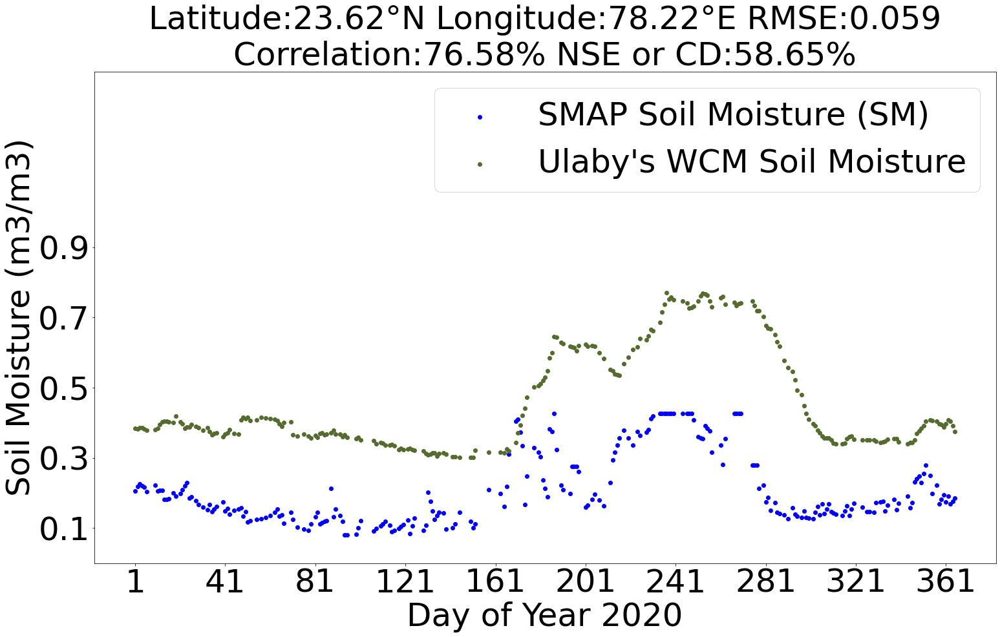

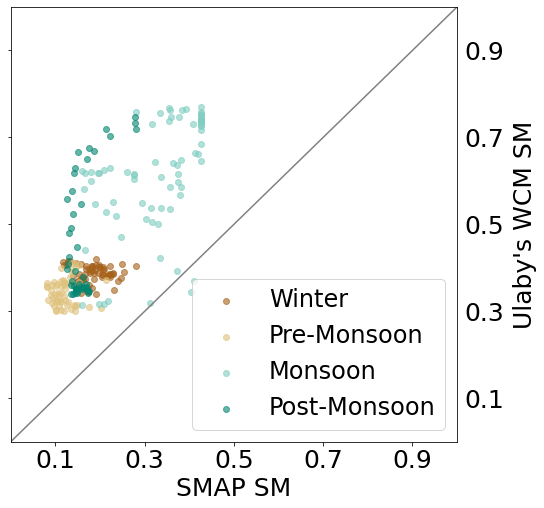

In [53]:
SMAP_SM_filter = []
for j in range(len(DD)):
    D2 = int(DD[j])
    SMAP_SM_filter.append(np.array(SMAP_SM['SMAP_SM'])[D2-1])
    
Df = pd.DataFrame(DD)
Df.columns = ['Day_No'] 
Df['SMAP_SM'] = SMAP_SM_filter
Df['Improved_SM'] = SM_adjusted
Df = Df[(Df['Improved_SM']<1) & (Df['Improved_SM']>=0)]
Plotting_Var(Df,lat,lon)

In [54]:
Df.corr()

,Day_No,SMAP_SM,Improved_SM
Day_No,1.000000,0.257983,0.180561
SMAP_SM,0.257983,1.000000,0.765812
Improved_SM,0.180561,0.765812,1.000000


### 2. Correlation of adjusted soil moisture with the initialized GLDAS soil moisture

In [55]:
def New_SM1(DF_batch,X_SM,idx):
    Mv0 = X_SM
    SM_initialized = []
    for i in range(len(DF_batch)):
        D  = int(np.array(idx)[i])
        SM = float(Mv0[D])
        SM_initialized.append(SM)
    SM_initialized = np.array(SM_initialized).reshape(len(SM_initialized),) 
    DF_batch['WCM_SM'] = SM_initialized
    return DF_batch

X_SM     = X[6:].values
GLDAS_WCM_SM = New_SM1(DF_batch,X_SM,idx)

In [56]:
GLDAS_WCM_SM1 = GLDAS_WCM_SM.drop(['SR_eff','SP_I','sp_lat','sp_lon','LAI'], axis=1)
GLDAS_WCM_SM1 = GLDAS_WCM_SM1.drop_duplicates()
GLDAS_WCM_SM1 = GLDAS_WCM_SM1[GLDAS_WCM_SM1['WCM_SM']<1]
GLDAS_WCM_SM1.corr()

,Day_No,GLDAS_SM,WCM_SM
Day_No,1.000000,0.322087,0.180561
GLDAS_SM,0.322087,1.000000,0.576161
WCM_SM,0.180561,0.576161,1.000000


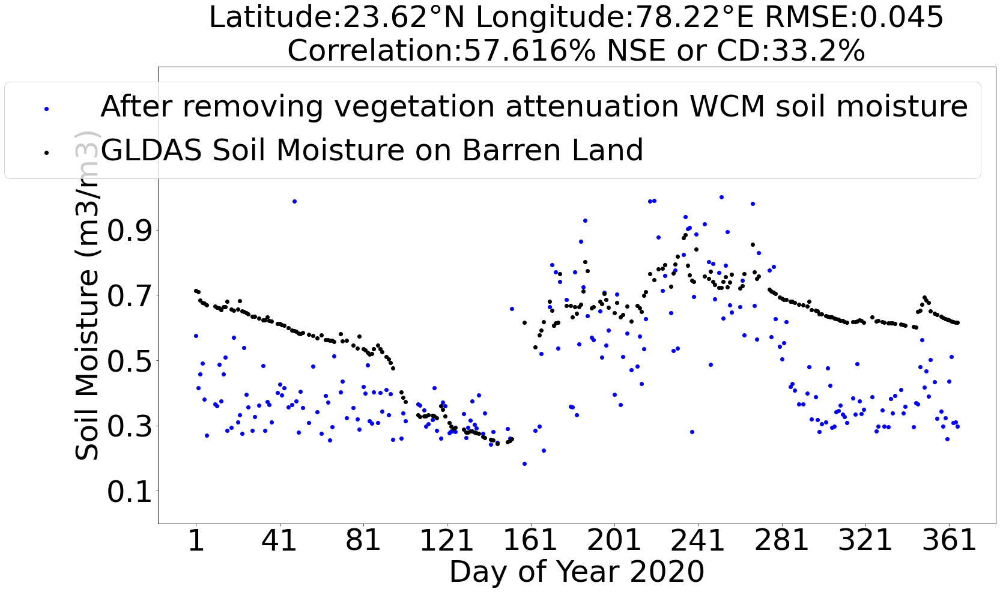

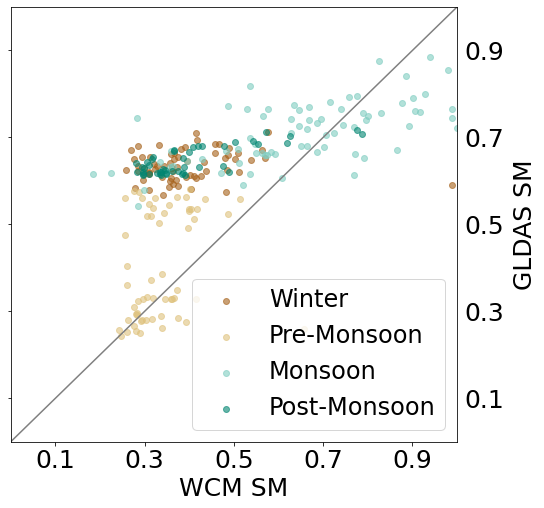

In [57]:
CR = np.array(GLDAS_WCM_SM1.corr())
CR = round((CR[1][2])*100,3)
RMSE = round(np.sum((GLDAS_WCM_SM1['GLDAS_SM'] - GLDAS_WCM_SM1['WCM_SM'])**2)/len(GLDAS_WCM_SM1['GLDAS_SM']),3)

Plotting_Variations(GLDAS_WCM_SM1
                    ,'GLDAS_SM'
                    ,'WCM_SM'
                    ,'GLDAS Soil Moisture on Barren Land'
                    ,'After removing vegetation attenuation WCM soil moisture'
                    ,lat,lon,RMSE,CR)

### 3. Correlation of SMAP with initialized GLDAS soil moisture

In [58]:
GLDAS_SM1['Day_No'] = pd.DataFrame(np.array(SMAP_SM['Day_No']))
GLDAS_SM1['SMAP_SM'] = SMAP_SM['SMAP_SM']
GLDAS_SM1.corr()

,GLDAS_SM,Day_No,SMAP_SM
GLDAS_SM,1.000000,0.344229,0.698328
Day_No,0.344229,1.000000,0.294781
SMAP_SM,0.698328,0.294781,1.000000


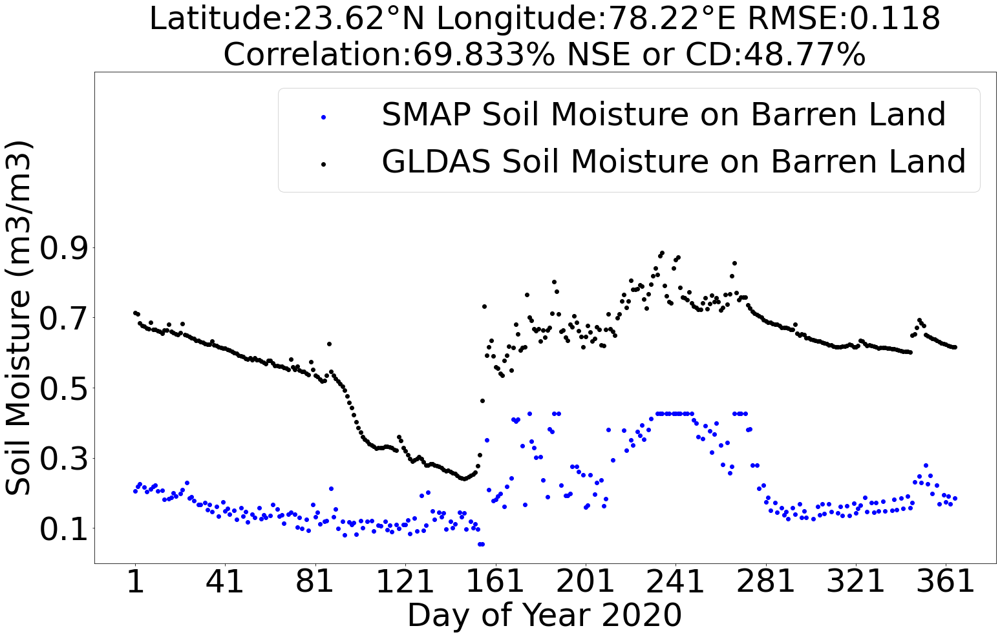

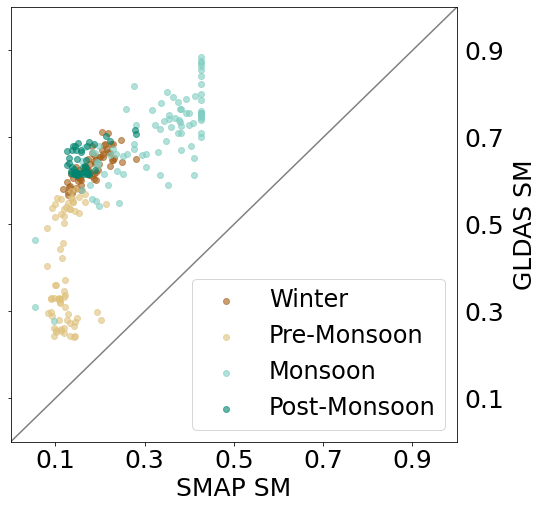

In [59]:
CR = np.array(GLDAS_SM1.corr())
CR = round((CR[2][0])*100,3)
RMSE = round(np.sum((GLDAS_SM1['GLDAS_SM'] - GLDAS_SM1['SMAP_SM'])**2)/len(GLDAS_SM1['GLDAS_SM']),3)

Plotting_Variations(GLDAS_SM1
                    ,'GLDAS_SM'
                    ,'SMAP_SM'
                    ,'GLDAS Soil Moisture on Barren Land'
                    ,'SMAP Soil Moisture on Barren Land'
                    ,lat,lon,RMSE,CR)

+ GLDAS to SMAP has RMSE of 0.118 $m^3/m^3$ with an R-score of 69%
+ Adjusted soil moisture to SMAP has an improved RMSE of 0.059 $m^3/m^3$ with an improved R-score of 76%
+ We can see that the adjusted soil moisture has quite improvement in RMSE

### Demerits of Ulaby's WCM
+ Adjusted $E_1$ and $E_2$ are highly negative so it neglects all the terms in the model leaving $CM_v+D$.
+ This happened because of the frequency dependency of the Ulaby's model.
+ So in order to account for all the terms we need to modify the equation for GPS 1.5 GHz frequency.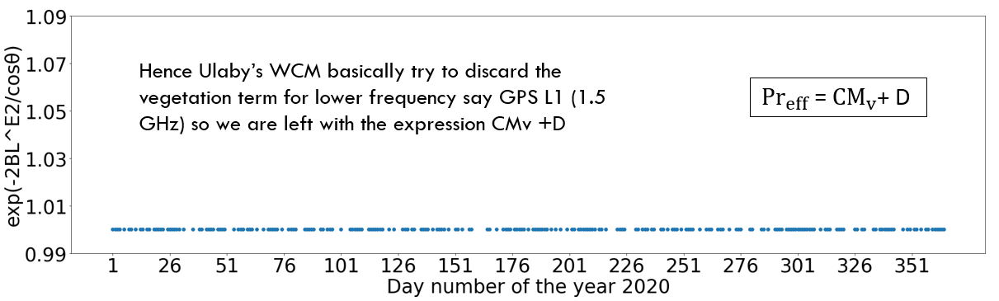

In [60]:
from IPython import get_ipython
get_ipython().magic('reset -sf')

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;"> Extension of Ulaby's Model </p>

#### $${𝐏r_{𝐞𝐟𝐟}} = ({{𝐂}{𝐌_𝐯}+{𝐃}})[1-{\eta_{vs}}{(1-{𝐞^{\frac{{-2}{\beta}}{𝐜𝐨𝐬𝛉}}})}]+{\sigma_{V}}{\eta_{vs}}{(1-{𝐞^{\frac{{-2}{\beta}}{𝐜𝐨𝐬𝛉}}})}$$
Where,
+ ${\beta}$ = kh
+ k = Light Extinction Coefficient
+ h = Height of the vegetation
+ $\eta_{vs}$ = Fraction of backscatter from the vegetated region
+ 𝛉 = CYGNSS specular point incidence angle
+ Preff = Backscatter from CYGNSS
+ Mv = Soil Moisture 
+ $\sigma_{V}$ = Backscatter from the Vegetated region taken as the initialization as the minimum value within the 36 Km grid cell
Where,
####  $${k}  = \frac{-ln(T)}{LAI}$$
+ LAI   = Leaf Area Index
+ T     = Transmitted light (Microwave signal) through the canopy

+ ${\eta_{vs}}{(1-{𝐞^{\frac{{-2}{\beta}}{𝐜𝐨𝐬𝛉}}})}$ varies between 0-1 same as the LAI after substituting LAI as $\beta$ in the expression
+ So we can take whole expression as LAI since LAI have same variations as this expression

### Assuming $$ {\zeta} =  {\eta_{vs}}{(1-{𝐞^{\frac{{-2}{\beta}}{𝐜𝐨𝐬𝛉}}})}$$
#### $${𝐏r_{𝐞𝐟𝐟}} = ({{𝐂}{𝐌_𝐯}+{𝐃}})(1-{\zeta})+{\sigma_{V}}{\zeta}$$
Where,
+ ${\zeta}$ = LAI
+ Preff = Backscatter from CYGNSS
+ Mv = Soil Moisture 
+ $\sigma_{V}$ = Backscatter from the Vegetated region taken as the initialization as the minimum value within the 36 Km grid cell

<a id="1"></a>
## <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;"> Non-linear least square adjustment </p>
   + Performing adjustment for the soil moisture in a particular pixel of SMAP for daily data
   + Actually number of parameters to be estimated was 4 (C, D, Sv and Mvt)
   + Minimum number of observations required should be more than 4 for the adjustment in daily data
   + So in order to account for the day with the low number of observations I have applied adjustment for whole year data
     + I have gathered those days having at least 1 observation
     + Mvt was not considered for the day having no observations
     + Parameters were nD1+nD2+2
        + Where nD1 = Number of all days soil moisture as parameters which has at least one observation
        + Where nD2 = Number of all days back-scatter from vegetation as parameters which has at least one observation

# Loading Libraries and functions

In [61]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import seaborn as sns
import sympy
from sympy import *

import Preparing_Dataset_for_BatchProcessing
import imp
imp.reload(Preparing_Dataset_for_BatchProcessing)
import Preparing_Dataset_for_BatchProcessing as r5

import matplotlib.pyplot as plt
import seaborn as sns

In [62]:
lat = 23.62   # Latitude of the centroid of the grid cell
lon = 78.22   # Longitude of the centroid of the grid cell
DF_batch = r5.Data_Batch_2020(lat,lon)
DF_batch = DF_batch[DF_batch['LAI']<1]
DF_batch[DF_batch['Day_No']==6]

,SR_eff,SP_I,sp_lat,sp_lon,LAI,Day_No
0,1.338698,12.005059,23.538832,78.059140,0.0,6.0
1,1.101488,11.969226,23.526140,78.085160,0.0,6.0
2,0.773465,11.861786,23.488018,78.163140,0.0,6.0
3,0.700457,11.825986,23.475307,78.189125,0.0,6.0
4,1.106099,11.790198,23.462587,78.215100,0.0,6.0
5,1.409840,11.754416,23.449860,78.241070,0.0,6.0


#### Resampling GLDAS data from 25 km to 36 km grid cell for initialization purpose

### Tagging the daily soil moisture their daily CYGNSS observations
+ Minimum of CYGNSS backscatter to initialize the backscatter from vegetation
+ GLDAS soil moisture to initialize the soil moisture

In [63]:
GLDAS_Path = f'D:\EG\Project Data\CYGNSS_Obs_Chambal_{lat}_{lon}'+f'\GLDAS_SM_{lat}_{lon}_Day_1-366.csv'
GLDAS_SM1  = pd.read_csv(GLDAS_Path)
GLDAS_SM1  = GLDAS_SM1.drop(np.array(GLDAS_SM1.keys())[:-1],axis=1)
GLDAS_SM   = np.array(GLDAS_SM1['GLDAS_SM'])
Mv0        = GLDAS_SM

SM_initialized = []
for i in range(len(DF_batch)):
    D = np.array(DF_batch['Day_No'])[i]-1
    SM_initialized.append(Mv0[int(D)])
DF_batch['GLDAS_SM'] = SM_initialized

def Minimum(DF_batch,D):
    DF = DF_batch[DF_batch['Day_No']==D]
    DF1 = DF['SR_eff']
    return np.min(DF1)

def Mean(DF_batch,D):
    DF = DF_batch[DF_batch['Day_No']==D]
    DF1 = DF['SR_eff']
    return np.mean(DF1)

Sv_initialized = []
for j in range(len(DF_batch)):
    D = np.array(DF_batch['Day_No'])[j]
    DF_batch1 = DF_batch[(DF_batch['Day_No']==D)]
    Sv1 = Minimum(DF_batch,D)
    Sv_initialized.append(Sv1)   

DF_batch['Sv'] = Sv_initialized
DF_batch

,SR_eff,SP_I,sp_lat,sp_lon,LAI,Day_No,GLDAS_SM,Sv
0,6.038855,23.059137,23.690813,78.065280,0.881,1.0,0.712536,4.631810
1,4.631810,23.067894,23.704811,78.091160,0.896,1.0,0.712536,4.631810
2,5.398931,23.076675,23.718813,78.117065,0.877,1.0,0.712536,4.631810
3,4.923258,23.085495,23.732817,78.142960,0.877,1.0,0.712536,4.631810
4,5.827567,23.094381,23.746794,78.168884,0.932,1.0,0.712536,4.631810
...,...,...,...,...,...,...,...,...
11,1.736492,23.198532,23.745024,78.254050,0.000,365.0,0.616134,1.018664
12,1.791297,23.174530,23.758152,78.280110,0.000,365.0,0.616134,1.018664
13,1.481883,23.150581,23.771260,78.306160,0.000,365.0,0.616134,1.018664
14,1.204441,23.126648,23.784369,78.332220,0.000,365.0,0.616134,1.018664


In [64]:
Df1 = DF_batch
DD  = (Df1['Day_No'])
DD  = DD.drop_duplicates()
DD

0       1.0
3       2.0
10      3.0
0       4.0
0       5.0
      ...  
0     361.0
3     362.0
0     363.0
0     364.0
0     365.0
Name: Day_No, Length: 243, dtype: float64

In [65]:
DF_batch['LAI'].value_counts()

0.000    2630
0.334      10
0.293       9
0.320       8
0.657       7
         ... 
0.251       1
0.345       1
0.464       1
0.199       1
0.881       1
Name: LAI, Length: 258, dtype: int64

+ So here total 243 unique days are available for adjustment
+ Therefore we will have 243 soil moisture data after adjustment

In [66]:
Sgma0    = Df1['SR_eff']       # CYGNSS back-scatter
L        = Df1['LAI']          # LAI data from NOAA
GLDAS_SM = Df1['GLDAS_SM']     # CYGNSS inclination angle 
S_v      = Df1['Sv']           # GLDAS soil moisture data for the initialization purpose
Day_No   = Df1['Day_No']       # Unique days so that the initialization tagged appropriately

### Modified Water Cloud Model Equation
$${𝐏r_{𝐞𝐟𝐟}} = ({{𝐂}{𝐌_𝐯}+{𝐃}})(1-{\zeta})+{\sigma_{V}}{\zeta}$$
Where,
+ ${\zeta}$ = LAI
+ Preff = Backscatter from CYGNSS
+ Mv = Soil Moisture 
+ $\sigma_{V}$ = Backscatter from the Vegetated region taken as the initialization as the minimum value within the 36 Km grid cell

In [67]:
# Creating Variables
Sv, l, c, d, Mvt, Sgma = symbols('Sv l c d Mvt Sgma')

# Modified Water Cloud Model Equation
f   = Sgma-(Sv*l+(c*Mvt+d)*(1-l))
f

Sgma - Sv*l - (1 - l)*(Mvt*c + d)

### Model Parameters (n, u, r, P)
+ n = number of observations
+ r = redundancy 
+ u = number of unknowns
+ P = weight matrix (assumed as identity giving equal weights to all the observations)

In [68]:
def Adjustment_Parameters1(Sgma0,DD):
    P = np.identity(len(Sgma0))         # Weight matrix (Precision matrix)
    n = len(Sgma0)                      # As total n erroneous observations are there  
    u = 2+2*len(DD)  # C, D, Svt6, ..., Svt365, Mvt6, ..., Mvt365 Assume those day soil moisture only having Biomass
    r = n-u          # Redundancy
    return P,n,u,r

P,n,u,r = Adjustment_Parameters1(Sgma0,DD)
u1 = int((u-2)/2)
P,n,u,r,u1

(array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 0., 0.],
        [0., 0., 0., ..., 0., 1., 0.],
        [0., 0., 0., ..., 0., 0., 1.]]),
 3198,
 488,
 2710,
 243)

### Generating Design Matrix
#### Deriving the Jacobian

In [69]:
%%time
def Der(f,var):
    A1 = (Derivative(f,var)).doit()
    return A1

def Design_Matrix1(Df1,Sv,c,d,Mvt,DD):
    C1 = Der(f,Sv)
    C2 = Der(f,c)
    C3 = Der(f,d)
    A1 = []
    for j in range(len(Df1)):
        Single_Row_A = []
        for i in range(len(DD)):
            d1 = np.array(DD)[i]
            d2 = int(np.array(Df1['Day_No'])[j])
            if d1 == d2:
                Single_Row_A += [C1]
            else:
                Single_Row_A += [0]
                
        Single_Row_A += [C2]
        Single_Row_A += [C3]
        A1 += Single_Row_A
    A2 = np.array(A1)
    A1 = A2.reshape(len(Df1),(len(DD)+2))  
    return A1

def Design_Matrix2(Df1,Sv,c,d,Mvt,DD):
    C4 = Der(f,Mvt)
    A1 = []
    for j in range(len(Df1)):
        Single_Row_A = []
        for i in range(len(DD)):
            d1 = np.array(DD)[i]
            d2 = int(np.array(Df1['Day_No'])[j])
            if d1 == d2:
                Single_Row_A += [C4]
            else:
                Single_Row_A += [0]
        A1 += Single_Row_A
    A2 = np.array(A1)
    A1 = A2.reshape(len(Df1),len(DD))  
    return A1

def Design_Matrix(Df1,Sv,c,d,Mvt,DD):
    A1 = Design_Matrix1(Df1,Sv,c,d,Mvt,DD)
    A1 = pd.DataFrame(A1)
    
    A2 = Design_Matrix2(Df1,Sv,c,d,Mvt,DD)
    A2 = pd.DataFrame(A2)
    
    A  = pd.concat([A1, A2], axis=1)
    return np.array(A)

A1 = Design_Matrix(Df1,Sv,c,d,Mvt,DD)
pd.DataFrame(A1)

Wall time: 23.5 s


,0,1,2,3,4,5,6,7,8,9,...,478,479,480,481,482,483,484,485,486,487
0,-l,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,-l,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-l,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-l,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-l,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,c*(l - 1)
3194,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,c*(l - 1)
3195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,c*(l - 1)
3196,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,c*(l - 1)


### Substituting values in Jacobian to get the design matrix

In [70]:
def Resubstituting_Values(A1,Sgma0,L,S_v,SM_GLDAS,c0,d0):
    n1,n2 = A1.shape
    A_1   = []
    for i in range(n1):
        Sgma1  = np.array(Sgma0)[i]
        L1     = np.array(L)[i]
        Mv0    = np.array(SM_GLDAS)[i]
        Sv0    = np.array(S_v)[i]
        for j in range(n2):
            a1 = A1[i][j]
            if a1!=0:
                aij = a1.subs({Sgma:Sgma1,l:L1,Sv:Sv0,Mvt:Mv0,c:c0,d:d0})
                A_1.append(aij)
            else:
                A_1.append(0)
    A_1 = np.array(A_1)    
    A1  = A_1.reshape(n1,n2)
    A   = np.array(A1)
    return A

### Setting initial values to the Model parameters 
+ Used Hit and Trail Method to approximate these values

In [71]:
c0    = 20
d0    = -1

### Adding the initialized soil moisture 

In [72]:
DFT        = DF_batch.drop_duplicates(subset=['Day_No'])
SM_initial = np.array(DFT['GLDAS_SM'])
Sv_initial = np.array(DFT['Sv'])

X0         = []
for i in range(len(Sv_initial)):
    X0.append(Sv_initial[i])
    
X0.append(c0)
X0.append(d0)
for i in range(len(SM_initial)):
    X0.append(SM_initial[i])
pd.DataFrame(X0)

,0
0,4.631810
1,1.703947
2,2.791710
3,2.054713
4,1.437340
...,...
483,0.623587
484,0.619572
485,0.617998
486,0.616732


+ X0 is the initial parameter vector

In [73]:
%%time
A = Resubstituting_Values(A1,Sgma0,L,S_v,GLDAS_SM,c0,d0)
pd.DataFrame(A)

Wall time: 8.79 s


,0,1,2,3,4,5,6,7,8,9,...,478,479,480,481,482,483,484,485,486,487
0,-0.881000000000000,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,-0.896000000000000,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-0.877000000000000,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.877000000000000,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-0.932000000000000,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-20
3194,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-20
3195,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-20
3196,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-20


In [74]:
A = pd.DataFrame(A)
A.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_{lat}_{lon}.csv',index = False)
A = pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_{lat}_{lon}.csv')
A = (np.array(A))

### Deriving the residual matrix

In [75]:
%%time
def Misclosure(Sgma0,L,S_v,SM_GLDAS,c0,d0,f):
    W_0 = []
    for i in range(len(Sgma0)):
        Sgma1  = np.array(Sgma0)[i]
        L1     = np.array(L)[i]
        Mv0    = np.array(SM_GLDAS)[i]
        Sv0    = np.array(S_v)[i]
        f5 = f.subs({Sgma:Sgma1,l:L1,Sv:Sv0,Mvt:Mv0,c:c0,d:d0})
        W_0.append(f5)
    W_0 = np.array(W_0)
    W1 = W_0.reshape(len(Sgma0),1)
    return W1

W = Misclosure(Sgma0,L,S_v,GLDAS_SM,c0,d0,f)
W = pd.DataFrame(W)
W.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_{lat}_{lon}.csv',index = False)
W = pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_{lat}_{lon}.csv')
W = (np.array(W))

Wall time: 7.12 s


### Deriving the normal matrix

In [76]:
%%time
N = np.array(np.transpose(A)@P@A)

# Converting the elements of the matrix from the object to the float
def Object_toFloat(Matrix):
    m,n = Matrix.shape
    M1 = []
    for i in range(m):
        for j in range(n):
            M1.append(float(Matrix[i,j]))
    M2 = np.array(M1)
    M = M2.reshape(m,n)
    return M

N = Object_toFloat(N)
N = pd.DataFrame(N) 
N

Wall time: 210 ms


,0,1,2,3,4,5,6,7,8,9,...,478,479,480,481,482,483,484,485,486,487
0,3.985859,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.0000,0.0
1,0.000000,3.812341,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.0000,0.0
2,0.000000,0.000000,0.613089,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.0000,0.0
3,0.000000,0.000000,0.000000,0.919681,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.0000,0.0
4,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,0.0000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
483,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,515.7076,0.0000,0.0,0.0000,0.0
484,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,87.4588,0.0,0.0000,0.0
485,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,1200.0,0.0000,0.0
486,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,3600.0392,0.0


In [77]:
%%time
U = (np.transpose(A))@P@W
#U

Wall time: 116 ms


### Updates in initialized parameters

In [78]:
Part1  = np.linalg.pinv(N)       ## Inverse of N
Part2  = Object_toFloat(Part1)   ## Converting elements to float
dX     = -Part2@U                ## Change in X
np.max(abs(dX))

313.01315890502883

In [79]:
X0 = np.array(X0)
X0 = X0.reshape(len(X0),1)
X  = X0+dX
#X

### Creating Index for updating parameters

In [80]:
Df = pd.DataFrame(DF_batch['Day_No'].value_counts(sort=False))['Day_No']
DD = Df.values
idx = []
m = 0
for i in range(len(DD)):
    j = DD[i]
    for k in range(j):
        idx.append(m)
    m = m+1
np.array(idx).shape

(3198,)

## 1st Iteration

In [81]:
X_SM = X[u1+2:]
X_Sv = X[:u1+2]
X_SM.shape,X_Sv.shape

((243, 1), (245, 1))

### Updating soil moisture and back-scatter from vegetation

In [82]:
Mv0 = X_SM
DF_batch1 = DF_batch.drop(['GLDAS_SM'], axis=1)
#Mv0

In [83]:
def New_SM(DF_batch,X_Sv,X_SM,idx):
    Mv0 = X_SM
    DF_batch1 = DF_batch.drop(['GLDAS_SM'], axis=1)
    SM_initialized = []
    for i in range(len(DF_batch1)):
        D  = int(np.array(idx)[i])
        SM = Mv0[D]
        SM_initialized.append(SM)
    SM_initialized = np.array(SM_initialized).reshape(len(SM_initialized),) 
    
    Mv0 = X_Sv
    DF_batch2 = DF_batch.drop(['Sv'], axis=1)
    Sv_initialized = []
    for j in range(len(DF_batch2)):
        D  = int(np.array(idx)[j])
        Sv = Mv0[D]
        Sv_initialized.append(Sv)
    Sv_initialized = np.array(Sv_initialized).reshape(len(Sv_initialized),) 
    return SM_initialized, Sv_initialized

In [84]:
%%time
GLDAS_SM,S_v = New_SM(DF_batch,X_Sv,X_SM,idx)
A            = Resubstituting_Values(A1,Sgma0,L,S_v,GLDAS_SM,X[u1][0],X[u1+1][0])
A            = pd.DataFrame(A)
A.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_{lat}_{lon}.csv',index = False)
A            = pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_{lat}_{lon}.csv')
A            = (np.array(A))
W            = Misclosure(Sgma0,L,S_v,GLDAS_SM,X[u1][0],X[u1+1][0],f)
W            = pd.DataFrame(W)
W.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_{lat}_{lon}.csv',index = False)
W            = pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_{lat}_{lon}.csv')
W            = (np.array(W))
N            = np.array(np.transpose(A)@P@A)
U            = (np.transpose(A))@P@W
N            = Object_toFloat(N)
Part1        = np.linalg.pinv(N)       ## Inverse of N
Part2        = Object_toFloat(Part1)   ## Converting elements to float
dX1          = -Part2@U                ## Change in X

Wall time: 19.3 s


#### Setting threshold to stop the adjustment

In [85]:
np.max(abs(dX1-dX))<10**(-5)

False

+ Subsequent change in the parameters is more than the threshold so we need to perform more iterations here

#### Updated parameters for next iteration

In [86]:
X = X+dX1
#X

### Performing more Iteration

In [87]:
def Adjustment_Parameters(DF_batch,idx,A1,Sgma0,L,X,f):
    X_SM = X[u1+2:]
    X_Sv = X[:u1]
    GLDAS_SM,S_v = New_SM(DF_batch,X_Sv,X_SM,idx)
    A        = Resubstituting_Values(A1,Sgma0,L,S_v,GLDAS_SM,X[u1][0],X[u1+1][0])
    A        = pd.DataFrame(A)
    A.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_{lat}_{lon}.csv',index = False)
    A        = pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_{lat}_{lon}.csv')
    A        = (np.array(A))
    W        = Misclosure(Sgma0,L,S_v,GLDAS_SM,X[u1][0],X[u1+1][0],f)
    W        = pd.DataFrame(W)
    W.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_{lat}_{lon}.csv',index = False)
    W        = pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_{lat}_{lon}.csv')
    W        = (np.array(W))
    N        = np.array(np.transpose(A)@P@A)
    U        = (np.transpose(A))@P@W
    N        = Object_toFloat(N)
    Part1    = np.linalg.pinv(N)       ## Inverse of N
    Part2    = Object_toFloat(Part1)   ## Converting elements to float
    dX       = -Part2@U                ## Change in X
    return A,W,N,U,dX

dX = dX1
for i in range(1,200):
    A,W,N,U,dX1 = Adjustment_Parameters(DF_batch,idx,A1,Sgma0,L,X,f)
    Thres       = np.max(abs(dX-dX1))
    if Thres<10**(-5):
        A_adjusted  = A
        W_adjusted  = W
        N_adjusted  = N
        U_adjusted  = U
        X_adjusted  = X
        dX_adjusted = dX
        Number_Iteration = i
        break
    else:
        dX = dX1
        X  = X+dX
        
A_adjusted  = pd.DataFrame(A_adjusted)
W_adjusted  = pd.DataFrame(W_adjusted)
N_adjusted  = pd.DataFrame(N_adjusted)
U_adjusted  = pd.DataFrame(U_adjusted)
X_adjusted  = pd.DataFrame(X_adjusted)
dX_adjusted = pd.DataFrame(dX_adjusted)
Thres_Iter  = pd.DataFrame(np.array([Thres,Number_Iteration+1]))

A_adjusted.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_adjusted_{lat}_{lon}.csv',index = False)
W_adjusted.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_adjusted_{lat}_{lon}.csv',index = False)
N_adjusted.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\N_adjusted_{lat}_{lon}.csv',index = False)
U_adjusted.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\U_adjusted_{lat}_{lon}.csv',index = False)
X_adjusted.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\X_adjusted_{lat}_{lon}.csv',index = False)
dX_adjusted.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\dX_adjusted_{lat}_{lon}.csv',index = False)
Thres_Iter.to_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\Thres_Iter_{lat}_{lon}.csv',index = False)

A_adjusted  = (np.array(pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\A_adjusted_{lat}_{lon}.csv')))
W_adjusted  = (np.array(pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\W_adjusted_{lat}_{lon}.csv')))
N_adjusted  = (np.array(pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\N_adjusted_{lat}_{lon}.csv')))
U_adjusted  = (np.array(pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\U_adjusted_{lat}_{lon}.csv')))
X_adjusted  = (np.array(pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\X_adjusted_{lat}_{lon}.csv')))
dX_adjusted = (np.array(pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\dX_adjusted_{lat}_{lon}.csv')))
Thres_Iter  = (np.array(pd.read_csv(rf'D:\EG\Project Data\LAI_Obsvn_Adjustment_Params\Thres_Iter_{lat}_{lon}.csv')))

print('Threshold = ',Thres_Iter[0][0])
print('Number of Iterations = ',Thres_Iter[1][0])
A = pd.DataFrame(A_adjusted) 
A

Threshold =  4.0993545795968215e-09
Number of Iterations =  4.0


,0,1,2,3,4,5,6,7,8,9,...,478,479,480,481,482,483,484,485,486,487
0,-0.881,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,-0.896,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,-0.877,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
3,-0.877,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
4,-0.932,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886
3194,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886
3195,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886
3196,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886


In [88]:
W = pd.DataFrame(W_adjusted) 
W

,0
0,0.750562
1,-0.754489
2,0.136773
3,-0.338901
4,0.206055
...,...
3193,0.316547
3194,0.371351
3195,0.061938
3196,-0.215504


In [89]:
N = pd.DataFrame(N_adjusted) 
N

,0,1,2,3,4,5,6,7,8,9,...,478,479,480,481,482,483,484,485,486,487
0,3.985859,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,3.812341,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.613089,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.919681,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
483,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,438.674702,0.000000,0.000000,0.000000,0.000000
484,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,74.394799,0.000000,0.000000,0.000000
485,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,1020.752152,0.000000,0.000000
486,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,3062.289801,0.000000


In [90]:
X = pd.DataFrame(X_adjusted) 
X

,0
0,6.065804
1,3.234662
2,2.731341
3,2.936430
4,1.437334
...,...
483,0.643073
484,0.075380
485,0.273174
486,0.261176


In [91]:
dX = pd.DataFrame(dX_adjusted)
dX

,0
0,1.135785e-14
1,-4.250966e-15
2,3.185747e-11
3,2.532641e-16
4,-1.460879e-19
...,...
483,-1.376518e-10
484,3.679851e-10
485,1.888170e-10
486,1.983136e-10


### Design Matrix Corresponding to WCM Parameters

In [92]:
pd.DataFrame(X[:u1+2])

,0
0,6.065804
1,3.234662
2,2.731341
3,2.936430
4,1.437334
...,...
240,0.624446
241,1.044224
242,1.018665
243,18.445886


In [93]:
pd.DataFrame(A_adjusted[:,:u1+2])

,0,1,2,3,4,5,6,7,8,9,...,235,236,237,238,239,240,241,242,243,244
0,-0.881,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.019421,-0.119
1,-0.896,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.016973,-0.104
2,-0.877,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.020074,-0.123
3,-0.877,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.020074,-0.123
4,-0.932,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.011098,-0.068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.265547,-1.000
3194,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.265547,-1.000
3195,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.265547,-1.000
3196,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.265547,-1.000


### Design Matrix corresponding to the Soil Moisture

In [94]:
pd.DataFrame(X[u1+2:])

,0
245,0.163202
246,0.288977
247,0.351724
248,0.429418
249,0.322224
...,...
483,0.643073
484,0.075380
485,0.273174
486,0.261176


In [95]:
pd.DataFrame(A_adjusted[:,u1+2:])

,0,1,2,3,4,5,6,7,8,9,...,233,234,235,236,237,238,239,240,241,242
0,-2.195060,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
1,-1.918372,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,-2.268844,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
3,-2.268844,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
4,-1.254320,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3193,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886
3194,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886
3195,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886
3196,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.445886


<a id="1"></a>
## <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:4px 4px;">Hypothesis Test</p>

In [96]:
S   = np.transpose(W)@P@W/r       ## Sum of the square of the residuals
S02 = np.std(Sgma0)               ## Standard deviation in original observed backscatter
r

2710

+ For 5 % significance level 
  + From look up table critical value:
    + DOF = r , alpha = 0.05
    + Critical value, P = r-1 

In [97]:
Test_Statistic = r*S02/S[0][0]
P = r-1
Test_Statistic<P,Test_Statistic

(True, 1612.851609920013)

+ Test statistic is less than critical value 

### Orthogonality Test 

In [98]:
V = np.transpose(A)@W 
np.sum(V**2)<10**(-20),np.sum(V**2)

(0    True
 dtype: bool,
 0    2.490701e-23
 dtype: float64)

<a id="1"></a>
## <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:4px 4px;">Validation of Adjusted Soil Moisture</p>

# 1. Correlation of adjusted with SMAP soil moisture

In [99]:
DD1 = DF_batch['Day_No'].drop_duplicates()
DD  = DD1.values
SM_adjusted = X[u1+2:].values

SMAP_SM = pd.read_csv(f'D:\EG\Project Data\CYGNSS_Data_in_0p36Dg\SMAP_RF_SM\SMAP_SM_Variations_{lat}_{lon}.csv')  
SMAP_SM['SMAP_SM'] = SMAP_SM['SMAP_SM']/100
x2  = np.array(SMAP_SM['SMAP_SM'])

SMAP_SM_filter = []
for j in range(len(DD)):
    D2 = int(DD[j])
    SMAP_SM_filter.append(np.array(SMAP_SM['SMAP_SM'])[D2-1])
    
Df = pd.DataFrame(DD)
Df.columns = ['Day_No'] 
Df['SMAP_SM'] = SMAP_SM_filter
Df['Improved_SM'] = SM_adjusted
Df = Df[(Df['Improved_SM']<0.8) & (Df['Improved_SM']>=0)]

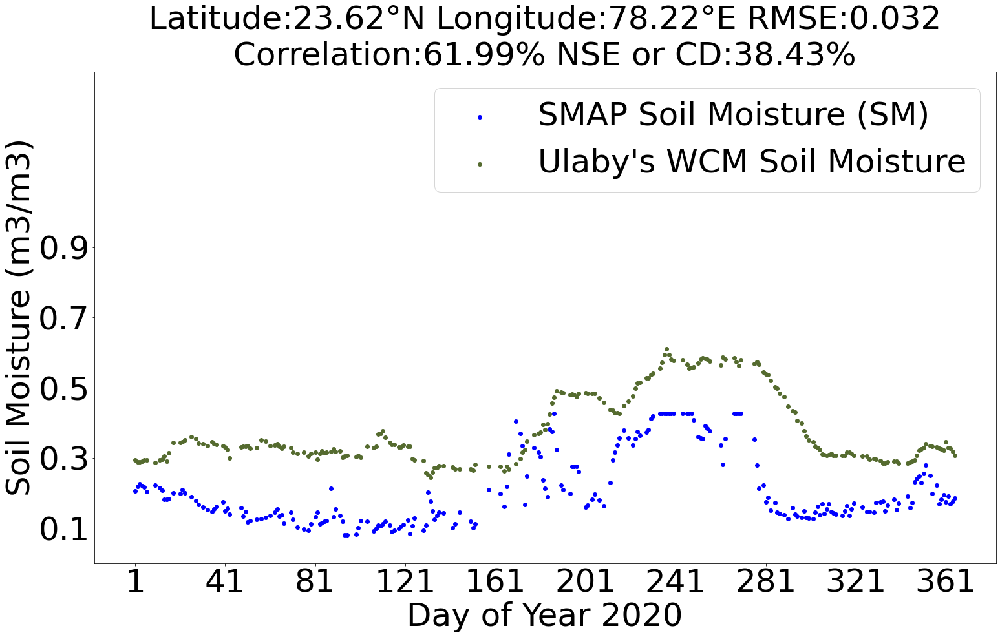

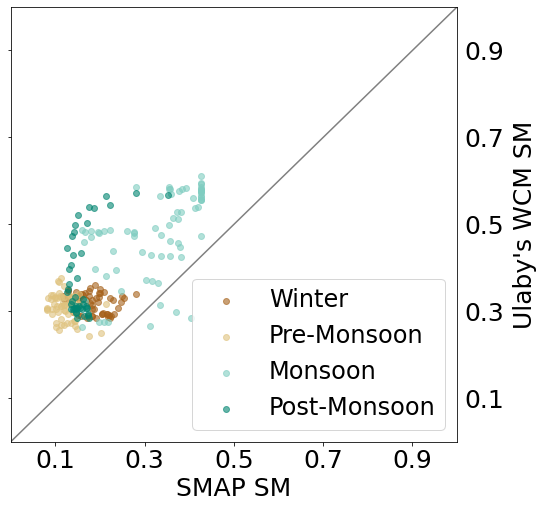

In [100]:
def Annual_To_Pre_Post_Monsoon1(DF):
    PSM = []
    i2   = np.array(DF['Day_No'])
    for i1 in range(len(i2)):
        i = i2[i1]
        if ((i>=1) and (i<=60)) or ((i>=336) and (i<=365)):     # Winter: December, January, February
            PSM.append('Winter')
        elif (i>=61) and (i<=152):                              # Pre-Monsoon: March, April, May
            PSM.append('Pre-Monsoon')
        elif (i>=153) and (i<=274):
            PSM.append('Monsoon')                               # Monsoon: June, July, August, September
        elif (i>=275) and (i<=336):
            PSM.append('Post-Monsoon')                          # Post-Monsoon: October, November
    DF['Seasonality'] = PSM
    return DF

def Annual_To_Pre_Post_Monsoon(DF):
    PSM = []
    for i in range(1,366):
        if ((i>=1) and (i<=60)) or ((i>=336) and (i<=365)):     # Winter: December, January, February
            PSM.append('Winter')
        elif (i>=61) and (i<=152):                              # Pre-Monsoon: March, April, May
            PSM.append('Pre-Monsoon')
        elif (i>=153) and (i<=274):
            PSM.append('Monsoon')                               # Monsoon: June, July, August, September
        elif (i>=275) and (i<=336):
            PSM.append('Post-Monsoon')                          # Post-Monsoon: October, November
    DF['Seasonality'] = PSM
    return DF

def Plotting_Var(Df,lat,lon):
    CR = np.array(Df.corr())[1][2]*100
    RMSE = round(np.sum((Df['SMAP_SM'] - Df['Improved_SM'])**2)/len(Df['SMAP_SM']),3)
    Df = Df.append(Df)
    Df['Improved_SM'] = Df['Improved_SM'].rolling(15).mean()
    Df = Df.interpolate(method='linear')
    Df = Df.tail(int(abs(len(Df)/2)))

    plt.figure(figsize=(25,14))
    plt.scatter(Df['Day_No'],Df['SMAP_SM'],label='SMAP Soil Moisture (SM)',color='blue')
    plt.scatter(Df['Day_No'],Df['Improved_SM'],label='''Ulaby's WCM Soil Moisture''',color='darkolivegreen')
    plt.title(f'''Latitude:{lat}°N Longitude:{lon}°E RMSE:{round(RMSE,4)}
Correlation:{np.round(CR,2)}% NSE or CD:{np.round(CR**2/100,2)}%''',size=50) 
    plt.xlabel('Day of Year 2020',size=50)
    plt.ylabel('Soil Moisture (m3/m3)',size=50)
    plt.ylim(0,1.4)
    plt.xticks(np.arange(1, 370, 40),size=50)
    plt.yticks(np.arange(0.1, 1, 0.2),size=50)
    plt.tick_params(axis='both', which='major', labelsize=50)
    plt.legend(fontsize=50)
    
    data=Annual_To_Pre_Post_Monsoon1(Df) 
    import colorbrewer as Cl
    plt.figure(figsize=(8,8))
    DF1  = data[data['Seasonality']=='Winter']
    plt.scatter(DF1['SMAP_SM'],DF1['Improved_SM'],color='#a6611a',label='Winter',alpha=0.6)
    
    DF2  = data[data['Seasonality']=='Pre-Monsoon']
    plt.scatter(DF2['SMAP_SM'],DF2['Improved_SM'],color='#dfc27d',label='Pre-Monsoon',alpha=0.6)
    
    DF3  = data[data['Seasonality']=='Monsoon']
    plt.scatter(DF3['SMAP_SM'],DF3['Improved_SM'],color='#80cdc1',label='Monsoon',alpha=0.6)
    
    DF4  = data[data['Seasonality']=='Post-Monsoon']
    plt.scatter(DF4['SMAP_SM'],DF4['Improved_SM'],color='#018571',label='Post-Monsoon',alpha=0.6)
 
    plt.plot([0,1],[0,1],c='gray')
    plt.xlim(0,1)
    plt.ylim(0,1)
    plt.xticks(np.arange(0.1, 1, 0.2))
    plt.yticks(np.arange(0.1, 1, 0.2))  
    plt.tick_params(axis='both', labelsize=25,labelleft=False, labelright=True)
    plt.ylabel('''Ulaby's WCM SM''', labelpad=-530, fontsize=25)
    plt.xlabel('SMAP SM',fontsize=25)
    plt.legend(fontsize=24,loc='lower right')
    
    
def Plotting_Variations(Df,Var1,Var2,label1,label2,lat,lon,RMSE,CR):
    plt.figure(figsize=(25,14))
    plt.scatter(Df['Day_No'],Df[f'{Var2}'],label = label2,color='blue')
    plt.scatter(Df['Day_No'],Df[f'{Var1}'],label = label1,color='black')
    
    plt.title(f'''Latitude:{lat}°N Longitude:{lon}°E RMSE:{round(RMSE,4)}
Correlation:{CR}% NSE or CD:{np.round(CR**2/100,2)}%''',size=50) 
    plt.xlabel('Day of Year 2020',size=50)
    plt.ylabel('Soil Moisture (m3/m3)',size=50)
    plt.ylim(0,1.4)
    plt.xticks(np.arange(1, 370, 40),size=50)
    plt.yticks(np.arange(0.1, 1, 0.2),size=50)
    plt.legend(fontsize=40)

    data=Annual_To_Pre_Post_Monsoon1(Df.head(365))
    import colorbrewer as Cl
    plt.figure(figsize=(8,8))
    DF1  = data[data['Seasonality']=='Winter']
    plt.scatter(DF1[f'{Var2}'],DF1[f'{Var1}'],color='#a6611a',label='Winter',alpha=0.6)
    
    DF2  = data[data['Seasonality']=='Pre-Monsoon']
    plt.scatter(DF2[f'{Var2}'],DF2[f'{Var1}'],color='#dfc27d',label='Pre-Monsoon',alpha=0.6)
    
    DF3  = data[data['Seasonality']=='Monsoon']
    plt.scatter(DF3[f'{Var2}'],DF3[f'{Var1}'],color='#80cdc1',label='Monsoon',alpha=0.6)
    
    DF4  = data[data['Seasonality']=='Post-Monsoon']
    plt.scatter(DF4[f'{Var2}'],DF4[f'{Var1}'],color='#018571',label='Post-Monsoon',alpha=0.6)
 
    plt.plot([0,1],[0,1],c='gray')
    plt.xlim(0,1)
    plt.ylim(0,1)
    plt.xticks(np.arange(0.1, 1, 0.2))
    plt.yticks(np.arange(0.1, 1, 0.2))  
    plt.tick_params(axis='both', labelsize=25,labelleft=False, labelright=True)
    plt.ylabel(f'{Var1.replace("_SM"," SM")}', labelpad=-530, fontsize=25)
    plt.xlabel(f'{Var2.replace("_SM"," SM")}',fontsize=25)
    plt.legend(fontsize=24,loc='lower right')
Plotting_Var(Df,lat,lon)

# 2. Correlation of adjusted with GLDAS soil moisture

In [101]:
def New_SM1(DF_batch,X_SM,idx):
    Mv0 = X_SM
    SM_initialized = []
    for i in range(len(DF_batch)):
        D  = int(np.array(idx)[i])
        SM = float(Mv0[D])
        SM_initialized.append(SM)
    SM_initialized = np.array(SM_initialized).reshape(len(SM_initialized),) 
    DF_batch['WCM_SM'] = SM_initialized
    return DF_batch

X_SM     = X[u1+2:].values
GLDAS_WCM_SM = New_SM1(DF_batch,X_SM,idx)
GLDAS_WCM_SM1 = GLDAS_WCM_SM.drop(['SR_eff','SP_I','sp_lat','sp_lon','LAI'], axis=1)
GLDAS_WCM_SM1 = GLDAS_WCM_SM1.drop_duplicates()
GLDAS_WCM_SM1['Sv'] = GLDAS_WCM_SM1['Sv']/20
GLDAS_WCM_SM1 = GLDAS_WCM_SM1[(GLDAS_WCM_SM1['WCM_SM']<0.8)]
GLDAS_WCM_SM1 = GLDAS_WCM_SM1[(GLDAS_WCM_SM1['WCM_SM']>0)]
GLDAS_WCM_SM1.corr()

,Day_No,GLDAS_SM,Sv,WCM_SM
Day_No,1.000000,0.344890,0.045282,0.132926
GLDAS_SM,0.344890,1.000000,0.411082,0.470217
Sv,0.045282,0.411082,1.000000,0.759628
WCM_SM,0.132926,0.470217,0.759628,1.000000


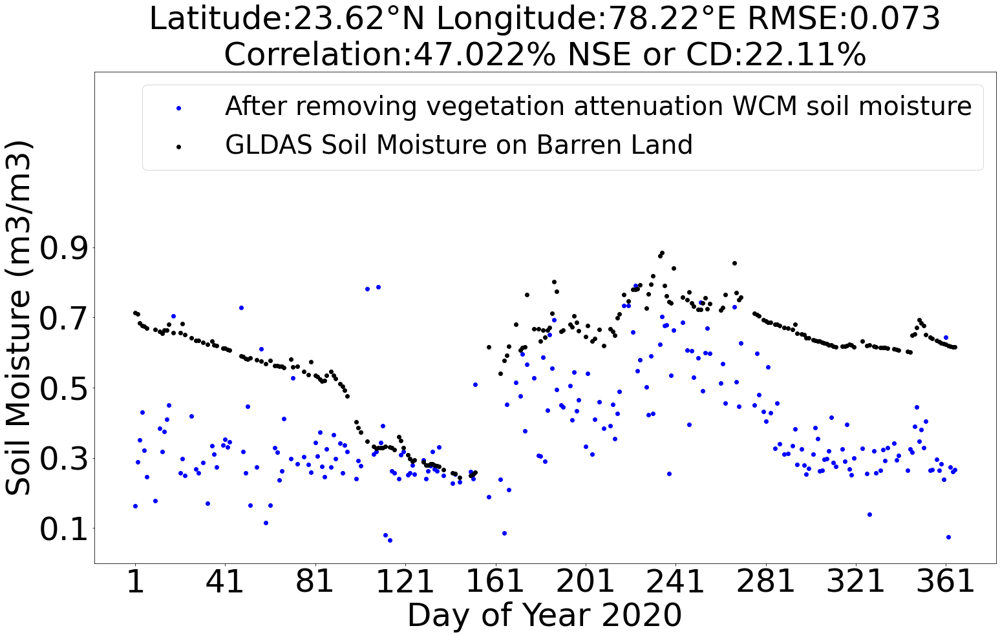

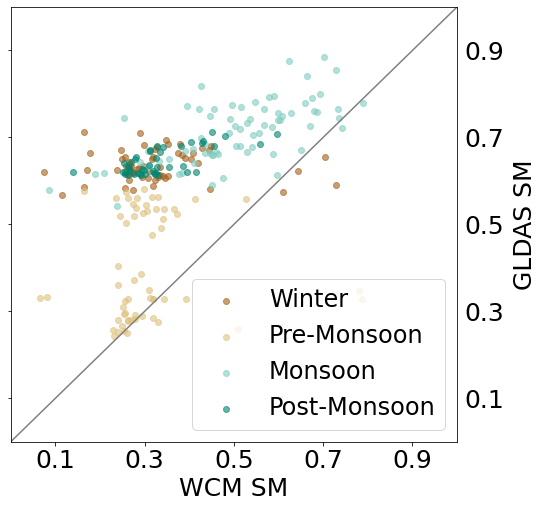

In [102]:
CR   = np.array(GLDAS_WCM_SM1.corr())
CR   = round((CR[1][3])*100,3)
RMSE = round(np.sum((GLDAS_WCM_SM1['GLDAS_SM'] - GLDAS_WCM_SM1['WCM_SM'])**2)/len(GLDAS_WCM_SM1['GLDAS_SM']),3)

Plotting_Variations(GLDAS_WCM_SM1
                    ,'GLDAS_SM'
                    ,'WCM_SM'
                    ,'GLDAS Soil Moisture on Barren Land'
                    ,'After removing vegetation attenuation WCM soil moisture'
                    ,lat,lon,RMSE,CR)

# 3. Correlation of adjusted vegetation back-scatter with GLDAS soil moisture

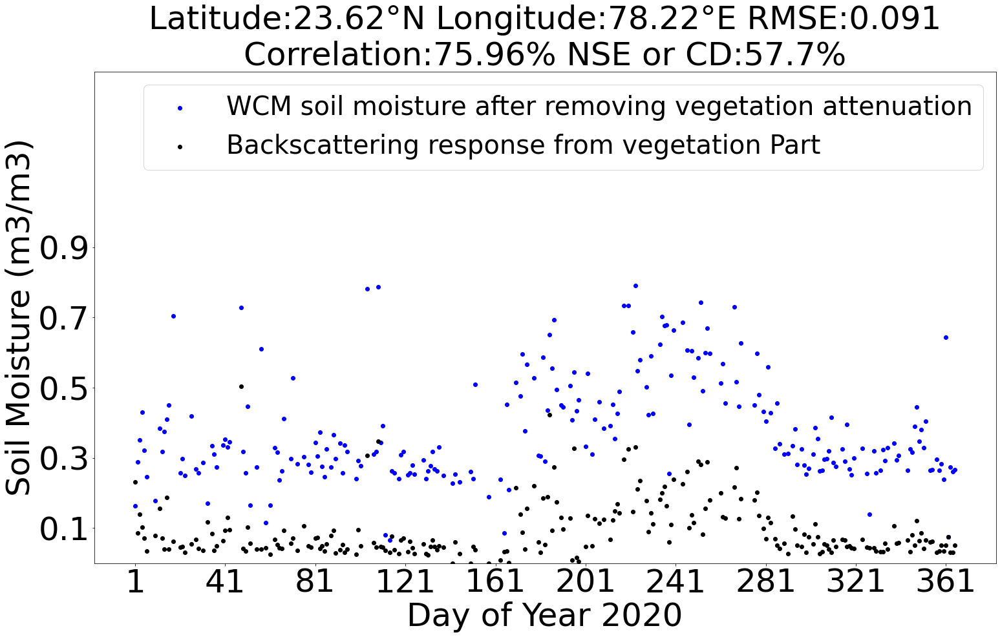

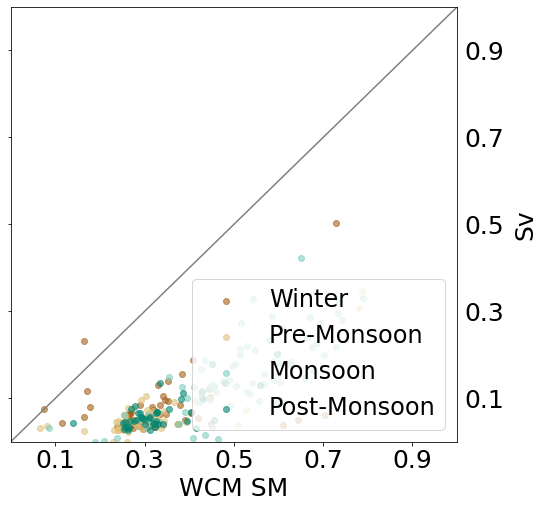

In [103]:
CR   = np.array(GLDAS_WCM_SM1.corr())
CR   = round((CR[2][3])*100,2)
RMSE = round(np.sum((GLDAS_WCM_SM1['Sv'] - GLDAS_WCM_SM1['WCM_SM'])**2)/len(GLDAS_WCM_SM1['Sv']),3)

Plotting_Variations(GLDAS_WCM_SM1
                    ,'Sv'
                    ,'WCM_SM'
                    ,'Backscattering response from vegetation Part'
                    ,'WCM soil moisture after removing vegetation attenuation'
                    ,lat,lon,RMSE,CR)

# Conclusion

+ Developed modified water cloud model
+ GLDAS to SMAP has RMSE of 0.118 $m^3/m^3$ with an R-score of 69%
+ We can see that the adjusted soil moisture has quite improvement in RMSE
+ The RMSE is improved from 0.059 to 0.032 $m^3/m^3$

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Applying Semi-Empirical Model on 96 pixels</p>

# Ulaby's WCM

In [104]:
import WCM_Bach_Processing_NLS_Adjustment
import imp
imp.reload(WCM_Bach_Processing_NLS_Adjustment)
import WCM_Bach_Processing_NLS_Adjustment as r1

# lat = [22.18,22.54,22.9,23.26,23.62,23.98,24.34,24.7,25.06,25.42,25.78,26.14,26.5,26.86] 
# lon = [73.18,73.54,73.9,74.26,74.98,75.34,75.7,76.06,76.42,76.78,77.14,77.5,77.86,78.22,78.58,78.94]
# for i in range(len(lat)):
#     for j in range(len(lon)):
#         r1.Bach_Adjustment_Visualization(lat[i],lon[j])

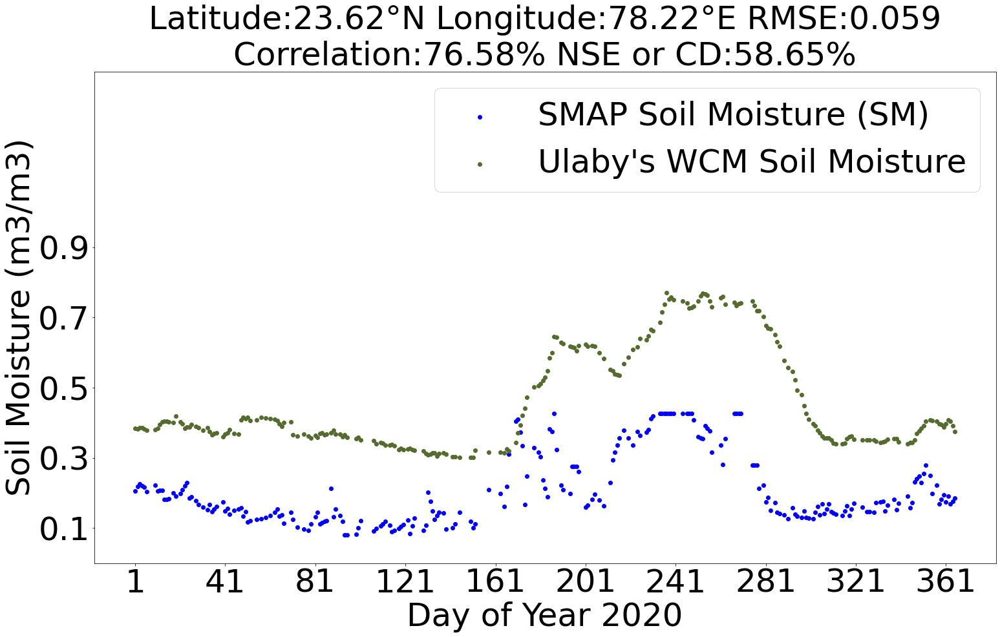

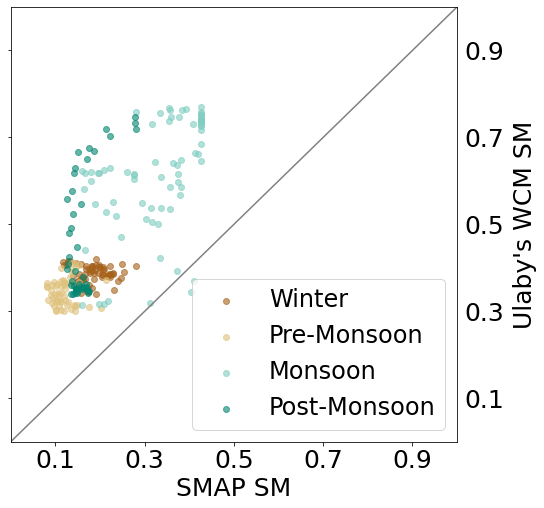

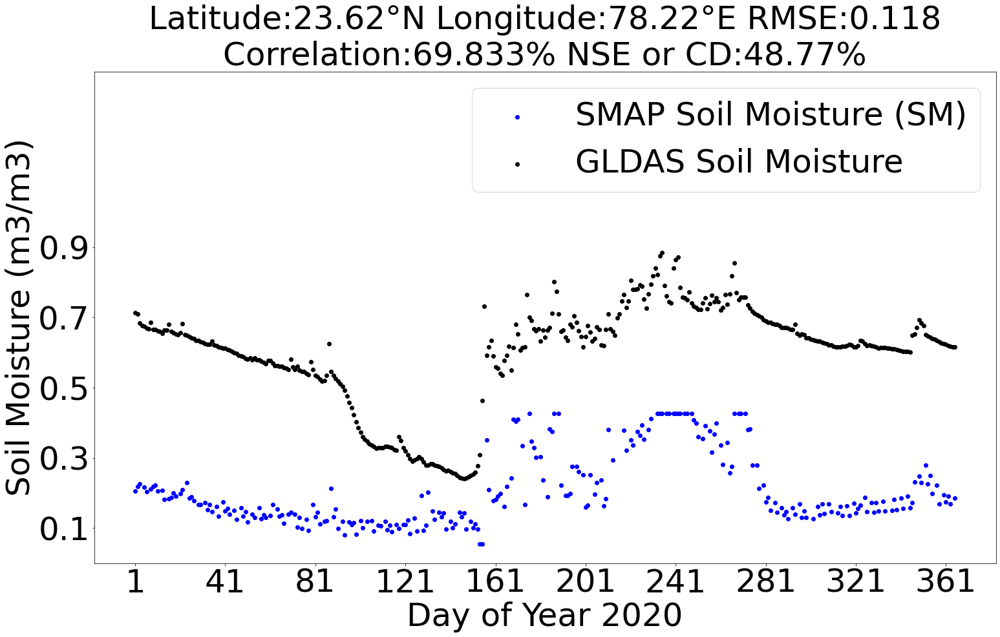

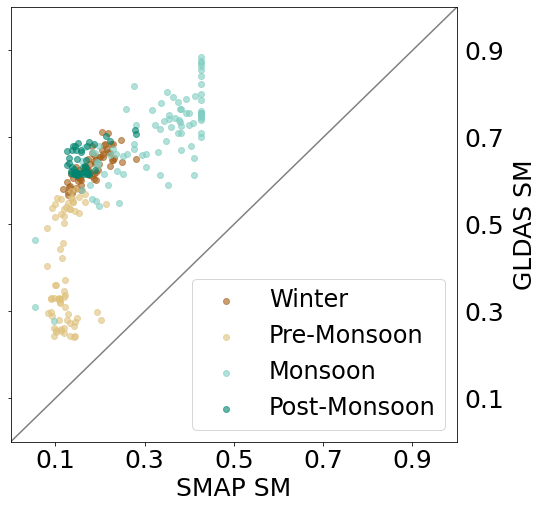

In [105]:
lat = 23.62
lon = 78.22
r1.Bach_Adjustment_Visualization(lat,lon)

## Modified WCM

In [106]:
import Final_WCM_Bach_Processing_NLS_Adjustment  
import imp
imp.reload(Final_WCM_Bach_Processing_NLS_Adjustment)
import Final_WCM_Bach_Processing_NLS_Adjustment as s8

# lat = [22.18,22.54,22.9,23.26,23.62,23.98,24.34,24.7,25.06,25.42,25.78,26.14,26.5,26.86] 
# lon = [73.18,73.54,73.9,74.26,74.98,75.34,75.7,76.06,76.42,76.78,77.14,77.5,77.86,78.22,78.58,78.94]
# for i in range(len(lat)):
#     for j in range(len(lon)):
#         s8.Bach_Adjustment_Visualization(lat[i],lon[j])

Wall time: 329 ms


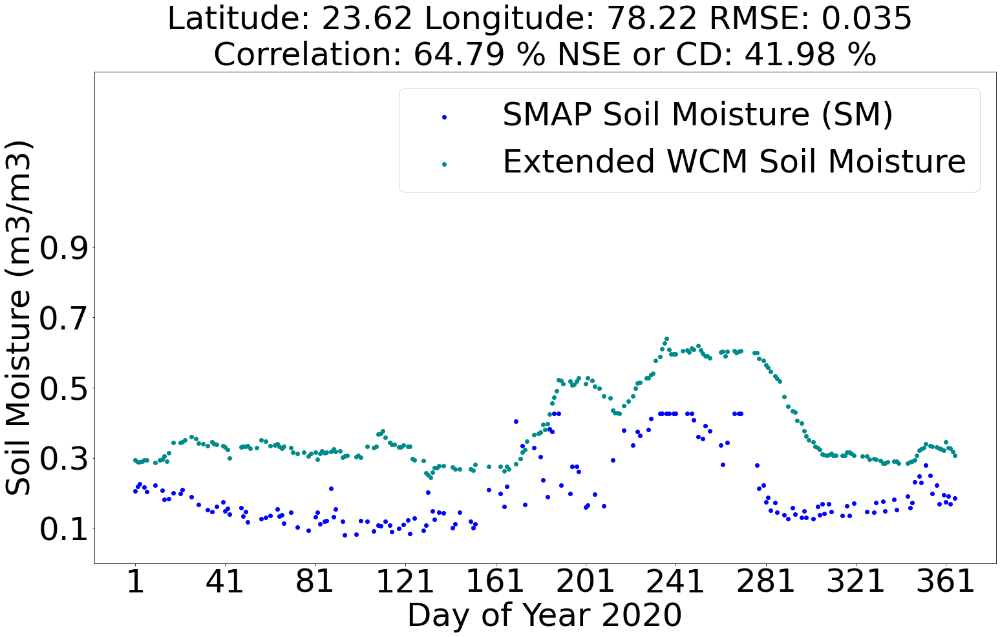

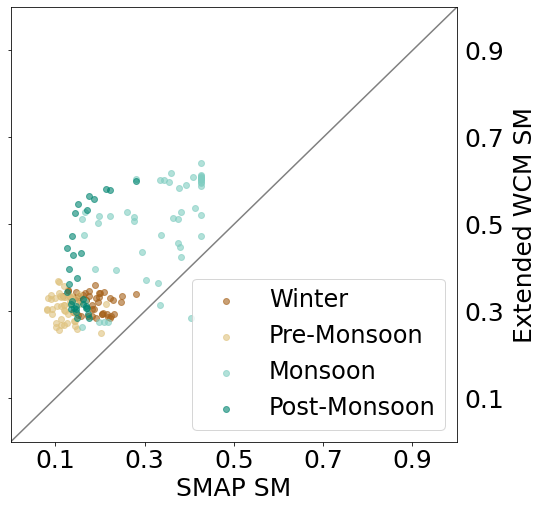

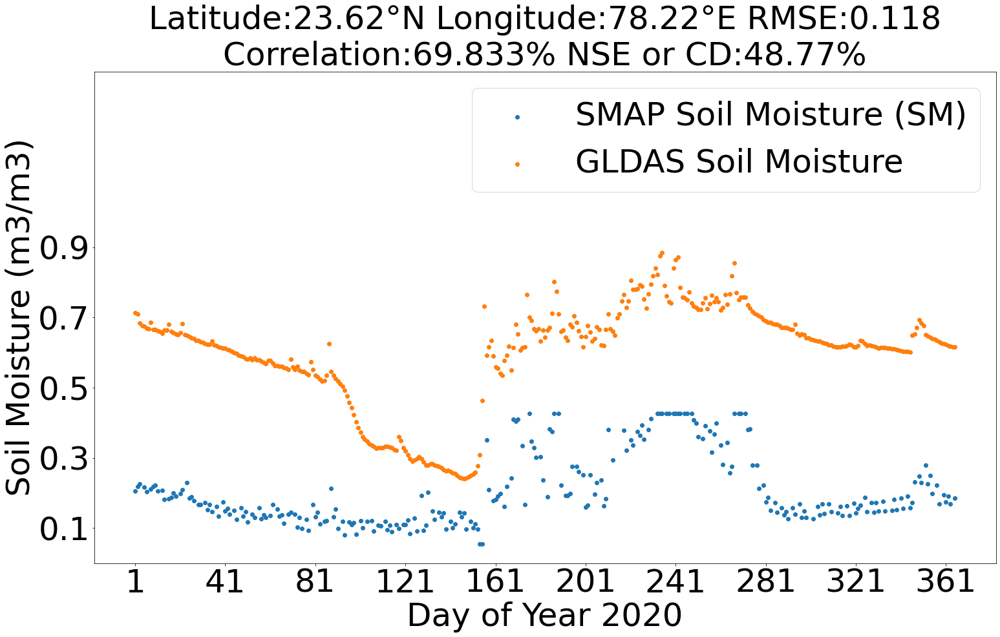

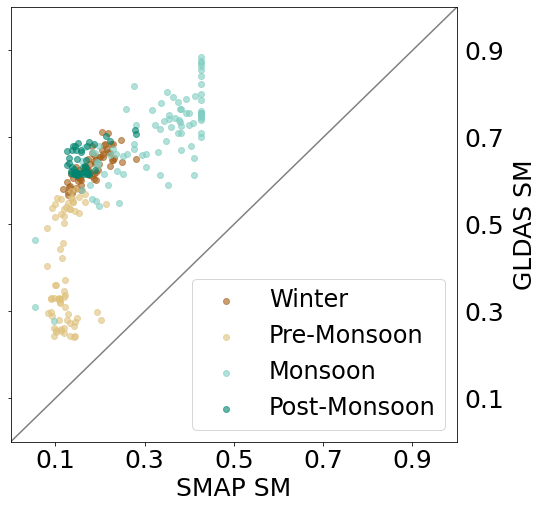

In [107]:
%%time
s8.Bach_Adjustment_Visualization(lat,lon)

## After adjustment on all the pixels

In [108]:
DF  = pd.read_csv('WCM_Correlations.csv')
DF  = DF.drop(['CR_GLDAS_WCM','CR_GLDAS_WCM_RMSE','Lat_Lon','XGBoost_CR_SMAP','XGBoost_RMSE_SMAP'],axis=1)

## Relative Errors of Soil Moisture

In [109]:
DF['CR_SMAP_WCM_RMSE/RMS_SMAP']     = (DF['CR_SMAP_WCM_RMSE']/DF['RMS_SMAP_SM'])**2
DF['WCM_ORG_SMAP_RMSE/RMS_SMAP']    = (DF['WCM_ORG_SMAP_RMSE']/DF['RMS_SMAP_SM'])**2

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Resampling using Kriging </p> 

In [110]:
import skgstat as skg
from skgstat import Variogram
from skgstat import OrdinaryKriging

## Interpolated all the metrices in a 3 Km grid cell
+ With a Variogram, we will basically try to find and describe some systematic statistical behavior from these similarities. 
+ The process of grouping distance data together is called binning.
+ The OrdinaryKriging class need at least a fitted Variogram instance. 
+ Using min_points we can demand the Kriging equation system to be build upon at least 5 points to yield robust results. 
+ If not enough close observations are found within the effective range of the variogram, the estimation will not be calculated and a np.NaN value is estimated.
+ The max_points parameter will set the upper bound of the equation system by using in this case at last the 20 nearest points. 
+ Adding more will most likely not change the estimation, as more points will recieve small, if not negligible, weights. 
+ But it will increase the processing time, as each added point will increase the Kriging equation system dimensionality by one.
+ The mode parameter sets the method that will build up the equation system. 
+ There are two implemented: mode=’exact’ and mode=’estimate’. 

In [111]:
DF.keys()

Index(['CR_SMAP_WCM', 'CR_SMAP_WCM_RMSE', 'CR_SMAP_GLDAS',
       'CR_SMAP_GLDAS_RMSE', 'CR_SMAP_CYGNSS', 'RMS_SMAP_SM', 'RMS_LAI_NOAA',
       'WCM_ORG_SMAP_CR', 'WCM_ORG_SMAP_RMSE', 'Lat', 'Lon',
       'CR_SMAP_CYGNSS_RMSE', 'CR_SMAP_WCM_RMSE/RMS_SMAP',
       'WCM_ORG_SMAP_RMSE/RMS_SMAP'],
      dtype='object')

In [112]:
lat = [22.18,22.54,22.9,23.26,23.62,23.98,24.34,24.7,25.06,25.42,25.78,26.14,26.5,26.86] 
lon = [73.18,73.54,73.9,74.26,74.98,75.34,75.7,76.06,76.42,76.78,77.14,77.5,77.86,78.22,78.58,78.94]

GLDAS_SM_RMS = []
ULWCM_SM_RMS = []
Extdd_SM_RMS = []
for i in range(len(lat)):
    for j in range(len(lon)):
        DF1 = pd.read_csv(rf'D:\EG\Project Data\WCM_Adjusted_SM\WCM_Modified_Model_SM\GLDAS_SMAP_SM_{lat[i]}_{lon[j]}.csv')
        DF2 = pd.read_csv(rf'D:\EG\Project Data\WCM_Adjusted_SM\WCM_Ulaby_Model_SM\SMAP_Adjusted_SM_{lat[i]}_{lon[j]}.csv')
        DF3 = pd.read_csv(rf'D:\EG\Project Data\WCM_Adjusted_SM\WCM_Modified_Model_SM\WCM_Modified_Adjusted_SM_{lat[i]}_{lon[j]}.csv')
        
        GLDAS_SM_RMS.append((np.mean(np.array(DF1['GLDAS_SM'])**2))**(0.5))
        ULWCM_SM_RMS.append((np.mean(np.array(DF2['Improved_SM'])**2))**(0.5))
        Extdd_SM_RMS.append((np.mean(np.array(DF3['Improved_SM'])**2))**(0.5))

In [113]:
DF['GLDAS_SM_RMS'] = GLDAS_SM_RMS
DF['ULWCM_SM_RMS'] = ULWCM_SM_RMS
DF['Extdd_SM_RMS'] = Extdd_SM_RMS

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Resampling using Kriging </p> 

In [114]:
import skgstat as skg
from skgstat import Variogram
from skgstat import OrdinaryKriging

## Interpolated all the metrices in a 36 Km grid cell
+ With a Variogram, we will basically try to find and describe some systematic statistical behavior from these similarities. 
+ The process of grouping distance data together is called binning.
+ The OrdinaryKriging class need at least a fitted Variogram instance. 
+ Using min_points we can demand the Kriging equation system to be build upon at least 5 points to yield robust results. 
+ If not enough close observations are found within the effective range of the variogram, the estimation will not be calculated and a np.NaN value is estimated.
+ The max_points parameter will set the upper bound of the equation system by using in this case at last the 20 nearest points. 
+ Adding more will most likely not change the estimation, as more points will recieve small, if not negligible, weights. 
+ But it will increase the processing time, as each added point will increase the Kriging equation system dimensionality by one.
+ The mode parameter sets the method that will build up the equation system. 
+ There are two implemented: mode=’exact’ and mode=’estimate’. 

In [115]:
DF['CR_SMAP_GLDAS_RMSE/RMS_SMAP'] = DF['CR_SMAP_GLDAS_RMSE']/DF['RMS_SMAP_SM']
DF.keys()

Index(['CR_SMAP_WCM', 'CR_SMAP_WCM_RMSE', 'CR_SMAP_GLDAS',
       'CR_SMAP_GLDAS_RMSE', 'CR_SMAP_CYGNSS', 'RMS_SMAP_SM', 'RMS_LAI_NOAA',
       'WCM_ORG_SMAP_CR', 'WCM_ORG_SMAP_RMSE', 'Lat', 'Lon',
       'CR_SMAP_CYGNSS_RMSE', 'CR_SMAP_WCM_RMSE/RMS_SMAP',
       'WCM_ORG_SMAP_RMSE/RMS_SMAP', 'GLDAS_SM_RMS', 'ULWCM_SM_RMS',
       'Extdd_SM_RMS', 'CR_SMAP_GLDAS_RMSE/RMS_SMAP'],
      dtype='object')

In [116]:
DF_Org = DF

In [117]:
keys1 = ['CR_SMAP_WCM','CR_SMAP_GLDAS','CR_SMAP_CYGNSS','WCM_ORG_SMAP_CR']
keys2 = ['CR_SMAP_WCM_RMSE','CR_SMAP_GLDAS_RMSE','RMS_SMAP_SM','RMS_LAI_NOAA',
         'GLDAS_SM_RMS','ULWCM_SM_RMS','Extdd_SM_RMS','WCM_ORG_SMAP_RMSE',
         'CR_SMAP_CYGNSS_RMSE','CR_SMAP_WCM_RMSE/RMS_SMAP',
         'WCM_ORG_SMAP_RMSE/RMS_SMAP','CR_SMAP_GLDAS_RMSE/RMS_SMAP']

In [118]:
def Interpolating_Krigging(data):
  xx, yy = np.mgrid[22.18:27.6:0.36, 73.18:79.6:0.36]
  DFf = pd.DataFrame(xx.flatten())
  DFf.columns = ['Lat']
  DFf['Lon']  = yy.flatten()

  Keys = ['CR_SMAP_WCM','CR_SMAP_GLDAS','CR_SMAP_CYGNSS','WCM_ORG_SMAP_CR',
          'CR_SMAP_WCM_RMSE','CR_SMAP_GLDAS_RMSE','RMS_SMAP_SM','RMS_LAI_NOAA',
          'GLDAS_SM_RMS','ULWCM_SM_RMS','Extdd_SM_RMS','WCM_ORG_SMAP_RMSE',
          'CR_SMAP_CYGNSS_RMSE','CR_SMAP_WCM_RMSE/RMS_SMAP',
          'WCM_ORG_SMAP_RMSE/RMS_SMAP','CR_SMAP_GLDAS_RMSE/RMS_SMAP']
  for K in Keys:
    V  = Variogram(data[['Lat', 'Lon']].values, data[f'{K}'].values,maxlag=5, n_lags=10, model='spherical',normalize=True)
    ok = OrdinaryKriging(V, min_points=1, max_points=5, mode='exact')
    field = ok.transform(xx.flatten(), yy.flatten()).reshape(xx.shape)
    DFf[f'{K}'] = field.flatten()
  return DFf

In [119]:
%%time
DFf = Interpolating_Krigging(DF)

Wall time: 2.53 s


<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Performances in the Catchment </p> 

In [120]:
Keys = ['CR_SMAP_WCM','CR_SMAP_GLDAS','CR_SMAP_CYGNSS','WCM_ORG_SMAP_CR',
         'CR_SMAP_WCM_RMSE','CR_SMAP_GLDAS_RMSE','RMS_SMAP_SM',
         'RMS_LAI_NOAA','GLDAS_SM_RMS','ULWCM_SM_RMS','Extdd_SM_RMS',
         'WCM_ORG_SMAP_RMSE','CR_SMAP_CYGNSS_RMSE','CR_SMAP_WCM_RMSE/RMS_SMAP',
         'WCM_ORG_SMAP_RMSE/RMS_SMAP','CR_SMAP_GLDAS_RMSE/RMS_SMAP']

In [121]:
%%time
for K in Keys:
  DDM  = DFf[f'{K}']
  DDM1 = DF[f'{K}']
  for i in range(len(DDM)):
    DDM2 = DDM[i]
    if DDM2>max(DDM1) or DDM2<min(DDM1):
      DDM[i] = np.nan
    else:
      DDM[i] = DDM[i]
  DFf[f'{K}'] = DDM

Wall time: 1.36 s


In [122]:
Listed  = ['CD_SMAP_WCM','CD_SMAP_GLDAS','CD_SMAP_CYGNSS','WCM_ORG_SMAP_CD']
Listed2 = ['CR_SMAP_WCM','CR_SMAP_GLDAS','CR_SMAP_CYGNSS','WCM_ORG_SMAP_CR']
for CD,CR in zip(Listed,Listed2):
  DFf[f'{CD}'] = (((np.array(DFf[f'{CR}']))/100)**2)*100

In [123]:
V1 = '''Correlation of Ulaby's WCM adjusted with 
SMAP Soil Moisture'''
V2 = '''Nash Sutcliffe Efficiency of Ulaby's WCM
adjusted and SMAP Soil Moisture'''

V3 = '''Correlation of Extended WCM adjusted with 
SMAP Soil Moisture'''
V4 = '''Nash Sutcliffe Efficiency of Extended WCM 
adjusted and SMAP Soil Moisture'''

V5 = '''Correlation of CYGNSS Surface Reflectivity with 
SMAP Soil Moisture'''
V6 = '''Nash Sutcliffe Efficiency of CYGNSS Surface
Reflectivity and SMAP Soil Moisture'''

V7 = '''Correlation of GLDAS with SMAP Soil Moisture'''
V8 = '''Nash Sutcliffe Efficiency of GLDAS 
and SMAP Soil Moisture'''

V11 = '''RMSE of Ulaby's WCM adjusted with
SMAP Soil Moisture'''
V22 = '''Relative Error of Ulaby's WCM adjusted
wrt SMAP Soil Moisture'''

V33 = '''RMSE of Extended WCM adjusted with
SMAP Soil Moisture'''
V44 = '''Relative Error of Extended WCM adjusted
wrt SMAP Soil Moisture'''

V55 = '''RMSE of CYGNSS Derived Surface Reflectivity with
SMAP Soil Moisture'''
V66 = '''RMSE of GLDAS with SMAP Soil Moisture'''
V77 = '''Root Mean Square value of SMAP Soil Moisture'''
V88 = '''Root Mean Square value of LAI'''
V99 = '''Root Mean Square value of GLDAS Soil Moisture'''
V90 = '''Root Mean Square value of Ulaby's WCM Soil Moisture'''
V92 = '''Root Mean Square value of Extended WCM Soil Moisture'''
V93 = '''Relative Error of GLDAS wrt SMAP Soil Moisture'''

In [124]:
keys11 = ['CR_SMAP_WCM','CD_SMAP_WCM',
          'WCM_ORG_SMAP_CR','WCM_ORG_SMAP_CD',
          'CR_SMAP_CYGNSS','CD_SMAP_CYGNSS',
          'CR_SMAP_GLDAS','CD_SMAP_GLDAS']

keys22 = ['CR_SMAP_WCM_RMSE','CR_SMAP_WCM_RMSE/RMS_SMAP','WCM_ORG_SMAP_RMSE',
          'WCM_ORG_SMAP_RMSE/RMS_SMAP','CR_SMAP_CYGNSS_RMSE','CR_SMAP_GLDAS_RMSE',
          'RMS_SMAP_SM','RMS_LAI_NOAA','GLDAS_SM_RMS','ULWCM_SM_RMS','Extdd_SM_RMS','CR_SMAP_GLDAS_RMSE/RMS_SMAP']

keys1 = [f'{V1}',f'{V2}',f'{V3}',f'{V4}',f'{V5}',f'{V6}',f'{V7}',f'{V8}']
keys2 = [f'{V11}',f'{V22}',f'{V33}',f'{V44}',f'{V55}',f'{V66}',f'{V77}',
         f'{V88}',f'{V99}',f'{V90}',f'{V92}',f'{V93}']

In [125]:
for j1,i1 in zip(keys11,keys1):
    DFf[f'{i1}'] = DFf[f'{j1}']
    
for j1,i1 in zip(keys22,keys2):
    DFf[f'{i1}'] = DFf[f'{j1}']

## Visualization of performance on Map

In [126]:
import geopandas as gpd
fp = r'indian_districts.shp'
map_df = gpd.read_file(fp) 
map_df_msk = map_df[((map_df['latitude']>21.5) & (map_df['latitude']<27.5)) & ((map_df['longitude']>72.5) & (map_df['longitude']<79.5))]
DF3 = map_df_msk
DF3 = DF3[DF3['state nam0']!='Uttar Pradesh']
DF3 = DF3[DF3['state nam0']!='Chhattisgarh']

fp1 = r'C:\Users\Ravi\Downloads\chambal\shp\chambal.shp'
DF31 = gpd.read_file(fp1) 

In [127]:
lat_K, lon_K = np.mgrid[22.18:27.6:0.36, 73.18:79.6:0.36]
m,n = lat_K.shape
m,n

(16, 18)

In [128]:
from shapely.geometry import Point
import xarray as xr

polygon        =   DF31.geometry[:]
lon, lat       =   np.asarray(lon_K), np.asarray(lat_K)
points         =   np.array([Point(x, y) for x, y in zip(lon.flatten(), lat.flatten())], dtype=object)
mask           =   np.array([polygon.contains(point) for point in points])
mask           =   mask.reshape(lon.shape)
temp_mask      =   xr.DataArray(mask, dims=['nlon', 'nlat']) 
temp_mask      =   (temp_mask.where(temp_mask)).fillna(0)
finalMask1     =   np.array(pd.DataFrame(temp_mask).replace(0,np.nan))
finalMask1     =   np.array(pd.DataFrame(finalMask1).replace(1,0))

In [129]:
DFAVG = DFf
DFAVG = DFAVG.drop(['Lat', 'Lon', 'CR_SMAP_WCM', 'CR_SMAP_GLDAS', 'CR_SMAP_CYGNSS',
       'WCM_ORG_SMAP_CR', 'CR_SMAP_WCM_RMSE', 'CR_SMAP_GLDAS_RMSE',
       'RMS_SMAP_SM', 'RMS_LAI_NOAA', 'WCM_ORG_SMAP_RMSE',
       'CR_SMAP_CYGNSS_RMSE', 'CR_SMAP_WCM_RMSE/RMS_SMAP',
       'WCM_ORG_SMAP_RMSE/RMS_SMAP', 'CD_SMAP_WCM', 'CD_SMAP_GLDAS',
       'CD_SMAP_CYGNSS', 'WCM_ORG_SMAP_CD',
       'Root Mean Square value of SMAP Soil Moisture',
       'Root Mean Square value of LAI'],axis=1)

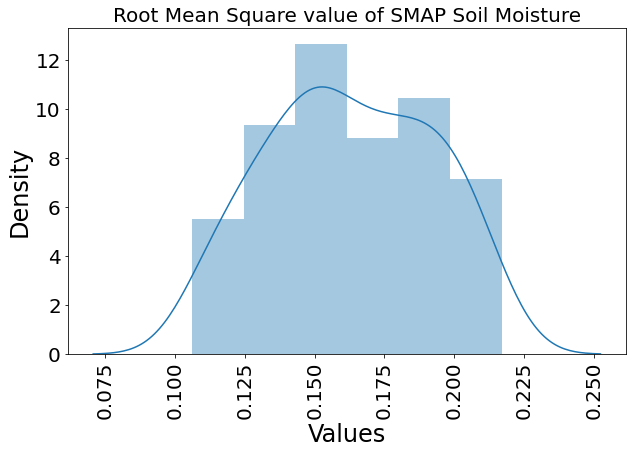

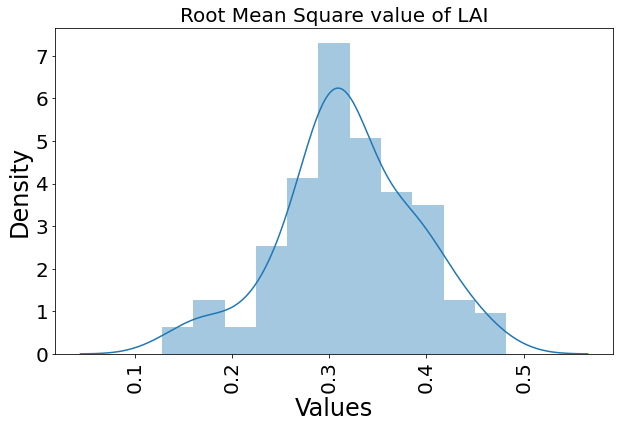

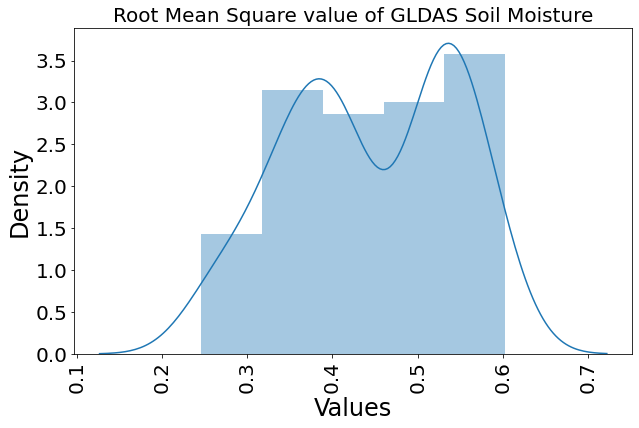

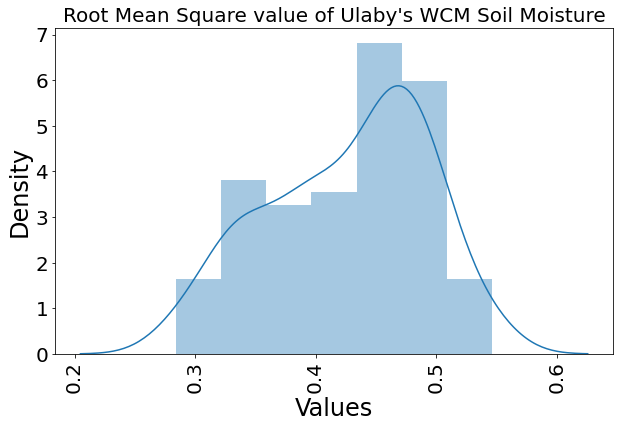

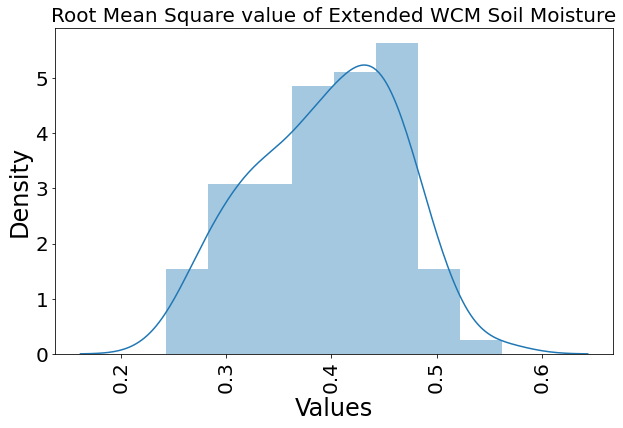

In [130]:
Vrms = [V77, V88, V99, V90, V92]
for V in Vrms:
    K1 = np.array(DFf[f'{V}']).reshape(m,n)
    K1 = finalMask1+K1
    plt.figure(figsize=(10,6))
    sns.distplot(K1.flatten())
    plt.xlabel(f'Values',fontsize=24)
    plt.ylabel('Density',fontsize=24)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.tick_params(axis='x', which='major',rotation=90)
    plt.title(f'{V}',fontsize=20)

## Visualizing Correlations

In [131]:
S2 = ['Panch Mahals','Dungarpur','Dausa','Mandsaur','Bharuch','Chhindwara','Tikamgarh','Harda','Vadodara',
      'Damoh','Narsimhapur','Narmada','Nandurbar','Barwani','Dhar','Sirohi','Gandhinagar','Anand','Kheda',
      'Sabar Kantha','Bharatpur','Karauli','Bhind','Gwalior','Vidisha','Sagar','Raisen','Hoshangabad','Dohad',
      'Ratlam','Datia','Shajapur','Morena','Jhalawar','Dewas','East Nimar','West Nimar','Betul','Jodhpur']

S1 = ['Panch Mahals','Dungarpur','Dausa','Mandsaur','Bharuch','Chhindwara','Tikamgarh','Harda','Vadodara',
      'Damoh','Narsimhapur','Narmada','Nandurbar','Barwani','Dhar','Sirohi','Gandhinagar','Anand','Kheda',
      'Sabar Kantha','Bharatpur','Karauli','Bhind','Gwalior','Vidisha','Sagar','Raisen','Hoshangabad','Dohad',
      'Ratlam','Datia','Shajapur','Morena','Jhalawar','Dewas','East Nimar','West Nimar','Betul','Jodhpur',
      'Nagaur','Pali','Tonk','Sawai Madhopur','Shivpuri','Dhaulpur', 'Bhilwara','Bundi','Rajsamand','Neemuch',
      'Chittaurgarh','Baran','Sehore','Banswara','Jhabua','Rajgarh','Guna','Indore']

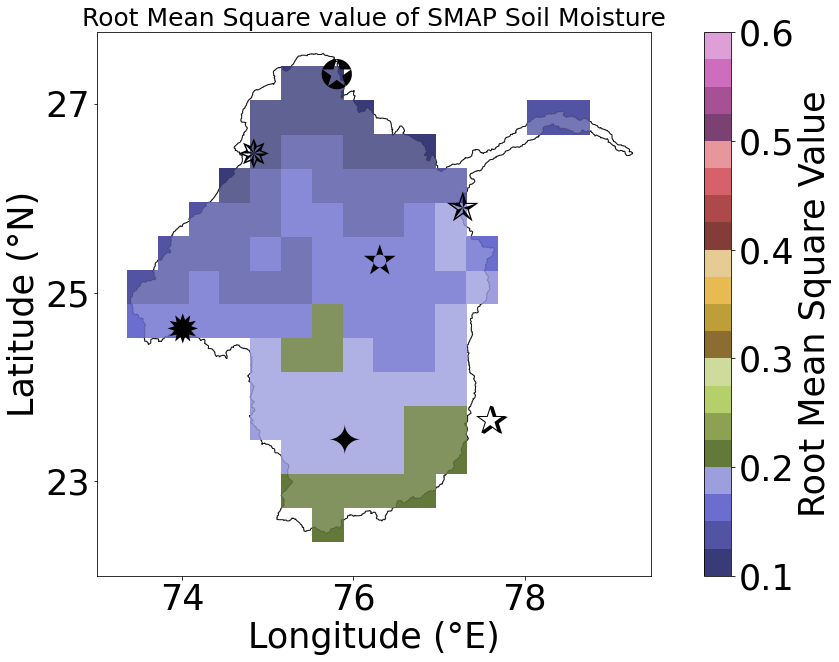

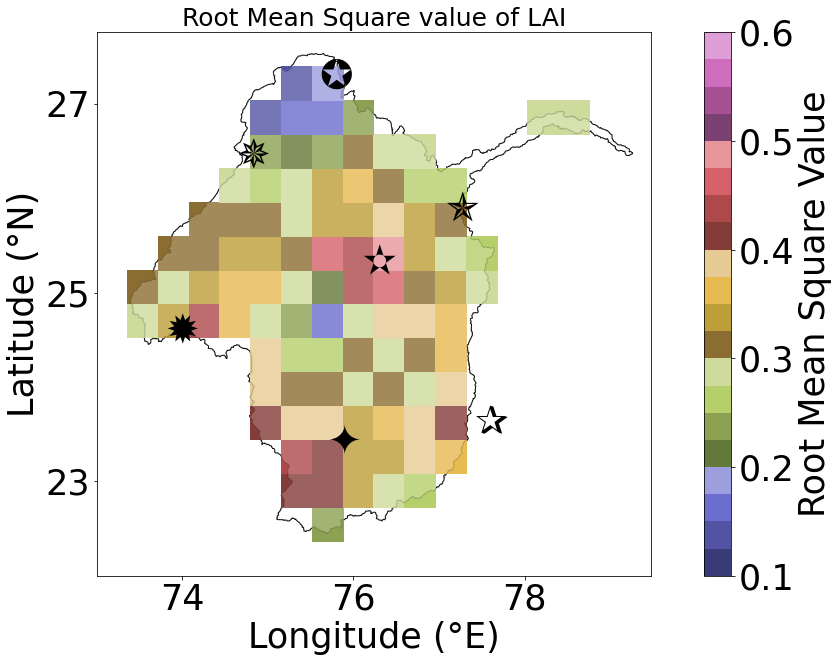

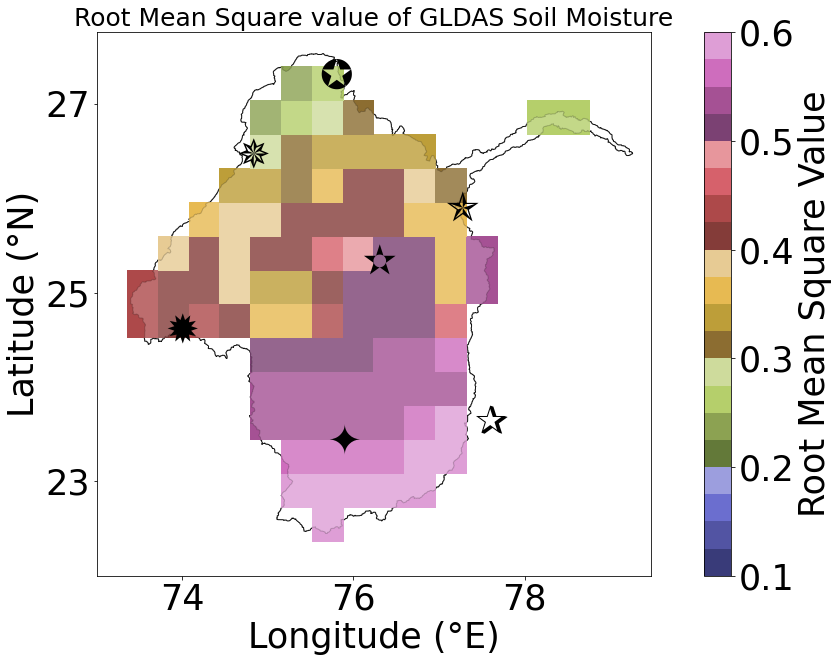

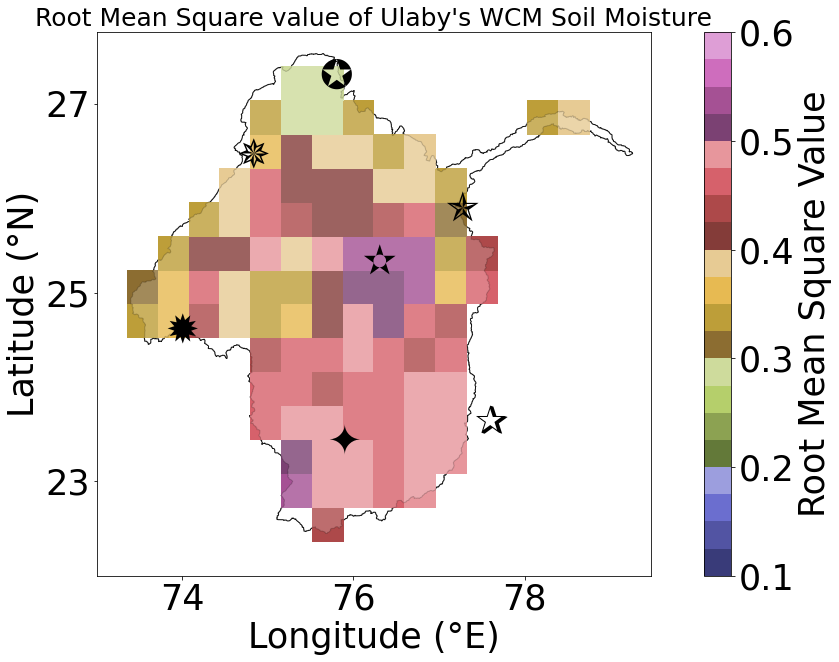

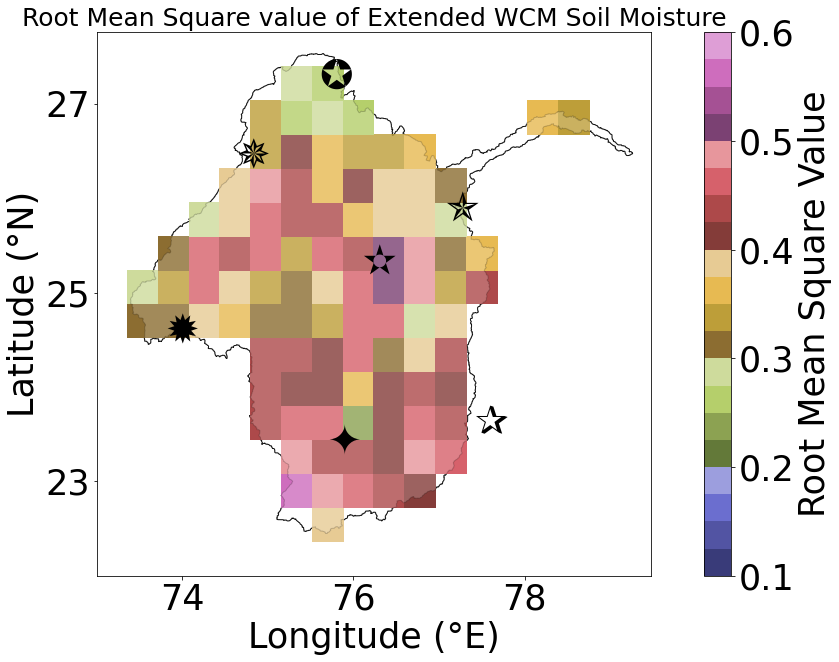

In [132]:
for i in range(len(Vrms)):
    K  = Vrms[i]
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(19,10))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_K, lat_K, K1,cmap="tab20b",vmin=0.1,vmax=0.6)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
    plt.xlabel('Longitude (°E)',fontsize=35)
    plt.ylabel('Latitude (°N)',fontsize=35)
    cbar = plt.colorbar()
    cbar.set_label(f'{K[:0].replace("of","")}Root Mean Square Value',fontsize=35)
    cbar.ax.tick_params(labelsize=35)
    plt.tick_params(axis='both', which='major', labelsize=35)
    plt.clim(0.1, 0.6)
    plt.yticks(np.arange(23,29,2))
    plt.xticks(np.arange(74,79,2))
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=40,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=40,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=40,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=40,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=40,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=40,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=40,alpha=1)
    plt.title(f'''{K}''',fontsize=25)

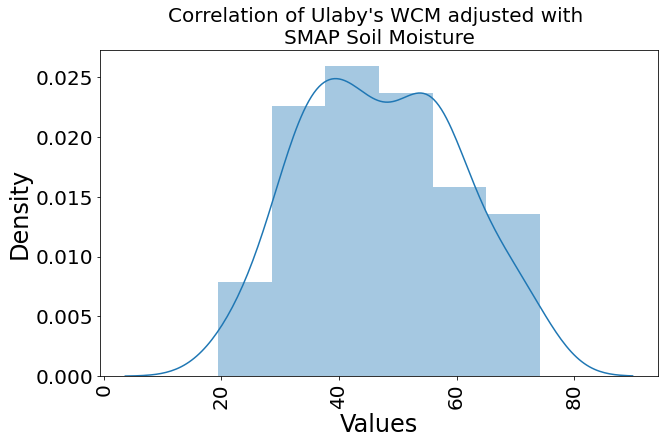

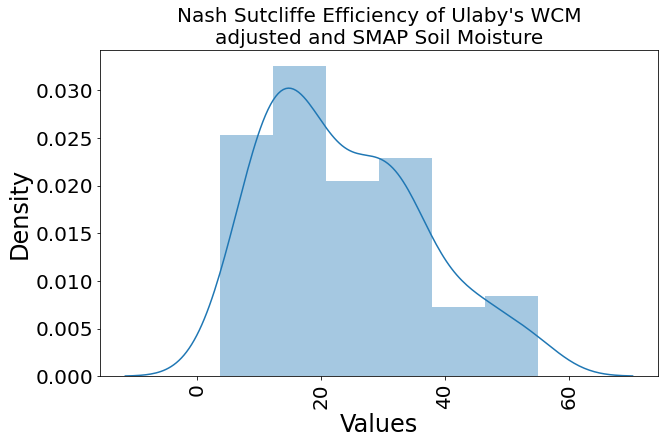

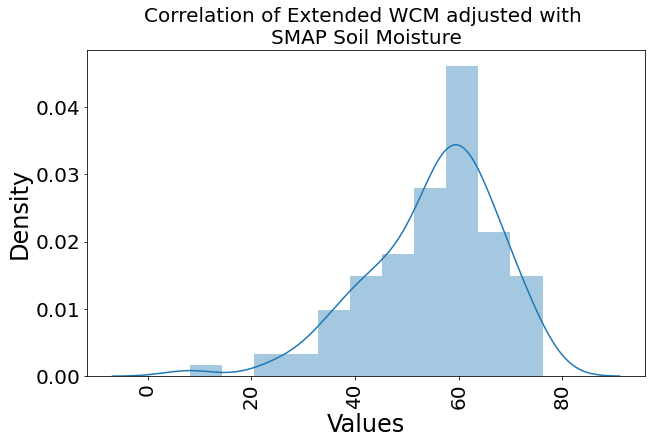

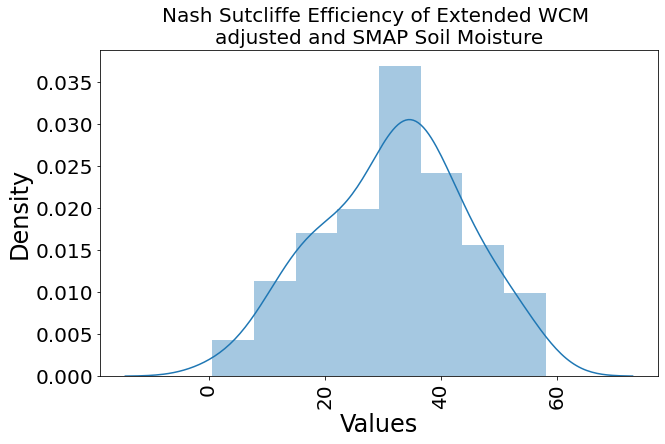

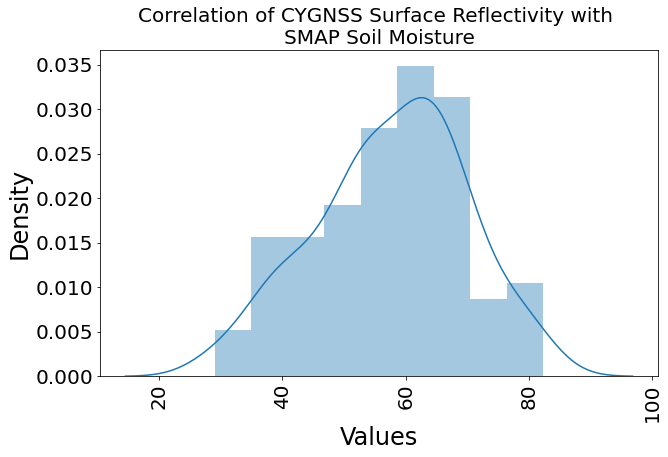

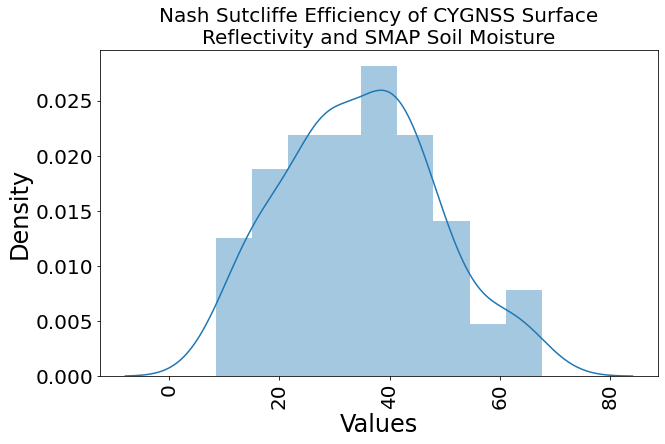

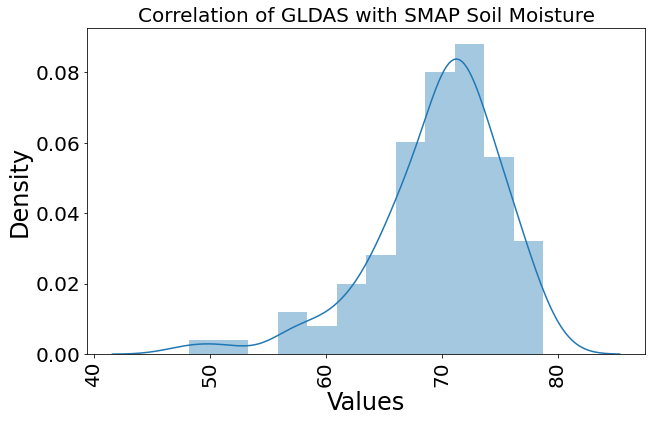

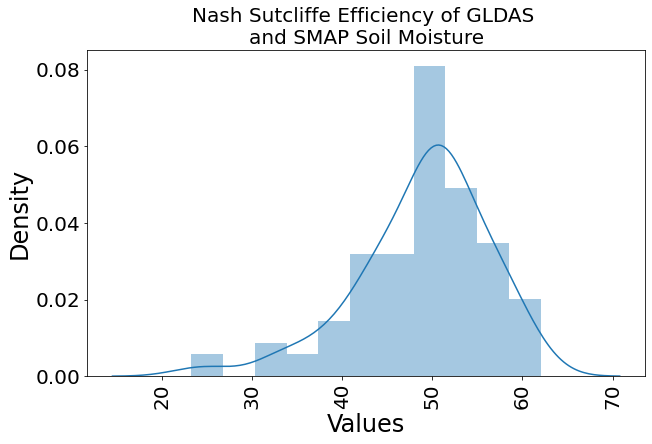

In [133]:
V = [V1,V2,V3,V4,V5,V6,V7,V8]
for V in V:
    K1 = np.array(DFf[f'{V}']).reshape(m,n)
    K1 = finalMask1+K1
    plt.figure(figsize=(10,6))
    sns.distplot(K1.flatten())
    plt.xlabel(f'Values',fontsize=24)
    plt.ylabel('Density',fontsize=24)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.tick_params(axis='x', which='major',rotation=90)
    plt.title(f'{V}',fontsize=20)

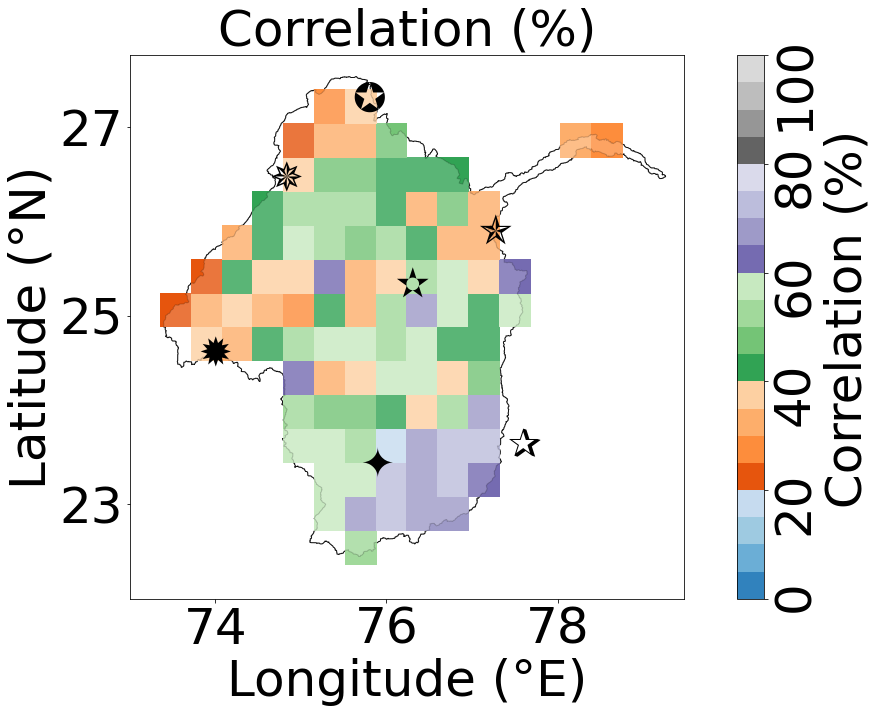

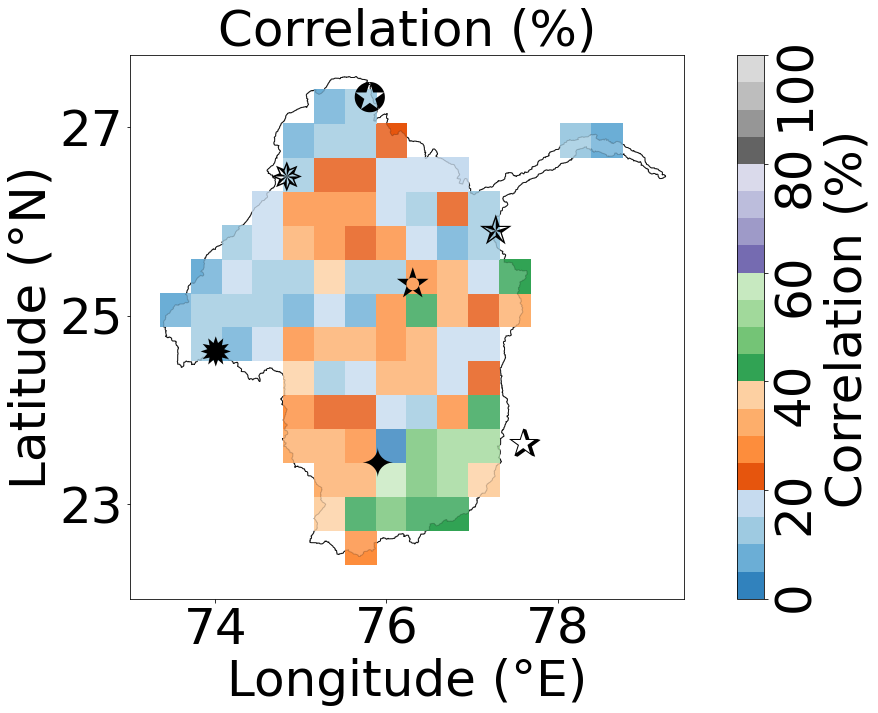

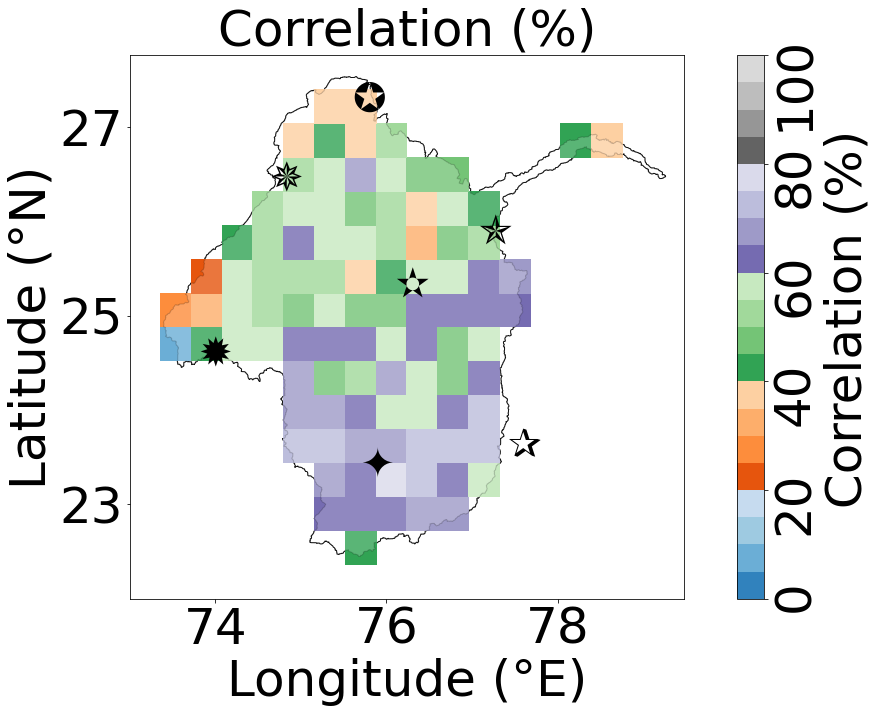

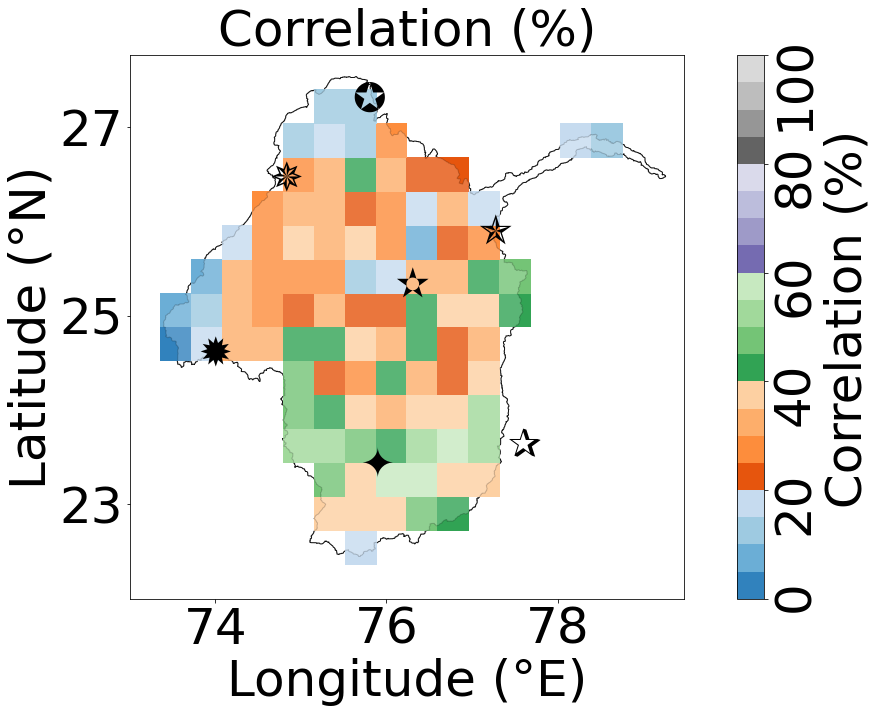

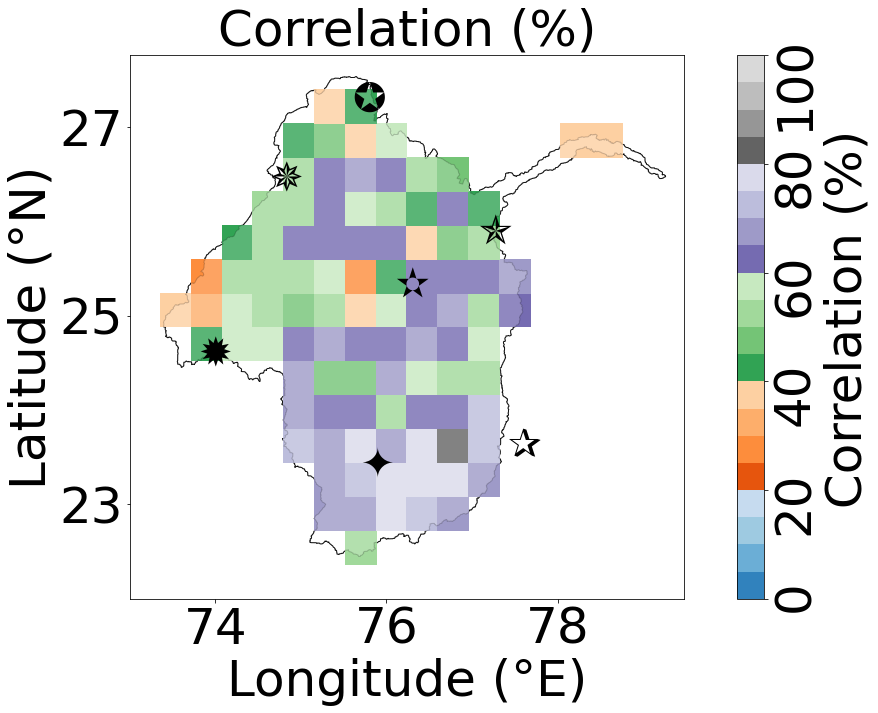

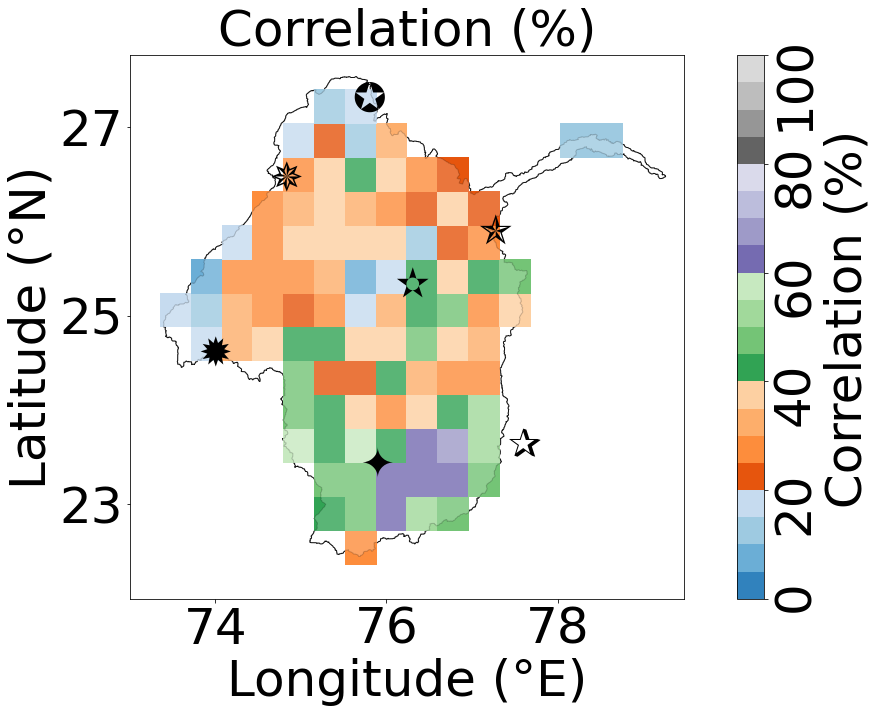

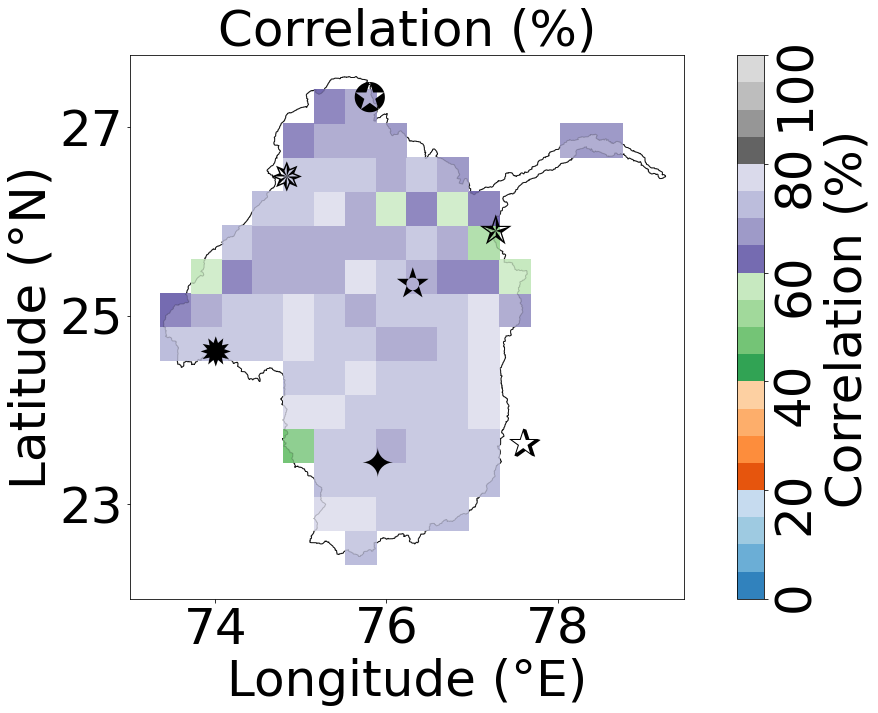

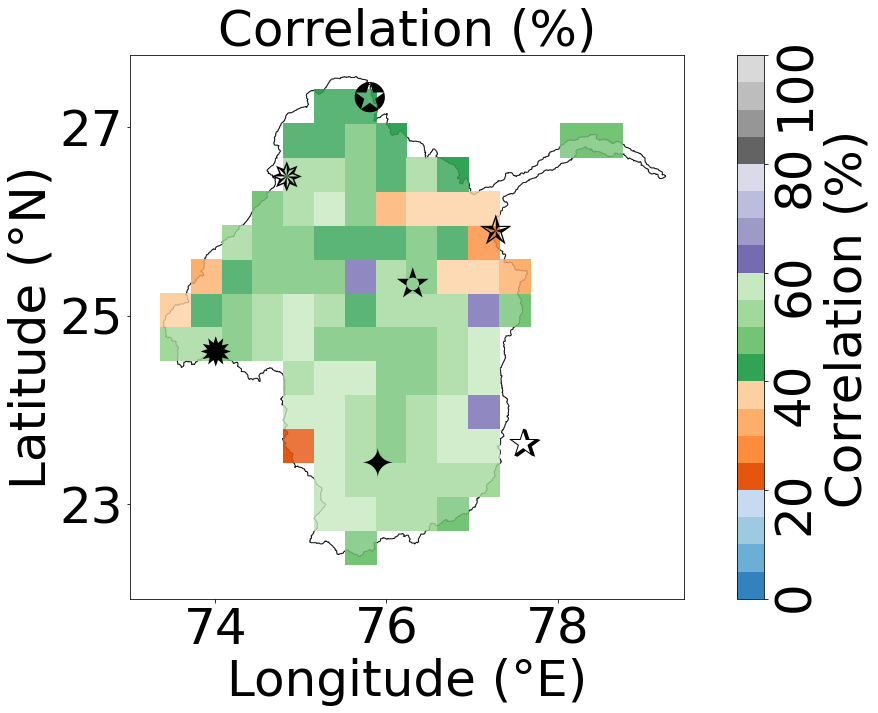

In [134]:
for K in keys1:
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(19, 10))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_K, lat_K, K1,cmap="tab20c",vmin=0,vmax=95)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
    plt.xlabel('Longitude (°E)',fontsize=50)
    plt.ylabel('Latitude (°N)',fontsize=50)
    cbar = plt.colorbar()
    cbar.set_label(f'{K[-1:].replace("e","")} Correlation (%)',fontsize=50)
    cbar.ax.tick_params(rotation=90,labelsize=50)
    plt.tick_params(axis='both', which='major', labelsize=50)
    plt.clim(0, 100)
    plt.yticks(np.arange(23,29,2))
    plt.xticks(np.arange(74,79,2))
    for i in range(1,len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=40,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=40,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=40,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=40,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=40,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=40,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=40,alpha=1)
    plt.title(f'''Correlation (%)''',fontsize=50)

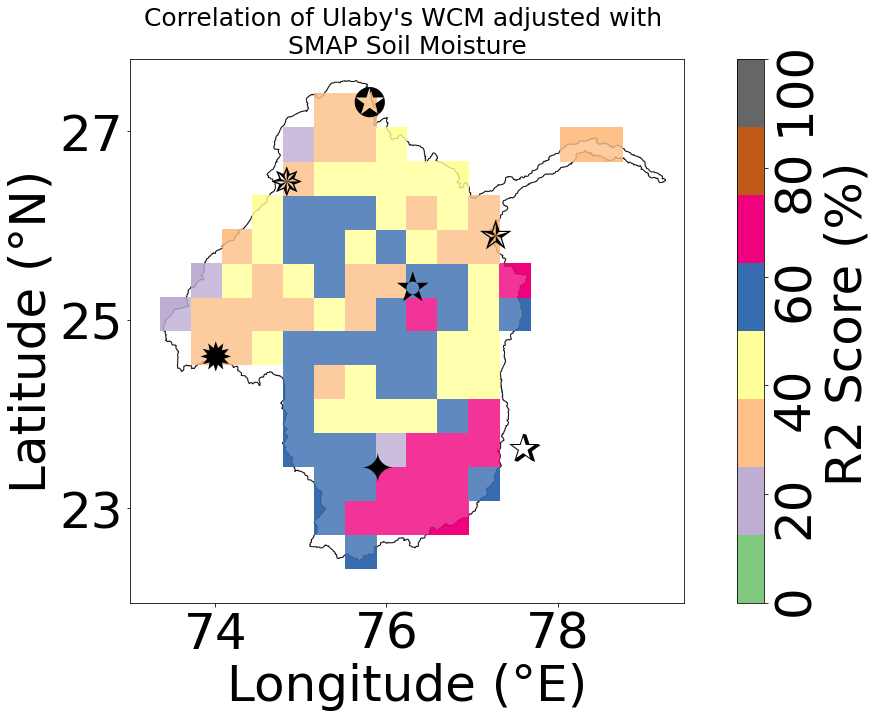

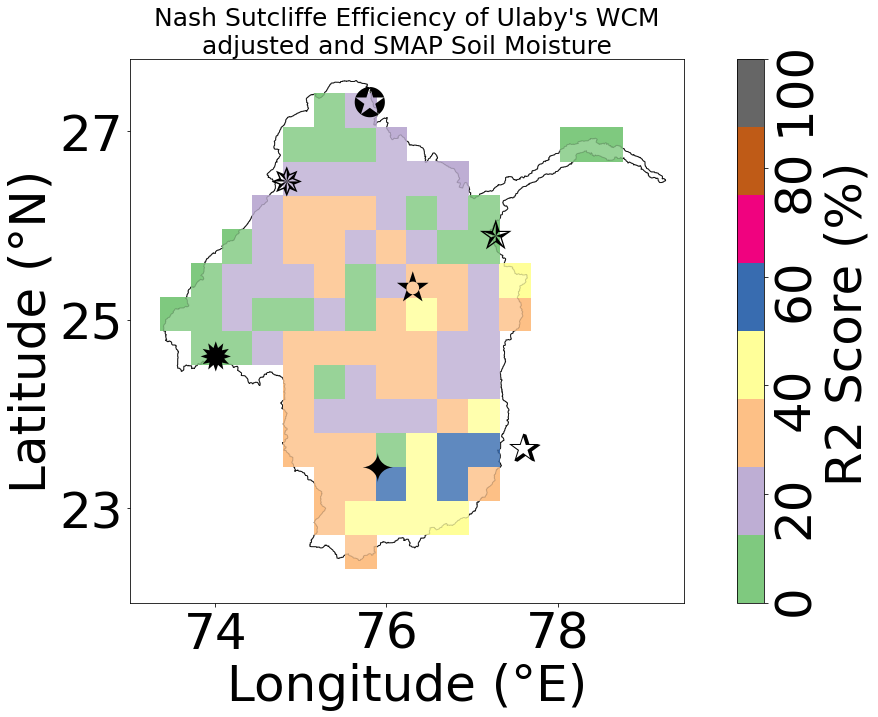

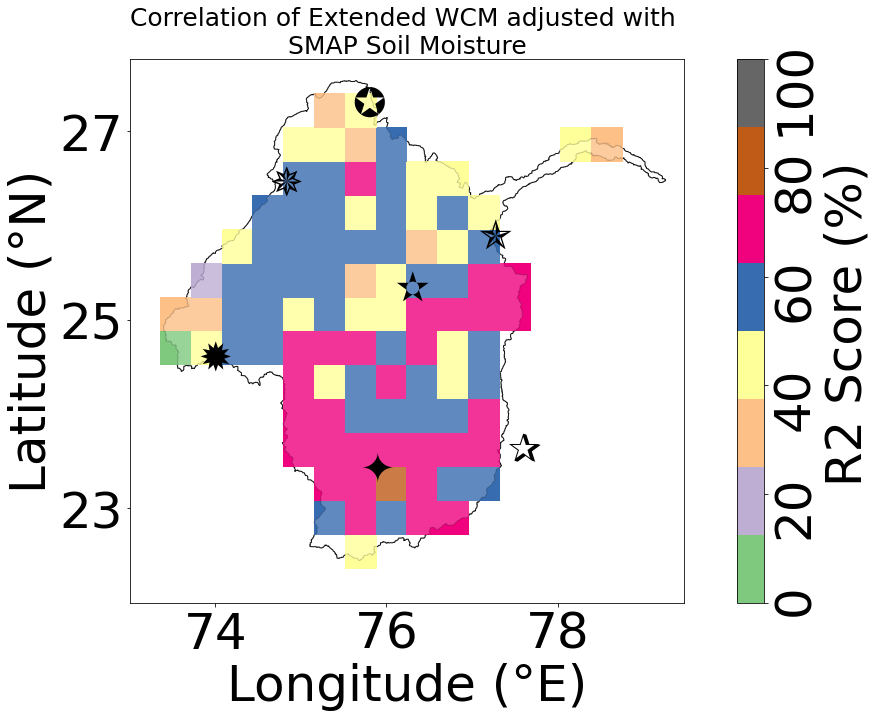

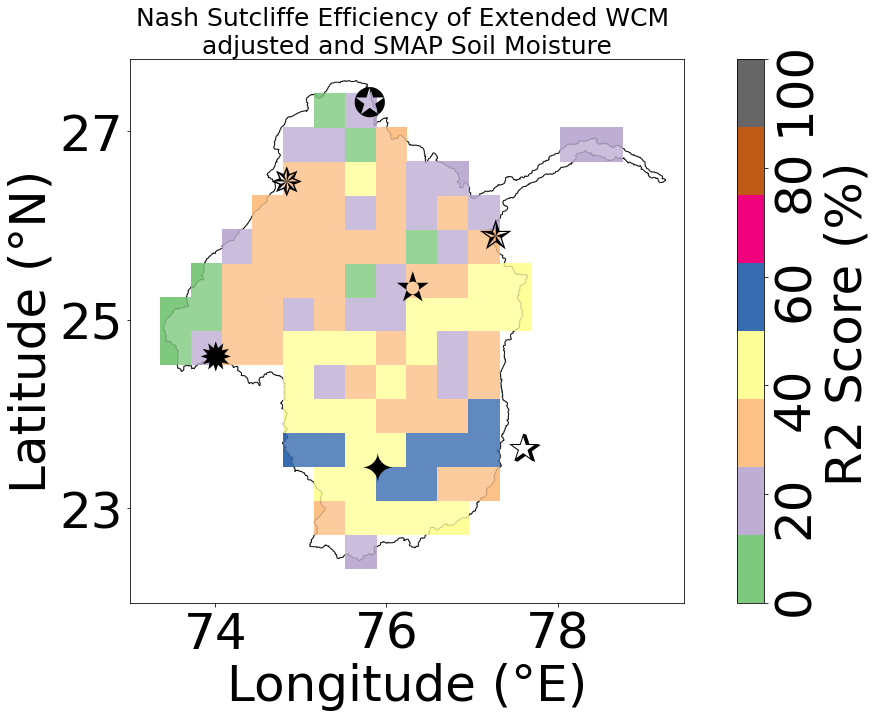

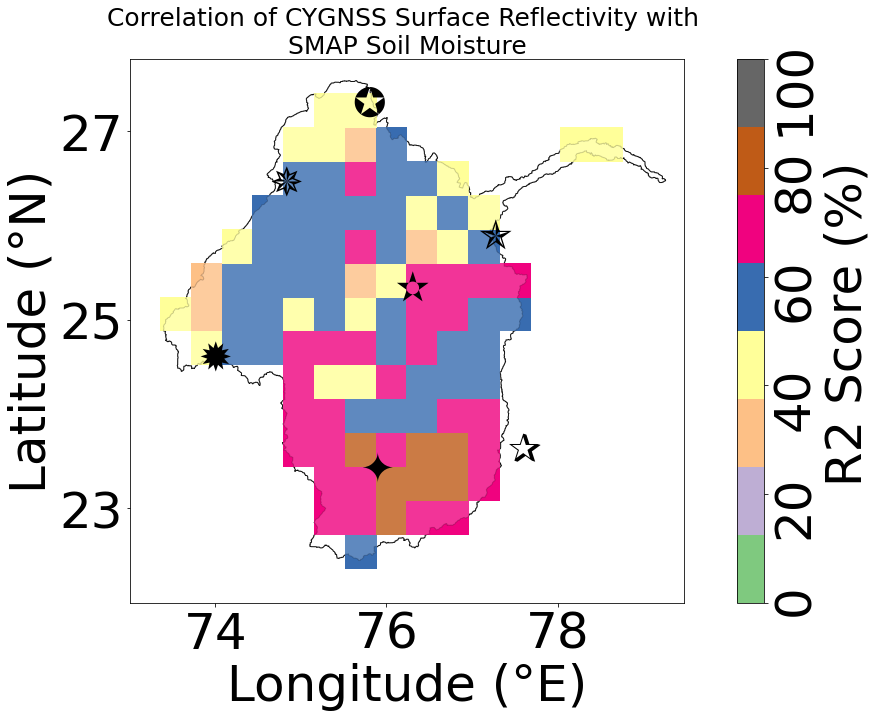

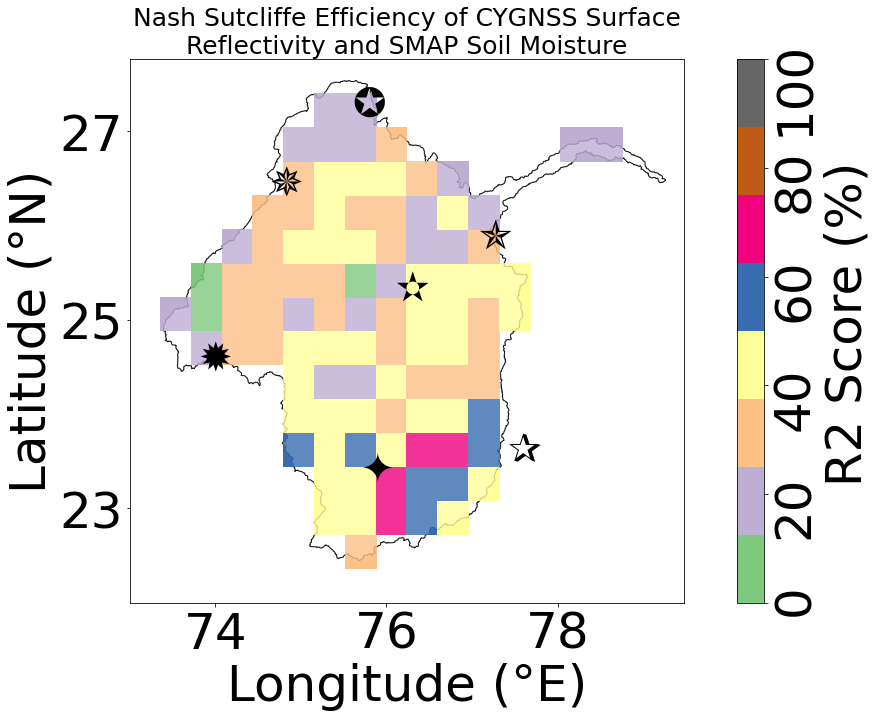

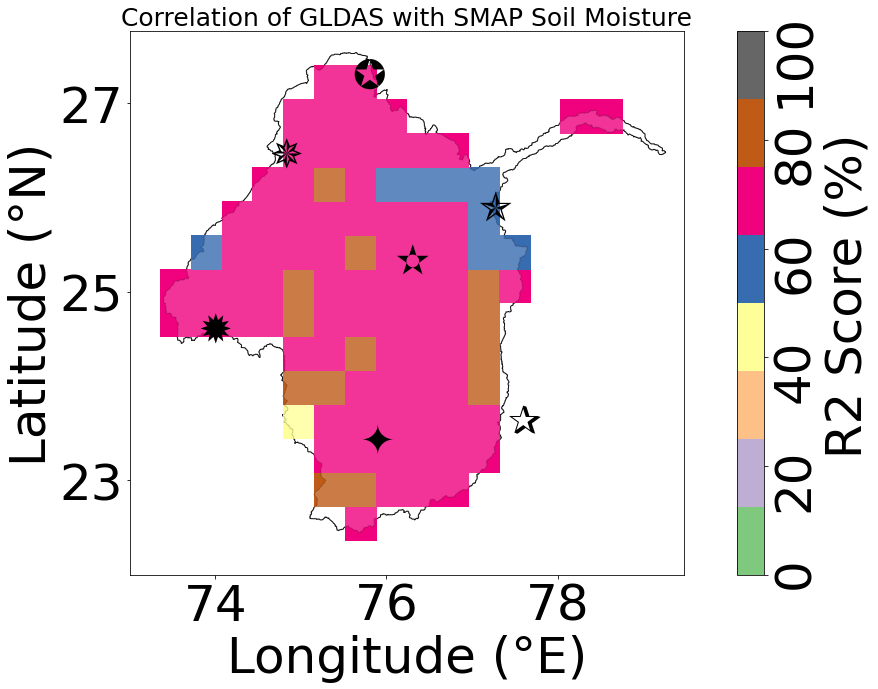

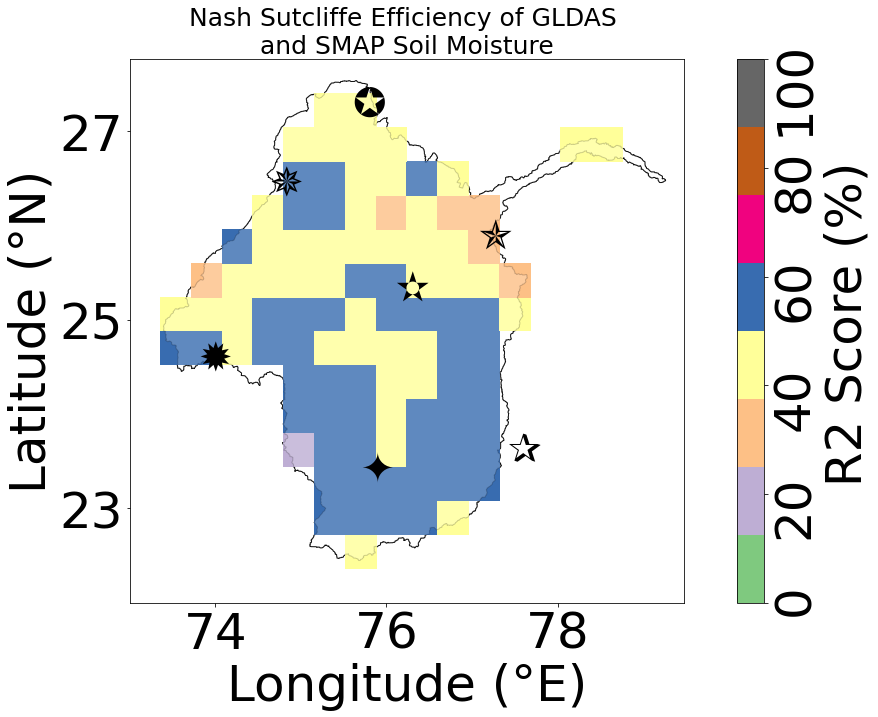

In [135]:
for K in keys1:
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(19, 10))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_K, lat_K, K1,cmap="Accent",vmin=0,vmax=95)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
    plt.xlabel('Longitude (°E)',fontsize=50)
    plt.ylabel('Latitude (°N)',fontsize=50)
    cbar = plt.colorbar()
    cbar.set_label(f'{K[:0].replace("of","")} R2 Score (%)',fontsize=50)
    cbar.ax.tick_params(rotation=90,labelsize=50)
    plt.tick_params(axis='both', which='major', labelsize=50)
    plt.clim(0, 100)
    plt.yticks(np.arange(23,29,2))
    plt.xticks(np.arange(74,79,2))
    for i in range(1,len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=40,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=40,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=40,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=40,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=40,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=40,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=40,alpha=1)
    plt.title(f'''{K}''',fontsize=25)

## Visualizing RMSE

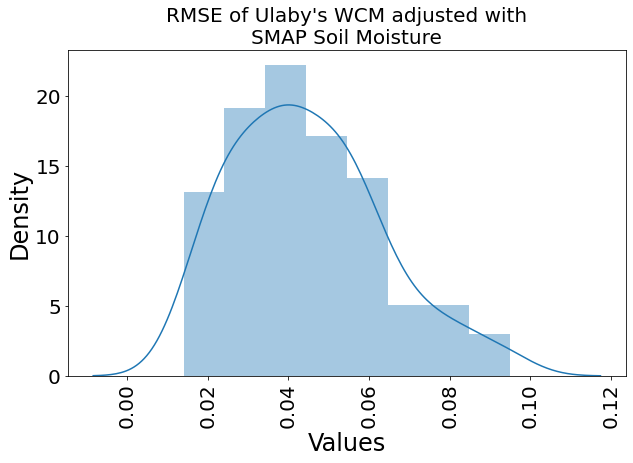

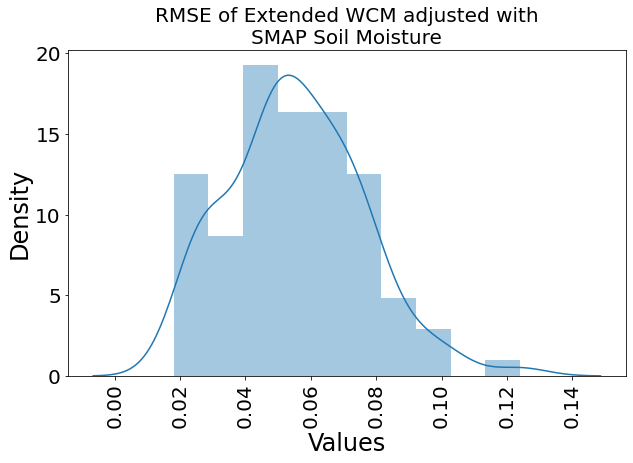

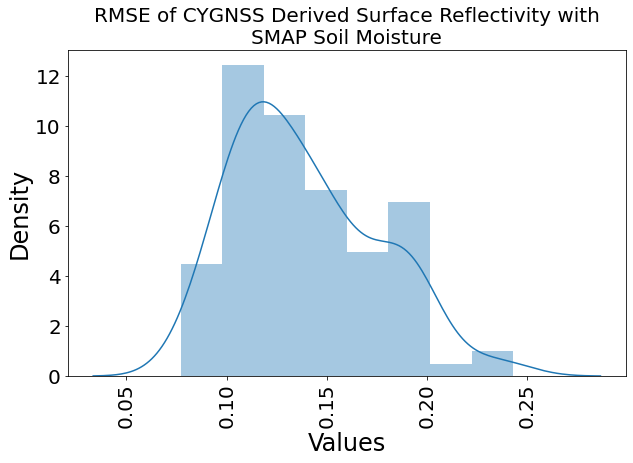

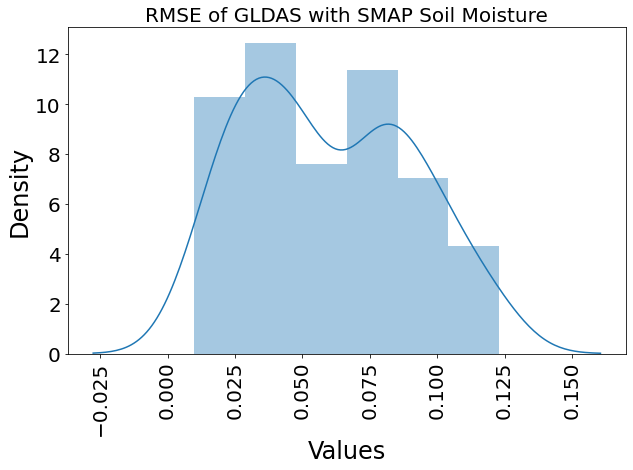

In [136]:
keys21 = [f'{V11}',f'{V33}',f'{V55}',f'{V66}']
for V in keys21:
    K1 = np.array(DFf[f'{V}']).reshape(m,n)
    K1 = finalMask1+K1
    plt.figure(figsize=(10,6))
    sns.distplot(K1.flatten())
    plt.xlabel(f'Values',fontsize=24)
    plt.ylabel('Density',fontsize=24)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.tick_params(axis='x', which='major',rotation=90)
    plt.title(f'{V}',fontsize=20)

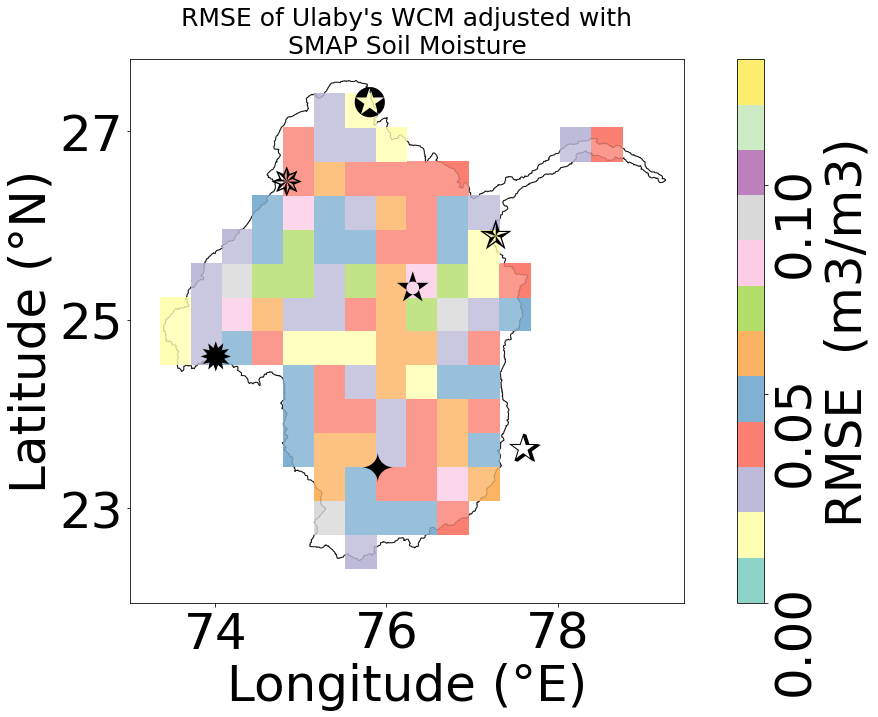

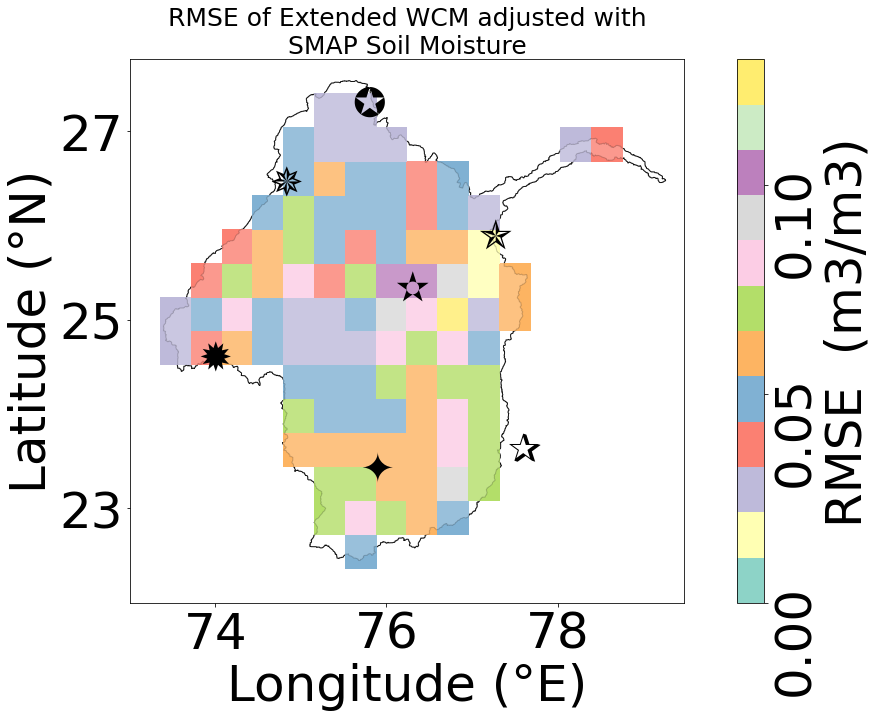

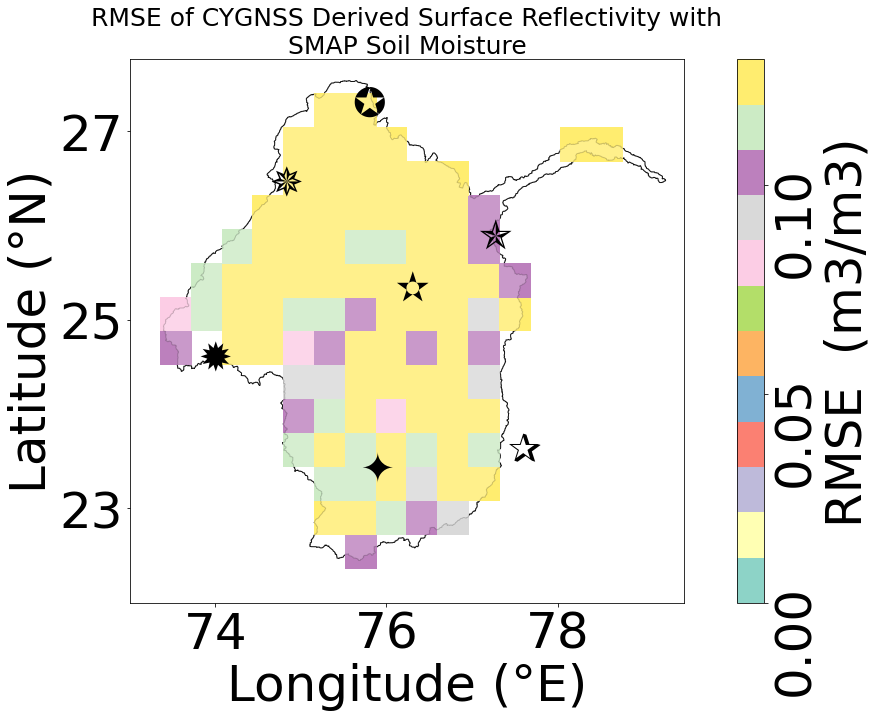

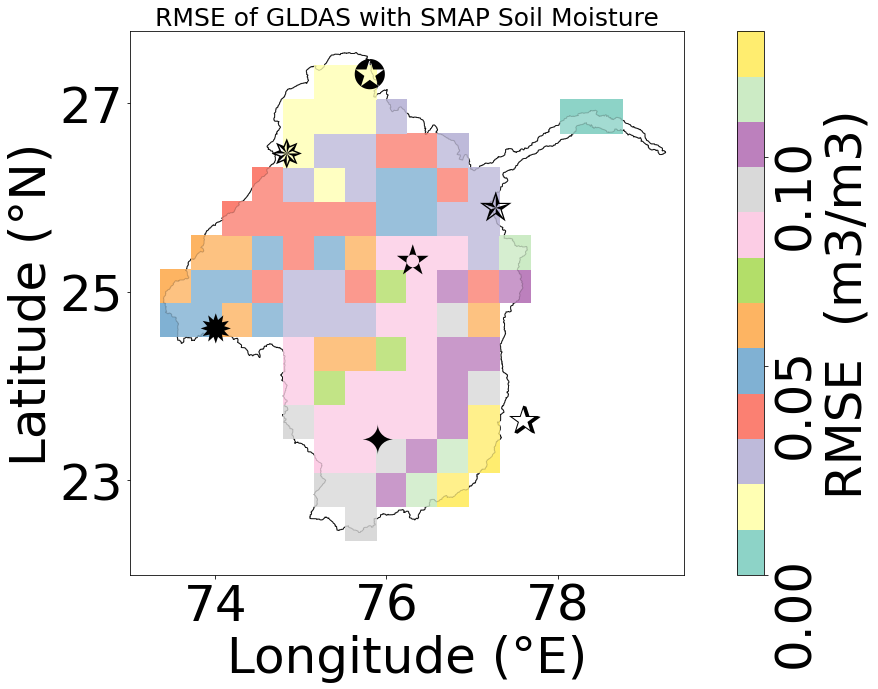

In [137]:
for i in range(len(keys21)):
    K  = keys21[i]
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(19,10))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_K, lat_K, K1,cmap="Set3",vmin=0,vmax=0.25)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
    plt.xlabel('Longitude (°E)',fontsize=50)
    plt.ylabel('Latitude (°N)',fontsize=50)
    cbar = plt.colorbar()
    cbar.set_label(f'{K[:8].replace("of","")}(m3/m3)',fontsize=50)
    cbar.ax.tick_params(rotation=90,labelsize=50)
    plt.tick_params(axis='both', which='major', labelsize=50)
    plt.clim(0, 0.13)
    plt.yticks(np.arange(23,29,2))
    plt.xticks(np.arange(74,79,2))
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=40,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=40,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=40,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=40,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=40,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=40,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=40,alpha=1)
    plt.title(f'''{K}''',fontsize=25)

## Visualizing Relative Errors

In [138]:
keys23 = [f'{V22}',f'{V44}',f'{V99}']

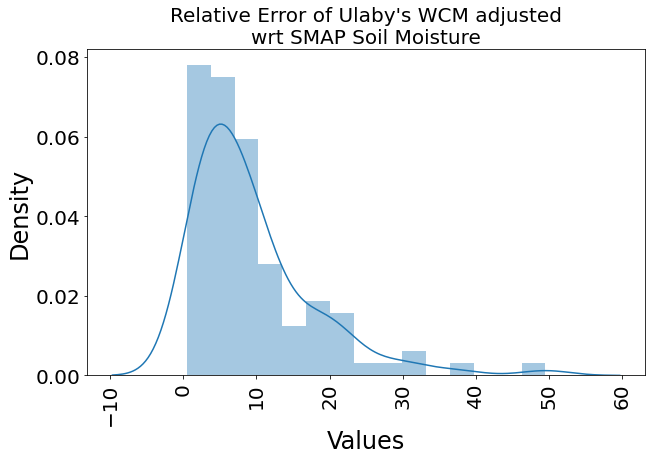

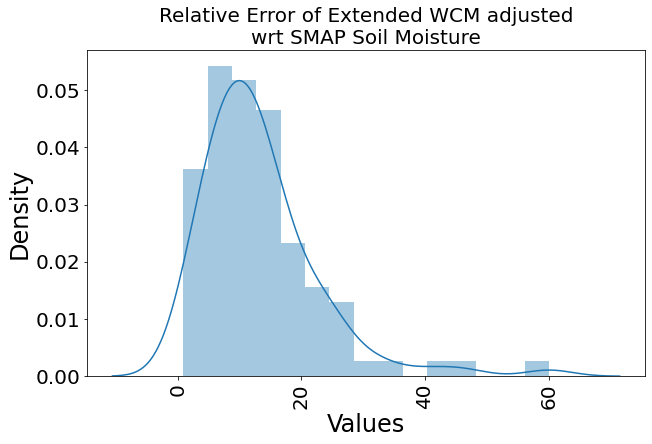

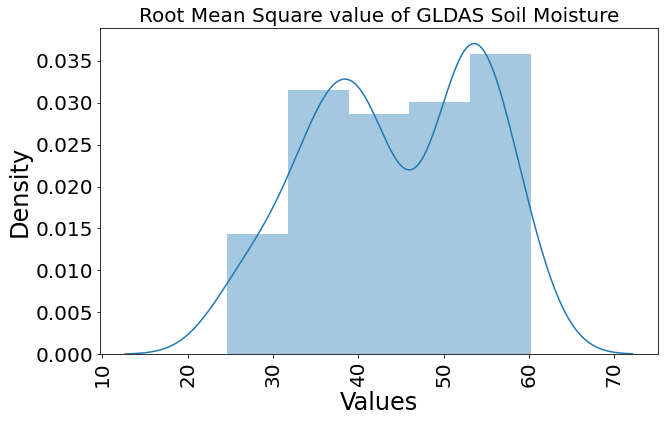

In [139]:
for V in keys23:
    K1 = np.array(DFf[f'{V}']).reshape(m,n)
    K1 = finalMask1+K1
    plt.figure(figsize=(10,6))
    sns.distplot(K1.flatten()*100)
    plt.xlabel(f'Values',fontsize=24)
    plt.ylabel('Density',fontsize=24)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.tick_params(axis='x', which='major',rotation=90)
    plt.title(f'{V}',fontsize=20)

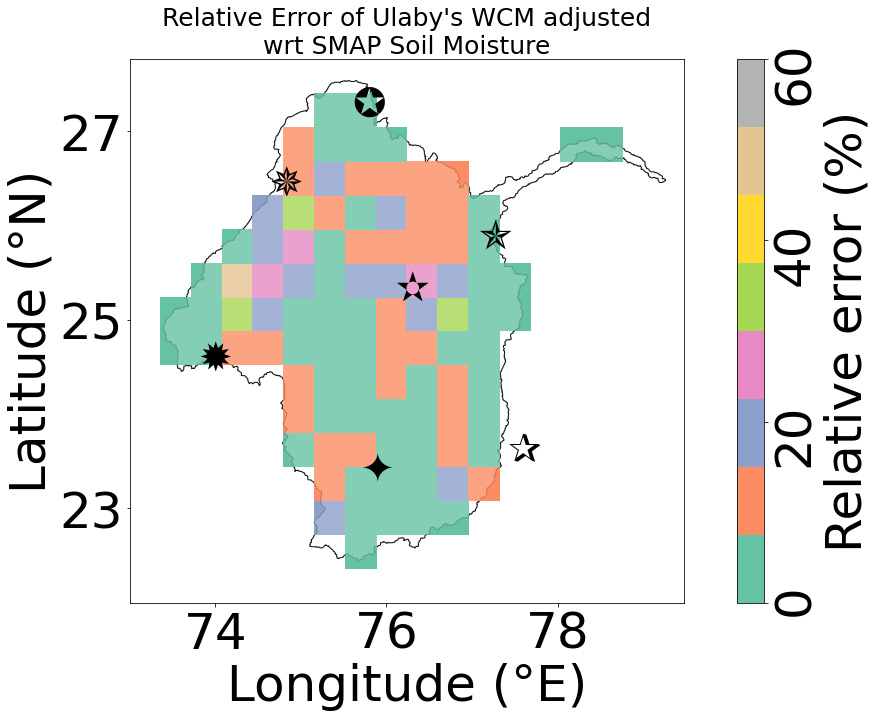

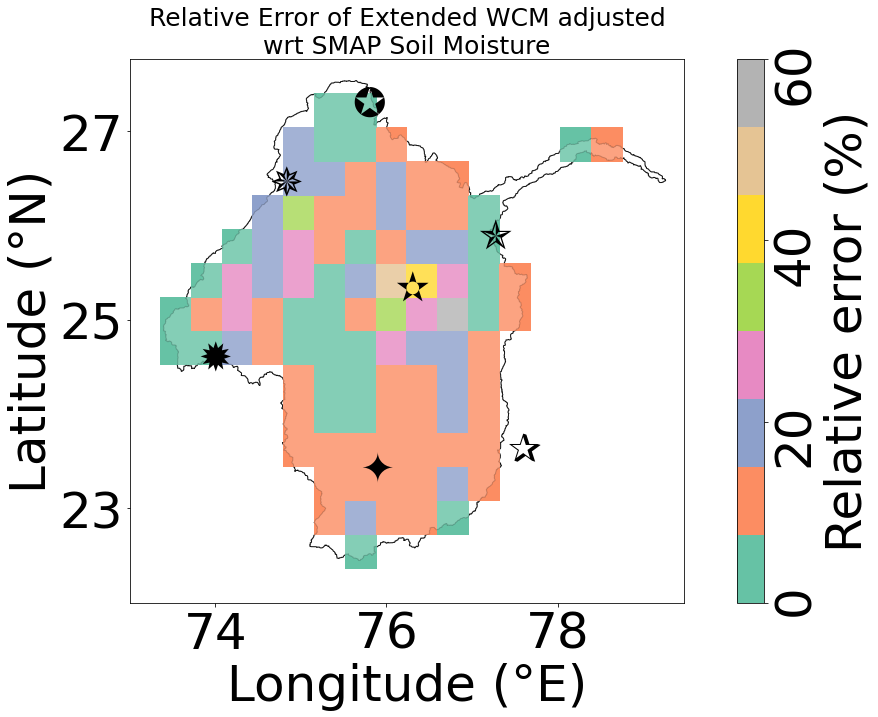

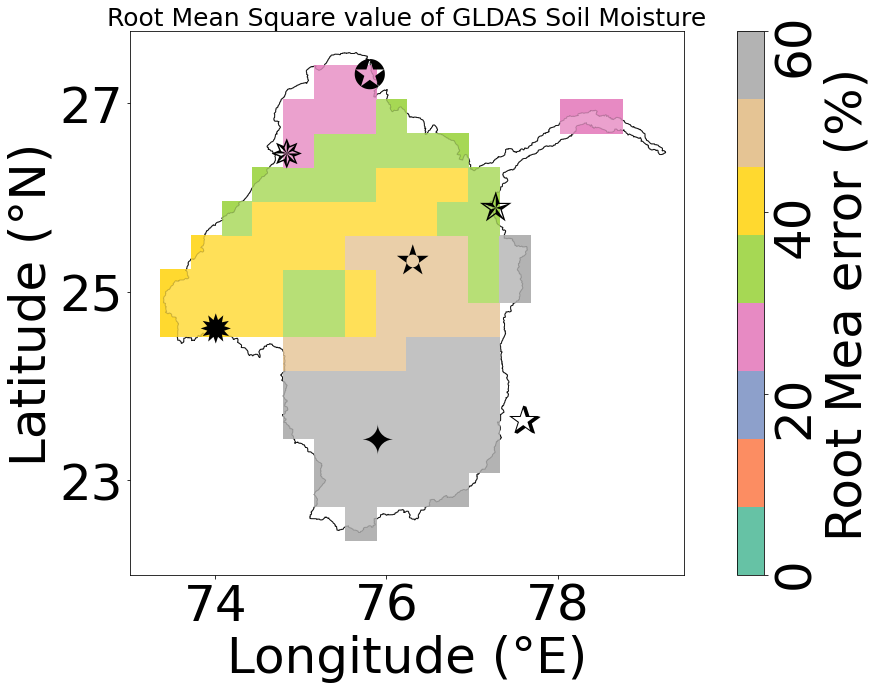

In [140]:
for i in range(len(keys23)):
    K  = keys23[i]
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(19,10))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_K, lat_K, K1*100,cmap="Set2",vmin=0,vmax=60)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
    plt.xlabel('Longitude (°E)',fontsize=50)
    plt.ylabel('Latitude (°N)',fontsize=50)
    cbar = plt.colorbar()
    cbar.set_label(f'{K[:8].replace("of","")} error (%)',fontsize=50)
    cbar.ax.tick_params(rotation=90,labelsize=50)
    plt.tick_params(axis='both', which='major', labelsize=50)
    plt.clim(0, 60)
    plt.yticks(np.arange(23,29,2))
    plt.xticks(np.arange(74,79,2))
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=40,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=40,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=40,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=40,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=40,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=40,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=40,alpha=1)
    plt.title(f'''{K}''',fontsize=25)

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">With Land Cover Type</p>

### With 100 m resolution LC 
### 3 Km grid cell contour plot

In [141]:
from tifffile import tifffile
from matplotlib.colors import LinearSegmentedColormap

tile3   = tifffile.imread('E060N40_PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326.tif')
Tile1   = np.array(tile3)
lat_LC,lon_LC = np.arange(20,40,0.0009921), np.arange(60,100,0.00099211)
lat_LC = lat_LC[2100:7656:5]
lon_LC = lon_LC[13300:19600:5]
Tile2  = Tile1[-7656:-2100:5,13300:19600:5]
lat3 = lat_LC[::-1]
lon3 = lon_LC
lon_,lat_ = np.meshgrid(lon3,lat3)

# lon_w, lat_w       =   np.asarray(lon_), np.asarray(lat_)
# points             =   np.array([Point(x, y) for x, y in zip(lon_w.flatten(), lat_w.flatten())], dtype=object)
# mask               =   np.array([polygon.contains(point) for point in points])
# mask               =   mask.reshape(lon_w.shape)
# temp_mask          =   xr.DataArray(mask, dims=['nlon', 'nlat']) 
# temp_mask          =   (temp_mask.where(temp_mask)).fillna(0)
# finalMask2         =   np.array(pd.DataFrame(temp_mask).replace(0,np.nan))
# pd.DataFrame(finalMask2.flatten()).to_csv('LCV.csv',index=False)

In [142]:
finalMask2  = np.array(pd.read_csv('LCV.csv')).reshape(lon_.shape)

In [143]:
Listed_Cover = ['Shrubs','Herbaceous vegetation','vegetated cropland','Built up','Sparse vegetation',
                'Permanent water bodies','Herbaceous wetland','Closed forest, evergreen needle leaf',
                'Closed forest, evergreen, broad leaf','Closed forest, deciduous broad leaf',
                'Closed forest, unknown','Open forest, evergreen needle leaf','Open forest, evergreen broad leaf',
                'Open forest, deciduous broad leaf','Open forest, unknown']

### Creating Standard Colors for the Land Cover

In [144]:
colors = [(255,187,34),(255,255,76),(240,150,255),(250,0,0),(180,180,180),(0,50,200),(0,150,160),
          (88,72,31),(0,153,0),(0,204,0),(0,120,0),(102,96,0),(141,180,0),(160,220,0),(100,140,0)] 

color = []
for i in colors:
    c = []
    for j in i:
        c.append(j/255)
    c = tuple(c)
    color.append(c)
cmap_name = 'my_list'
cmap = LinearSegmentedColormap.from_list(cmap_name, color, N=15)
Tick = np.array([20,30,40,50,60,70,80,90,100,110,120,130,140,150,160])/255
Tick = Tick.tolist()

In [145]:
Font = '''Shrubs(5.639%)\n
Herbaceous vegetation(6.27 %)\n
vegetated cropland(76.29 %)\n
Built up(1.65 %)\n
Sparse vegetation(0.35 %)\n
Permanent water bodies(0.546 %)\n
Herbaceous wetland(0.51 %)\n
Closed Forest(3-5 %)\n
Open forest(5-6 %)'''

In [146]:
TDF1 = pd.DataFrame(Tile2)
Rep = [80,90,111,112,114,116,121,122,124,126]
New = [70,80,90,100,110,120,130,140,150,160]
for i,j in zip(Rep,New):
    TDF1 = TDF1.replace(i,j)

In [147]:
TDF  = np.array(TDF1)+finalMask2

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Statistics on different Land Covers</p> 

In [148]:
data = pd.DataFrame(lon_.flatten())
data.columns = ['Lon']
data['Lat']  = lat_.flatten()
data['Land Cover'] = TDF.flatten()
data = data.dropna()

lon_K, lat_K = finalMask1+lon_K, finalMask1+lat_K
DFf['Lat'] = lat_K.flatten()
DFf['Lon'] = lon_K.flatten()

DFf3e  = DFf.dropna()
DFf3e1 = DFf3e.drop(['Lat','Lon','CR_SMAP_WCM','CR_SMAP_GLDAS','CR_SMAP_CYGNSS',
                     'WCM_ORG_SMAP_CR','CR_SMAP_WCM_RMSE','CR_SMAP_GLDAS_RMSE',
                     'RMS_SMAP_SM','RMS_LAI_NOAA','GLDAS_SM_RMS','ULWCM_SM_RMS',
                     'Extdd_SM_RMS','WCM_ORG_SMAP_RMSE','CR_SMAP_CYGNSS_RMSE',
                     'CR_SMAP_WCM_RMSE/RMS_SMAP','WCM_ORG_SMAP_RMSE/RMS_SMAP',
                     'CR_SMAP_GLDAS_RMSE/RMS_SMAP','CD_SMAP_WCM','CD_SMAP_GLDAS',
                     'CD_SMAP_CYGNSS','WCM_ORG_SMAP_CD','Root Mean Square value of SMAP Soil Moisture',
                     'Root Mean Square value of LAI','Root Mean Square value of GLDAS Soil Moisture',
                     '''Root Mean Square value of Ulaby's WCM Soil Moisture''',
                     'Root Mean Square value of Extended WCM Soil Moisture'],axis=1)

In [149]:
from scipy.interpolate import griddata
DFf3e['Land Cover'] = griddata((data['Lat'],data['Lon']),data['Land Cover'],(DFf3e['Lat'],DFf3e['Lon']),method='nearest')

In [150]:
LC  = ['Shrubs',
       'Herbaceous vegetation',
       'vegetated cropland',
       'Built up',
       'Sparse vegetation',
       'Permanent water bodies',
       'Herbaceous wetland',
       'Closed forest, evergreen needle leaf',
       'Closed forest, evergreen, broad leaf',
       'Closed forest, deciduous broad leaf',
       'Closed forest, unknown',
       'Open forest, evergreen needle leaf',
       'Open forest, evergreen broad leaf',
       'Open forest, deciduous broad leaf',
       'Open forest, unknown']
LCV = [20,30,40,50,60,70,80,90,100,110,120,130,140,150,160]

In [151]:
def Stats(i,DFf3e):
    NewDF = DFf3e[(DFf3e['Land Cover']==(LCV[i]+1))]
    DFAVG = NewDF
    return DFAVG

In [152]:
def Violin_Plot(DFAVG,LC):
    Keye1 = ['''Correlation of Ulaby's WCM adjusted with \nSMAP Soil Moisture''',
             '''Correlation of Extended WCM adjusted with \nSMAP Soil Moisture''',
             '''Correlation of CYGNSS Surface Reflectivity with \nSMAP Soil Moisture''']

    data_to_plot =  np.array([np.array(DFAVG[f'{Keye1[0]}']).flatten(),
                    np.array(DFAVG[f'{Keye1[1]}']).flatten(),
                    np.array(DFAVG[f'{Keye1[2]}']).flatten()])

    List1 = []
    for i in range(len(np.array(DFAVG[f'{Keye1[0]}']).flatten())):
        List1.append('''Correlation of \nUlaby's WCM \nwith SMAP SM''')
    for j in range(len(np.array(DFAVG[f'{Keye1[1]}']).flatten())):
        List1.append('''Correlation of \nExtended WCM \nwith SMAP SM''')
    for k in range(len(np.array(DFAVG[f'{Keye1[2]}']).flatten())):
        List1.append('''Correlation of \nCYGNSS SR \nwith SMAP SM''')


    fig = plt.figure(figsize=(10,8))
    sns.violinplot(data_to_plot.flatten(),List1)
    plt.tick_params(axis='both', which='major', labelsize=23)
    plt.xlabel(f'''Correlation Values (%)''',fontsize=30)
    plt.xticks(np.arange(0,100,10))
    plt.xlim(0,100)
    plt.title(f'''{len(DFAVG)} grid cells {LC}''',fontsize=30)
    plt.grid(alpha=0.4)
    plt.show()
    
    Keye1 = ['''RMSE of Ulaby's WCM adjusted with\nSMAP Soil Moisture''',
             '''RMSE of Extended WCM adjusted with\nSMAP Soil Moisture''',
             '''RMSE of CYGNSS Derived Surface Reflectivity with\nSMAP Soil Moisture''',
             '''RMSE of GLDAS with SMAP Soil Moisture''',
             '''Relative Error of Ulaby's WCM adjusted\nwrt SMAP Soil Moisture''',
             '''Relative Error of Extended WCM adjusted\nwrt SMAP Soil Moisture''',
             '''Relative Error of GLDAS wrt SMAP Soil Moisture''']

    data_to_plot = np.array([np.array(DFAVG[f'{Keye1[0]}']).flatten(),
                             np.array(DFAVG[f'{Keye1[1]}']).flatten(),
                             np.array(DFAVG[f'{Keye1[2]}']).flatten(),
                             np.array(DFAVG[f'{Keye1[3]}']).flatten(),
                             np.array(DFAVG[f'{Keye1[4]}']).flatten(),
                             np.array(DFAVG[f'{Keye1[5]}']).flatten(),
                             np.array(DFAVG[f'{Keye1[6]}']).flatten()])

    List1 = []
    for i in range(len(np.array(DFAVG[f'{Keye1[0]}']).flatten())):
        List1.append('''RMSE of Ulaby's\nWCM with SMAP SM''')
    for j in range(len(np.array(DFAVG[f'{Keye1[1]}']).flatten())):
        List1.append('''RMSE of Extended\nWCM with SMAP SM''')
    for m in range(len(np.array(DFAVG[f'{Keye1[2]}']).flatten())):
        List1.append('''RMSE of CYGNSS\nSR wrt SMAP SM''')
    for n in range(len(np.array(DFAVG[f'{Keye1[3]}']).flatten())):
        List1.append('''RMSE of GLDAS\nwith SMAP SM''')
    for n in range(len(np.array(DFAVG[f'{Keye1[4]}']).flatten())):
        List1.append('''Rel. Error of Ulaby's\nWCM wrt SMAP SM''')
    for n in range(len(np.array(DFAVG[f'{Keye1[5]}']).flatten())):
        List1.append('''Rel. Error of Extended\nWCM wrt SMAP SM''')
    for n in range(len(np.array(DFAVG[f'{Keye1[6]}']).flatten())):
        List1.append('''Rel. Error of\nGLDAS wrt SMAP SM''')

    fig = plt.figure(figsize=(10,10))
    sns.violinplot(data_to_plot.flatten(),List1)
    plt.tick_params(axis='both', which='major', labelsize=23)
    plt.xlabel(f'''Relative Error (Fraction) 
and RMSE (m3/m3) Values''',fontsize=30)
    plt.xticks(np.arange(-0.2,1,0.2))
    plt.xlim(-0.2,1)
    plt.title(f'''{len(DFAVG)} grid cells {LC}''',fontsize=30)
    plt.grid(alpha=0.4)
    plt.show()

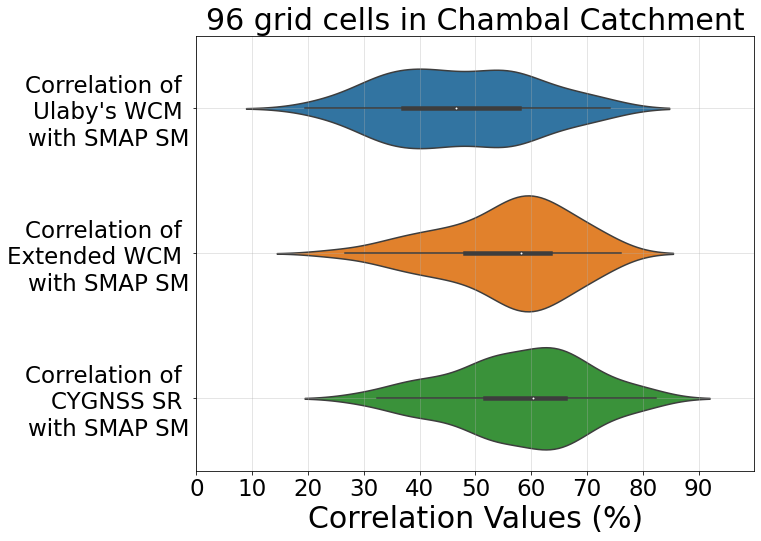

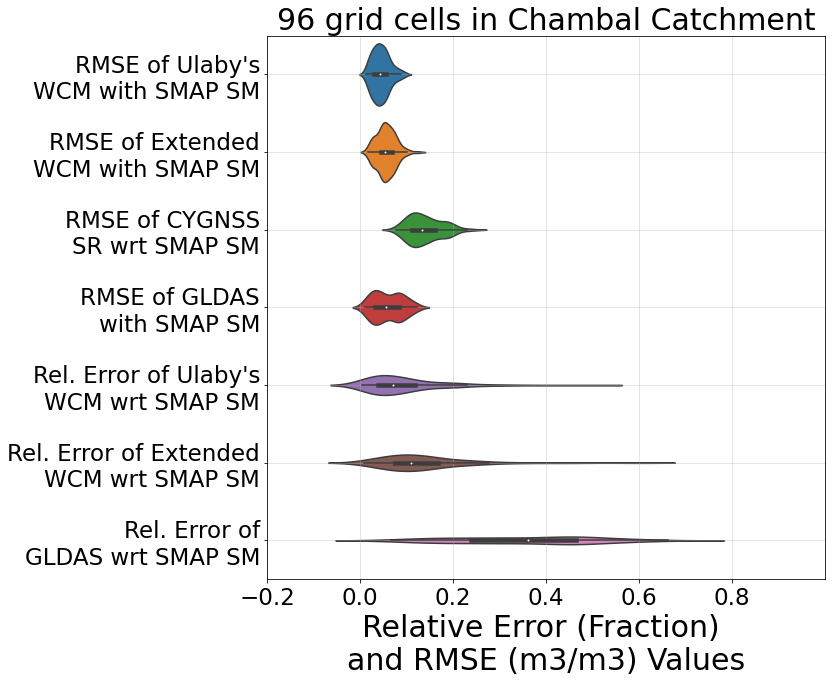

,Correlation of Ulaby's WCM adjusted with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of Ulaby's WCM\nadjusted and SMAP Soil Moisture,Correlation of Extended WCM adjusted with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of Extended WCM \nadjusted and SMAP Soil Moisture,Correlation of CYGNSS Surface Reflectivity with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of CYGNSS Surface\nReflectivity and SMAP Soil Moisture,Correlation of GLDAS with SMAP Soil Moisture,Nash Sutcliffe Efficiency of GLDAS \nand SMAP Soil Moisture,RMSE of Ulaby's WCM adjusted with\nSMAP Soil Moisture,Relative Error of Ulaby's WCM adjusted\nwrt SMAP Soil Moisture,RMSE of Extended WCM adjusted with\nSMAP Soil Moisture,Relative Error of Extended WCM adjusted\nwrt SMAP Soil Moisture,RMSE of CYGNSS Derived Surface Reflectivity with\nSMAP Soil Moisture,RMSE of GLDAS with SMAP Soil Moisture,Relative Error of GLDAS wrt SMAP Soil Moisture
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,47.324422,24.106241,55.633351,32.261586,57.846836,34.901715,69.683478,48.862179,0.045073,0.095636,0.055920,0.134674,0.139652,0.059891,0.353337
std,13.146235,12.747876,11.509508,12.136713,12.059436,13.649561,5.545372,7.366071,0.018611,0.084892,0.020392,0.095419,0.036296,0.031620,0.149548
min,19.440000,3.779136,23.630000,5.583769,29.070000,8.450649,48.220000,23.251684,0.014000,0.004664,0.018000,0.008521,0.077000,0.010000,0.067114
25%,37.015000,13.702363,48.210000,23.242068,51.690000,26.718564,66.845000,44.682601,0.031000,0.038782,0.044750,0.074914,0.111750,0.032500,0.239149
50%,46.550000,21.669106,58.093802,33.748905,60.370230,36.450684,70.510000,49.716602,0.043000,0.071244,0.054110,0.110008,0.132500,0.056000,0.360839
75%,57.732500,33.330470,63.422500,40.224293,66.002500,43.563827,73.042500,53.352185,0.056000,0.117412,0.069500,0.168538,0.162416,0.083000,0.464853
max,74.170000,55.011889,76.160000,58.003456,82.270000,67.683529,78.760000,62.031376,0.095000,0.495199,0.124000,0.600625,0.243000,0.123000,0.662791


In [153]:
Violin_Plot(DFf3e1,'in Chambal Catchment')
DFf3e1.describe()

# Regions with vegetation and forest

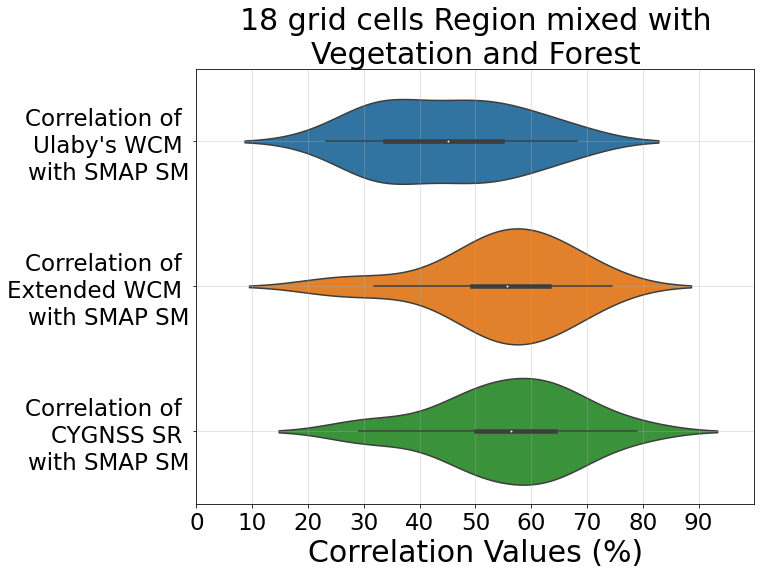

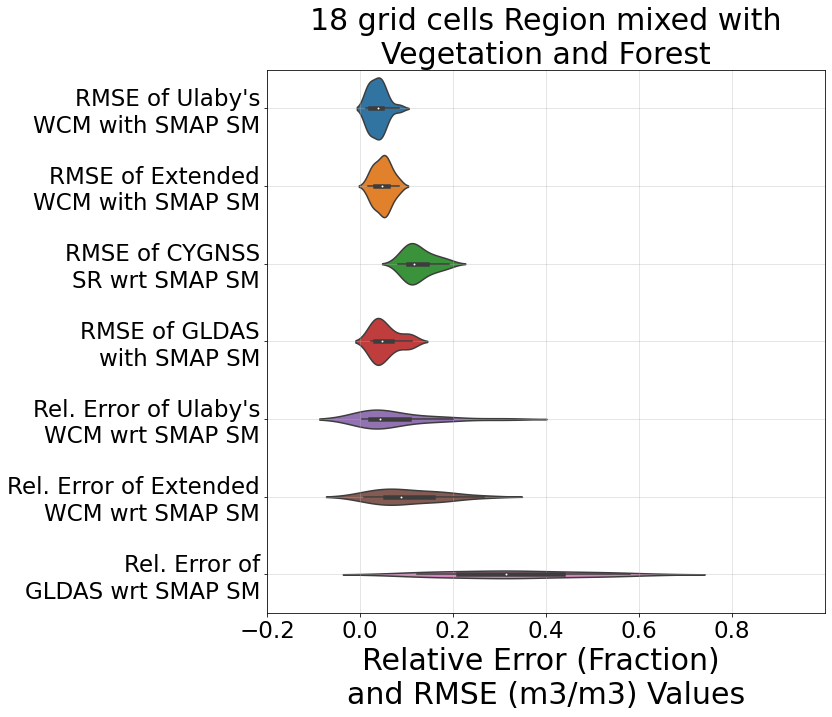

,Correlation of Ulaby's WCM adjusted with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of Ulaby's WCM\nadjusted and SMAP Soil Moisture,Correlation of Extended WCM adjusted with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of Extended WCM \nadjusted and SMAP Soil Moisture,Correlation of CYGNSS Surface Reflectivity with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of CYGNSS Surface\nReflectivity and SMAP Soil Moisture,Correlation of GLDAS with SMAP Soil Moisture,Nash Sutcliffe Efficiency of GLDAS \nand SMAP Soil Moisture,RMSE of Ulaby's WCM adjusted with\nSMAP Soil Moisture,Relative Error of Ulaby's WCM adjusted\nwrt SMAP Soil Moisture,RMSE of Extended WCM adjusted with\nSMAP Soil Moisture,Relative Error of Extended WCM adjusted\nwrt SMAP Soil Moisture,RMSE of CYGNSS Derived Surface Reflectivity with\nSMAP Soil Moisture,RMSE of GLDAS with SMAP Soil Moisture,Relative Error of GLDAS wrt SMAP Soil Moisture
count,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,45.108655,21.943082,54.640782,31.371597,55.825295,32.706660,68.930508,47.929488,0.037629,0.076600,0.048396,0.104986,0.125590,0.054711,0.328977
std,12.996184,12.078473,12.667240,12.632865,12.777839,13.744621,6.631513,8.596890,0.018477,0.081987,0.018208,0.072601,0.030647,0.029157,0.142463
min,23.200000,5.382400,23.630000,5.583769,29.070000,8.450649,51.280000,26.296384,0.014000,0.004664,0.018000,0.008521,0.082000,0.023000,0.123077
25%,33.847500,11.459557,49.360143,24.401879,50.130000,25.137972,67.548874,45.641527,0.021250,0.021592,0.033250,0.054769,0.103250,0.032119,0.211025
50%,45.154662,20.430861,55.620000,30.939325,56.345000,31.758302,70.435000,49.610922,0.038000,0.042109,0.048000,0.087275,0.116500,0.047000,0.314209
75%,54.747500,29.989427,63.147500,39.877298,64.332500,41.388125,72.497500,52.562817,0.047250,0.104633,0.061250,0.156380,0.143236,0.069500,0.436000
max,68.190000,46.498761,74.420000,55.383364,78.980000,62.378404,76.690000,58.813561,0.084000,0.309460,0.083000,0.266830,0.192000,0.112000,0.581522


In [154]:
DFAVG1  = Stats(0,DFf3e)
DFAVG2  = Stats(1,DFf3e)
DFAVG3  = Stats(4,DFf3e)
DFAVG4  = Stats(6,DFf3e)
DFAVG5  = Stats(7, DFf3e)
DFAVG6  = Stats(8, DFf3e)
DFAVG7  = Stats(9, DFf3e)
DFAVG8  = Stats(10,DFf3e)
DFAVG9  = Stats(11,DFf3e)
DFAVG10 = Stats(12,DFf3e)
DFAVG11 = Stats(13,DFf3e)
DFAVG12 = Stats(14,DFf3e)
DFAVG13 = Stats(5,DFf3e)
DFAVG14 = Stats(3,DFf3e)
DFAVG   = pd.concat([DFAVG1,DFAVG2,DFAVG3,DFAVG4,DFAVG5,DFAVG6,DFAVG7,DFAVG8,DFAVG9,DFAVG10,DFAVG11,DFAVG12,DFAVG13,DFAVG14],axis=0)
DFAVG   = DFAVG.replace(np.nan,0)
Violin_Plot(DFAVG,'Region mixed with\nVegetation and Forest')
DFAVG   = DFAVG.drop(['Lat','Lon','CR_SMAP_WCM','CR_SMAP_GLDAS','CR_SMAP_CYGNSS','WCM_ORG_SMAP_CR','CR_SMAP_WCM_RMSE',
                    'CR_SMAP_GLDAS_RMSE','RMS_SMAP_SM','RMS_LAI_NOAA','GLDAS_SM_RMS','ULWCM_SM_RMS','Extdd_SM_RMS','Root Mean Square value of LAI',
                    'WCM_ORG_SMAP_RMSE','CR_SMAP_CYGNSS_RMSE','CR_SMAP_WCM_RMSE/RMS_SMAP','WCM_ORG_SMAP_RMSE/RMS_SMAP',
                    'Root Mean Square value of SMAP Soil Moisture','Root Mean Square value of GLDAS Soil Moisture',
                    "Root Mean Square value of Ulaby's WCM Soil Moisture",'Root Mean Square value of Extended WCM Soil Moisture',
                    'CR_SMAP_GLDAS_RMSE/RMS_SMAP','CD_SMAP_WCM','CD_SMAP_GLDAS','CD_SMAP_CYGNSS','WCM_ORG_SMAP_CD','Land Cover'],axis=1)
DFAVG.describe()

# Cropland

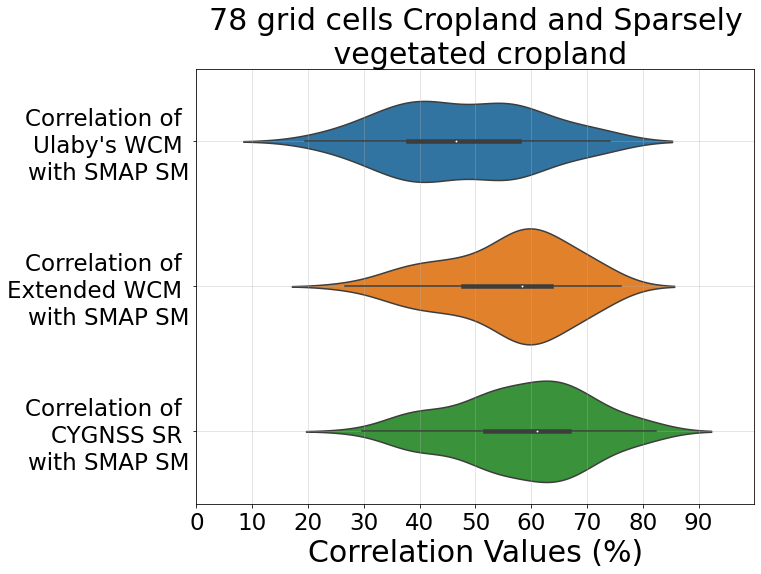

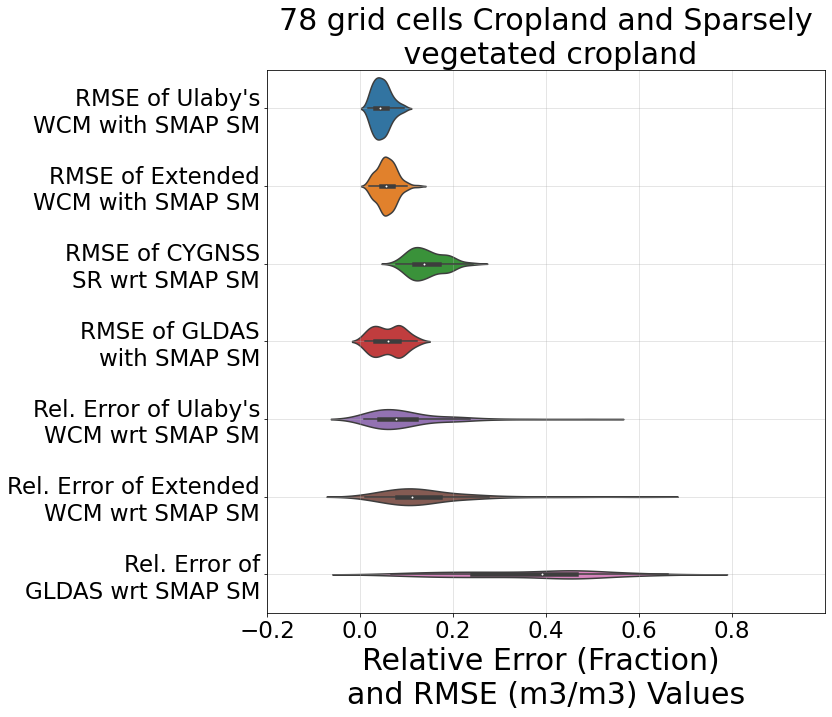

,Correlation of Ulaby's WCM adjusted with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of Ulaby's WCM\nadjusted and SMAP Soil Moisture,Correlation of Extended WCM adjusted with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of Extended WCM \nadjusted and SMAP Soil Moisture,Correlation of CYGNSS Surface Reflectivity with \nSMAP Soil Moisture,Nash Sutcliffe Efficiency of CYGNSS Surface\nReflectivity and SMAP Soil Moisture,Correlation of GLDAS with SMAP Soil Moisture,Nash Sutcliffe Efficiency of GLDAS \nand SMAP Soil Moisture,RMSE of Ulaby's WCM adjusted with\nSMAP Soil Moisture,Relative Error of Ulaby's WCM adjusted\nwrt SMAP Soil Moisture,RMSE of Extended WCM adjusted with\nSMAP Soil Moisture,Relative Error of Extended WCM adjusted\nwrt SMAP Soil Moisture,RMSE of CYGNSS Derived Surface Reflectivity with\nSMAP Soil Moisture,RMSE of GLDAS with SMAP Soil Moisture,Relative Error of GLDAS wrt SMAP Soil Moisture
count,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000,78.000000
mean,47.835753,24.605432,55.862405,32.466968,58.313345,35.408266,69.857240,49.077416,0.046790,0.100029,0.057656,0.141525,0.142897,0.061086,0.358959
std,13.210656,12.920590,11.301595,12.094281,11.924912,13.666343,5.297869,7.097578,0.018331,0.085458,0.020580,0.099075,0.036894,0.032220,0.151463
min,19.440000,3.779136,26.550000,7.049025,29.610000,8.767521,48.220000,23.251684,0.018000,0.008881,0.020000,0.010965,0.077000,0.010000,0.067114
25%,37.895000,14.360479,47.855000,22.901641,51.791841,26.824042,66.835000,44.669641,0.033000,0.042001,0.045250,0.079190,0.115250,0.033250,0.241366
50%,46.550000,21.669106,58.280000,33.965609,61.095000,37.325992,70.640000,49.900112,0.043500,0.078119,0.056000,0.111704,0.138000,0.059500,0.391516
75%,57.825000,33.437367,63.505000,40.329397,66.850000,44.689588,73.167500,53.534948,0.058500,0.121214,0.071750,0.171269,0.170750,0.083750,0.465597
max,74.170000,55.011889,76.160000,58.003456,82.270000,67.683529,78.760000,62.031376,0.095000,0.495199,0.124000,0.600625,0.243000,0.123000,0.662791


In [155]:
DFAVG = Stats(2,DFf3e)
Violin_Plot(DFAVG,'Cropland and Sparsely\n vegetated cropland')
DFAVG   = DFAVG.drop(['Lat','Lon','CR_SMAP_WCM','CR_SMAP_GLDAS','CR_SMAP_CYGNSS','WCM_ORG_SMAP_CR','CR_SMAP_WCM_RMSE',
                    'CR_SMAP_GLDAS_RMSE','RMS_SMAP_SM','RMS_LAI_NOAA','GLDAS_SM_RMS','ULWCM_SM_RMS','Extdd_SM_RMS',
                    'Root Mean Square value of LAI',
                    'WCM_ORG_SMAP_RMSE','CR_SMAP_CYGNSS_RMSE','CR_SMAP_WCM_RMSE/RMS_SMAP','WCM_ORG_SMAP_RMSE/RMS_SMAP',
                    'Root Mean Square value of SMAP Soil Moisture','Root Mean Square value of GLDAS Soil Moisture',
                    "Root Mean Square value of Ulaby's WCM Soil Moisture",
                    'Root Mean Square value of Extended WCM Soil Moisture',
                    'CR_SMAP_GLDAS_RMSE/RMS_SMAP','CD_SMAP_WCM','CD_SMAP_GLDAS',
                    'CD_SMAP_CYGNSS','WCM_ORG_SMAP_CD','Land Cover'],axis=1)
DFAVG.describe()

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Resampled Land Cover with Maps</p> 

+ https://www.researchgate.net/post/Can-anyone-provide-a-shape-file-of-Indian-Districts/553a4a5ad4c11848798b45a4/citation/download. 

In [156]:
n1  = 8
Sz  = 35

In [157]:
def Plotting5(K,n1,S1,Sz):
    K1e = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1e
    fig , ax = plt.subplots(figsize=(20, 20))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_,lat_,TDF/255,cmap=cmap)
    DF31.plot(color = "white", edgecolor = 'black',axes=ax,alpha=0.1)
    cbar = plt.colorbar(ticks=Tick)
    cbar.ax.set_yticklabels(Listed_Cover,fontsize=Sz)
    cbar.set_label(f'Land Cover Type',fontsize=Sz)
    
    contours = plt.contour(lon_K,lat_K,K1,n1, vmin=0,vmax=95,colors='k',alpha=0.8)
    plt.clabel(contours, inline=True, fontsize=Sz,colors='black', fmt='%1.0f')
    plt.xlabel('Longitude (°E)',fontsize=Sz)
    plt.ylabel('Latitude (°N)',fontsize=Sz)
    plt.tick_params(axis='both', which='major', labelsize=Sz)
    plt.title(f'''{(K.replace('adjusted','')).replace('Soil Moisture','SM')} with {n1} Contour''',fontsize=Sz)
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=50,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=50,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=50,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=50,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=50,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=50,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=50,alpha=1)
    
def Plotting6(K,n1,S1,Sz):
    K1e = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1e
    fig , ax = plt.subplots(figsize=(20, 20))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_,lat_,TDF/255,cmap=cmap,alpha=0.8)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.1)
    cbar = plt.colorbar(ticks=Tick)
    cbar.ax.set_yticklabels(Listed_Cover,fontsize=Sz)
    cbar.set_label(f'Land Cover Type',fontsize=Sz)
    
    contours = plt.contour(lon_K,lat_K,K1,n1,vmin=np.min(K1),vmax=np.max(K1e),colors='k',alpha=0.8)
    plt.clabel(contours, inline=True, fontsize=Sz,colors='black', fmt='%1.3f')
    plt.xlabel('Longitude (°E)',fontsize=Sz)
    plt.ylabel('Latitude (°N)',fontsize=Sz)
    plt.tick_params(axis='both', which='major', labelsize=Sz)
    plt.title(f'''{(K.replace('adjusted','')).replace('Soil Moisture','SM')} with {n1} Contour''',fontsize=Sz)
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=50,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=50,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=50,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=50,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=50,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=50,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=50,alpha=1)

Wall time: 42.2 s


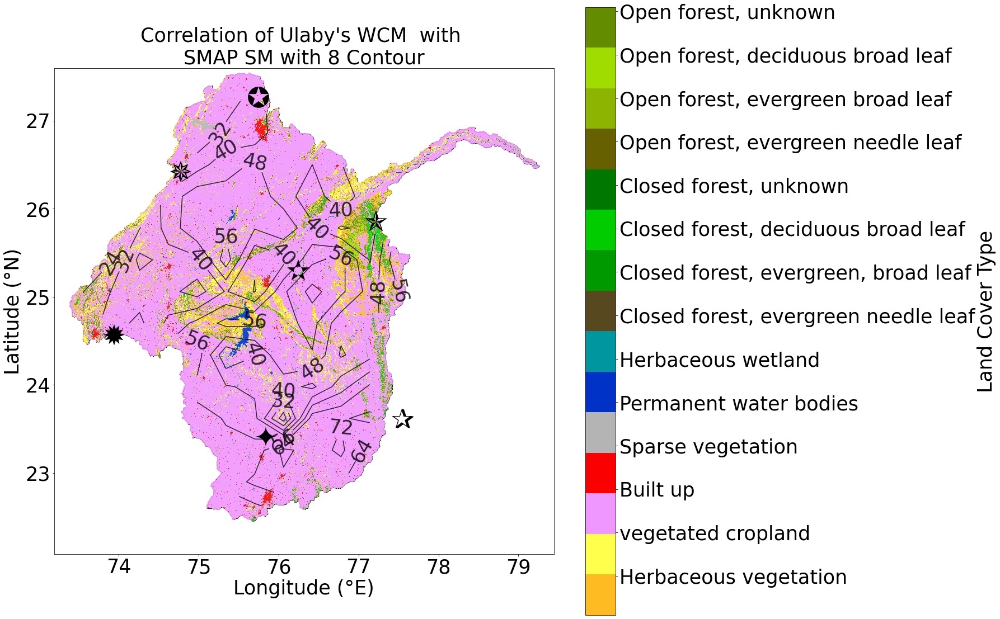

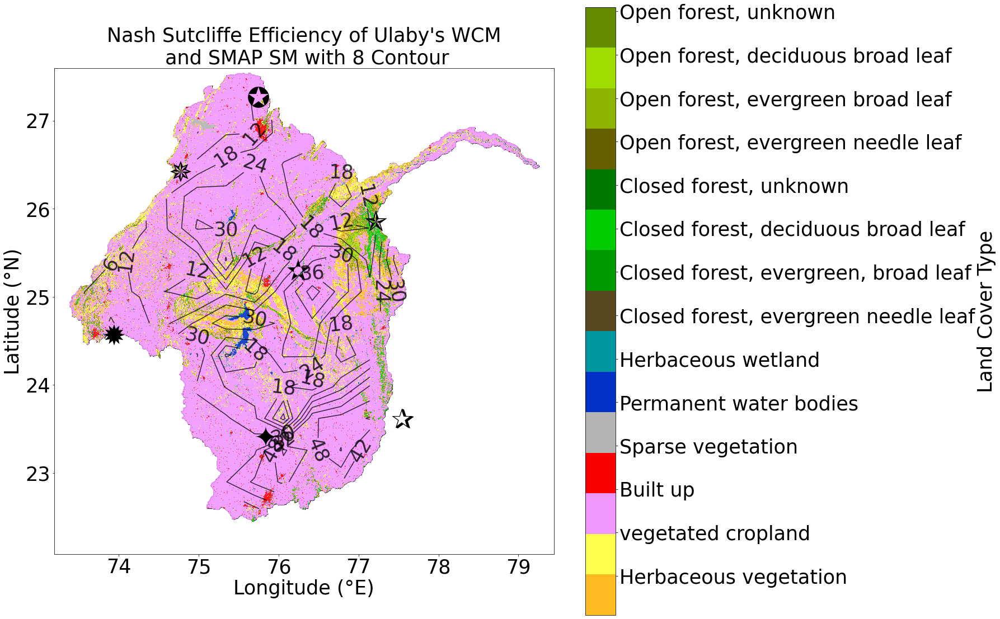

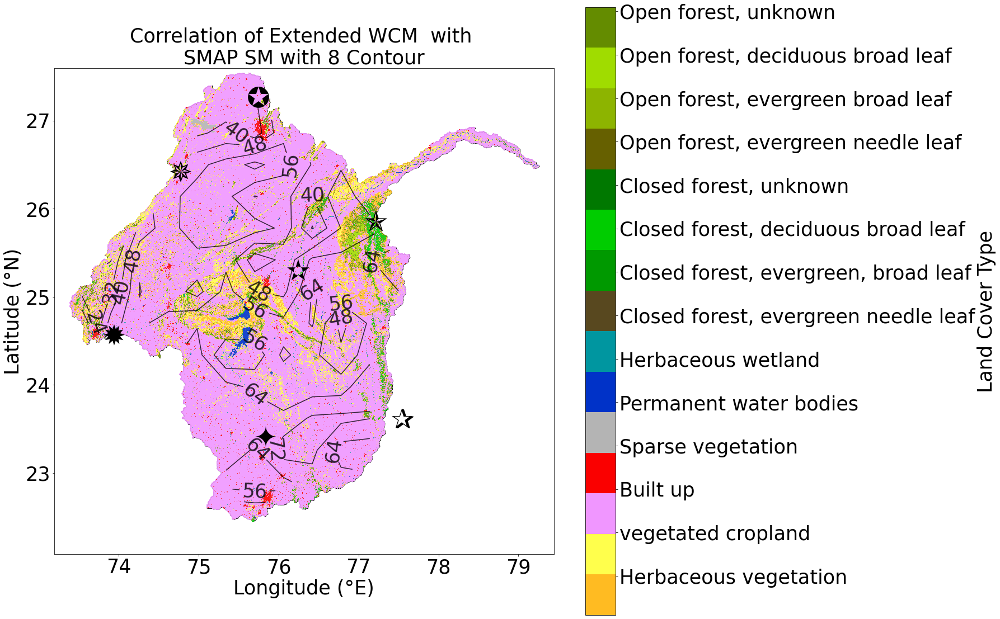

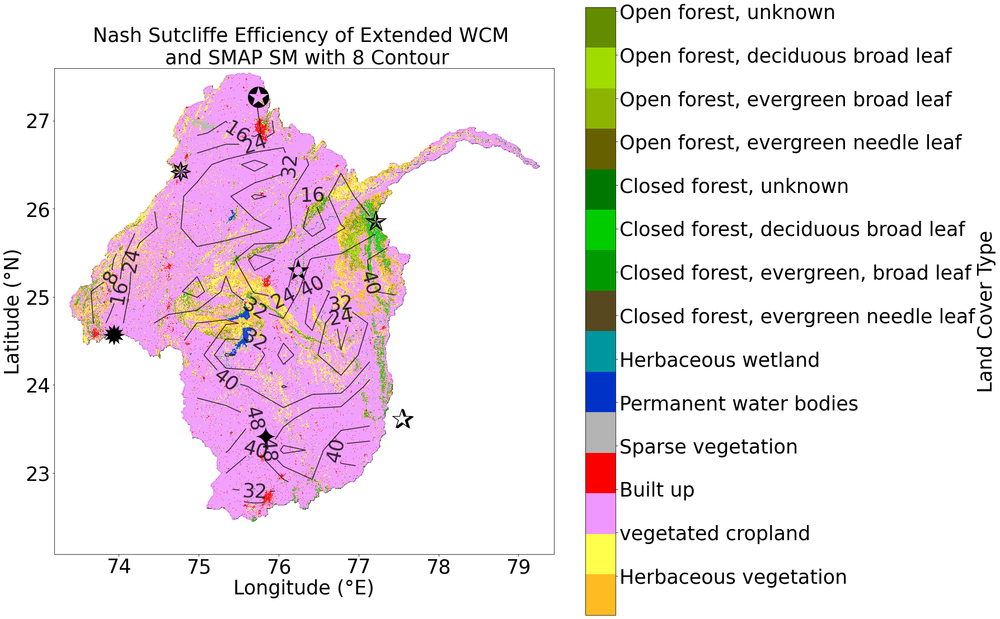

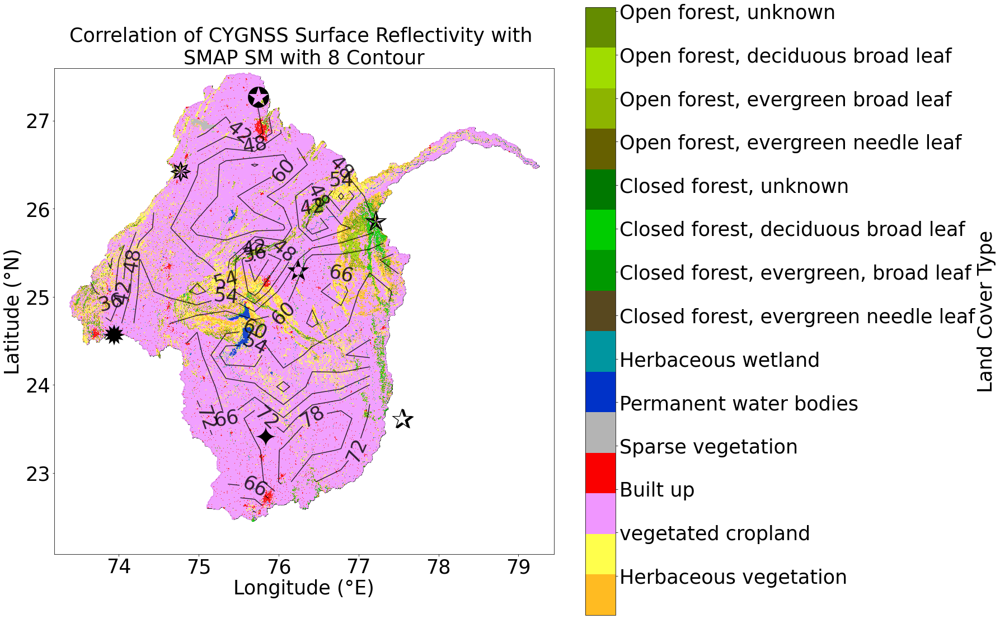

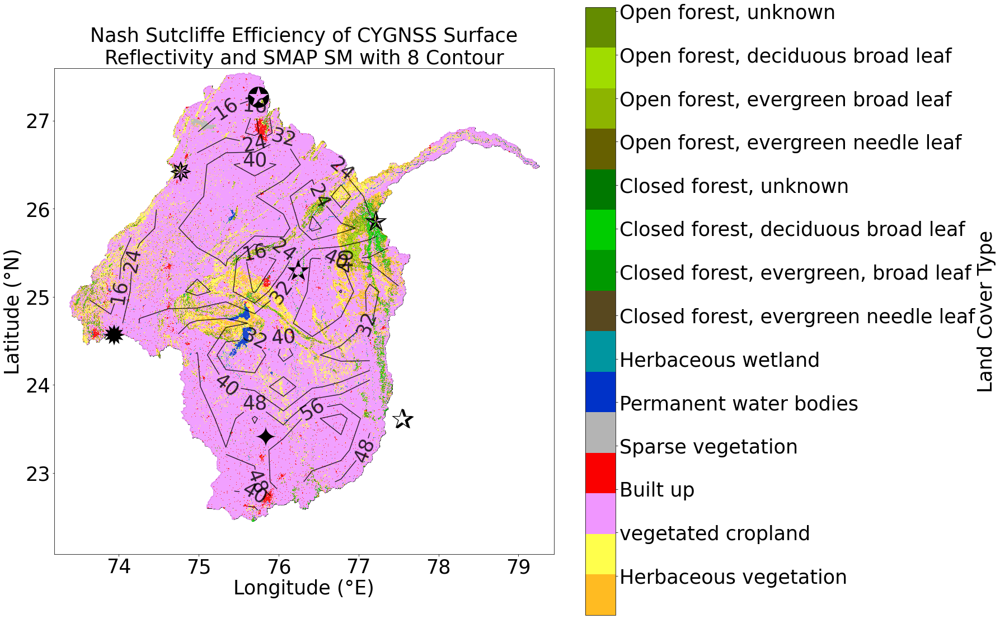

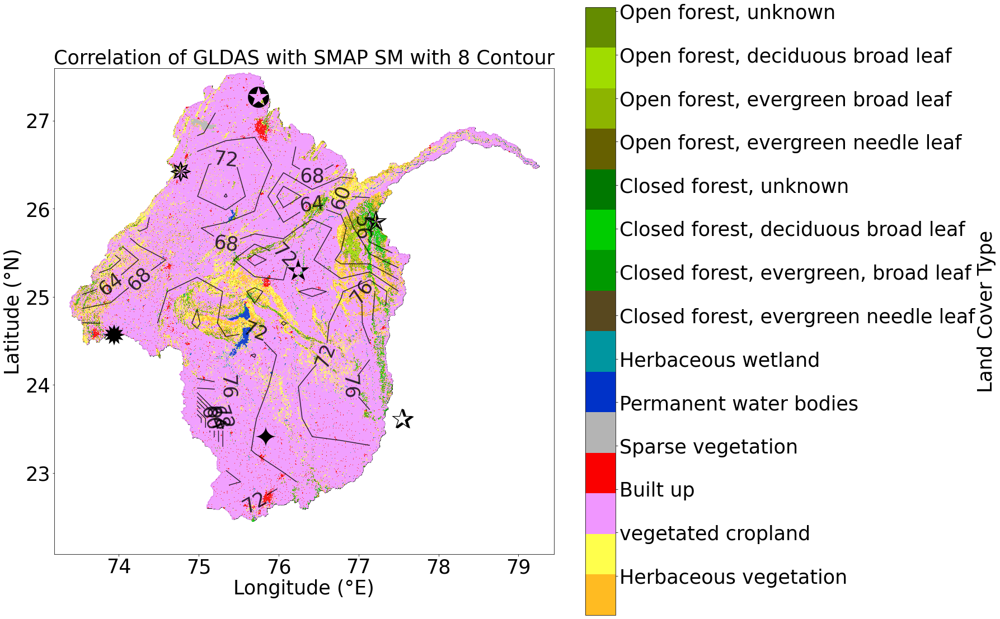

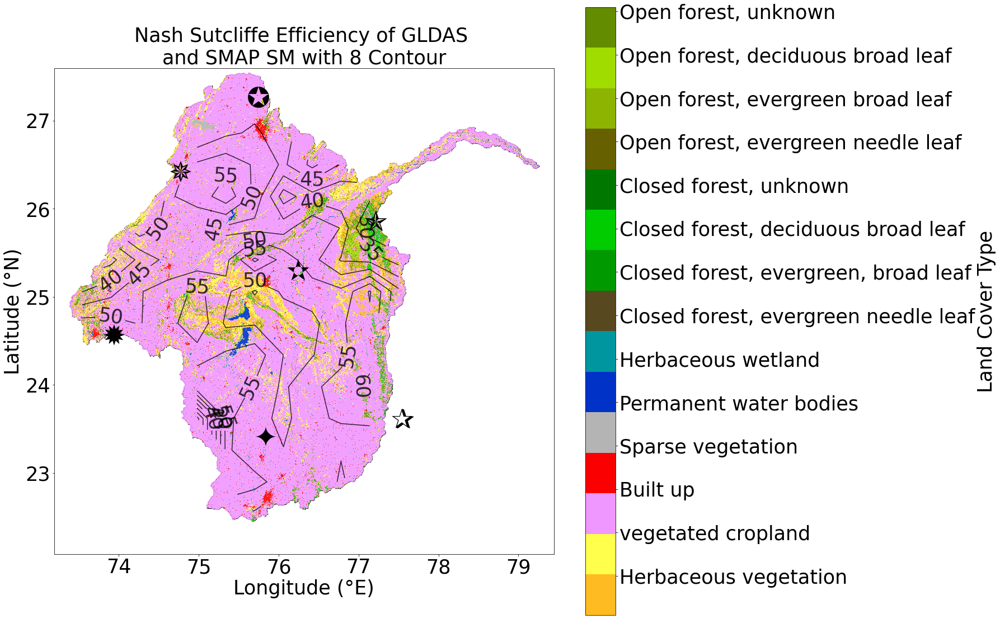

In [158]:
%%time
for i in range(len(keys1)):
  K = keys1[i]
  Plotting5(K,n1,S1,int(Sz))

In [159]:
def Plotting5(K,n1,S1,Sz):
    K1e = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1e
    fig , ax = plt.subplots(figsize=(20, 20))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_,lat_,TDF/255,cmap=cmap)
    DF31.plot(color = "white", edgecolor = 'black',axes=ax,alpha=0.1)
    cbar = plt.colorbar(ticks=Tick)
    cbar.ax.set_yticklabels(Listed_Cover,fontsize=Sz)
    cbar.set_label(f'Land Cover Type',fontsize=Sz)
    
    contours = plt.contour(lon_K,lat_K,K1*100,n1, vmin=0,vmax=60,colors='k',alpha=0.8)
    plt.clabel(contours, inline=True, fontsize=Sz,colors='black', fmt='%1.0f')
    plt.xlabel('Longitude (°E)',fontsize=Sz)
    plt.ylabel('Latitude (°N)',fontsize=Sz)
    plt.tick_params(axis='both', which='major', labelsize=Sz)
    plt.title(f'''{K.replace('Soil Moisture','SM')} with {n1} Contour''',fontsize=Sz)
    
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=50,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=50,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=50,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=50,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=50,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=50,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=50,alpha=1)

Wall time: 20.4 s


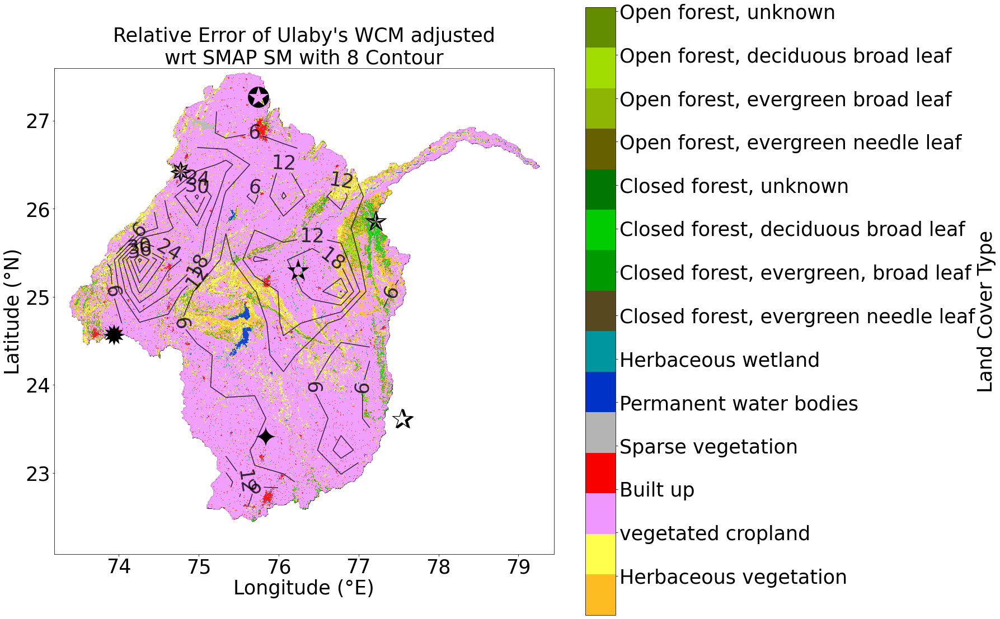

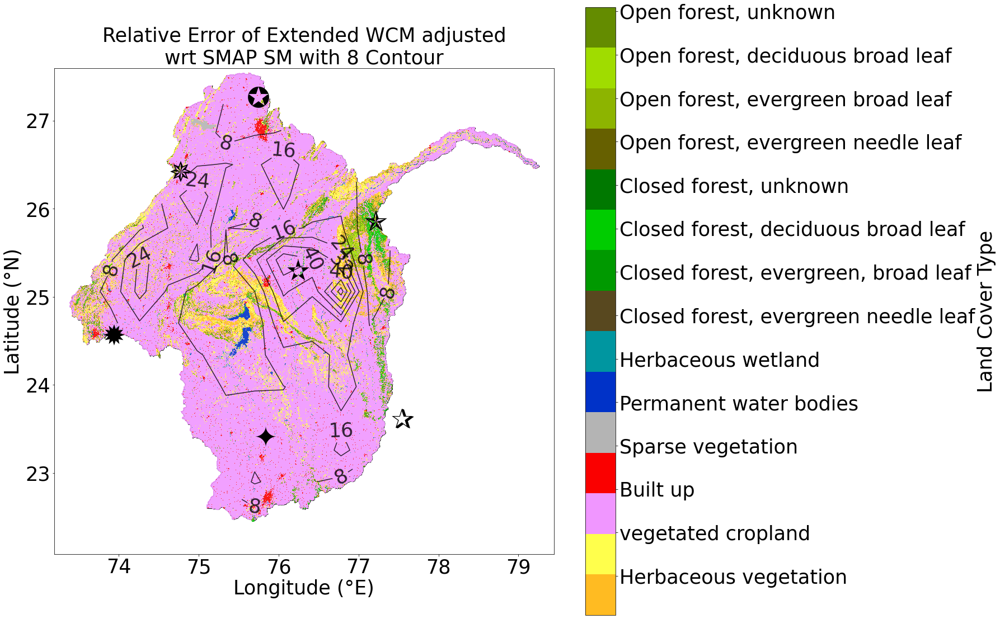

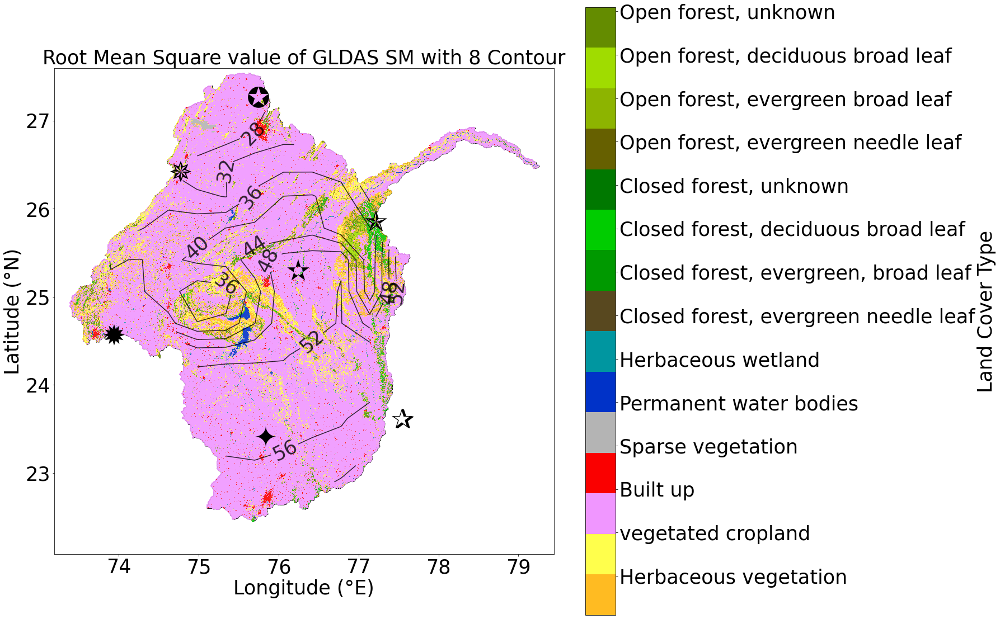

In [160]:
%%time
for i in range(len(keys23)):
  K = keys23[i]
  Plotting5(K,n1,S1,Sz)

Wall time: 20.8 s


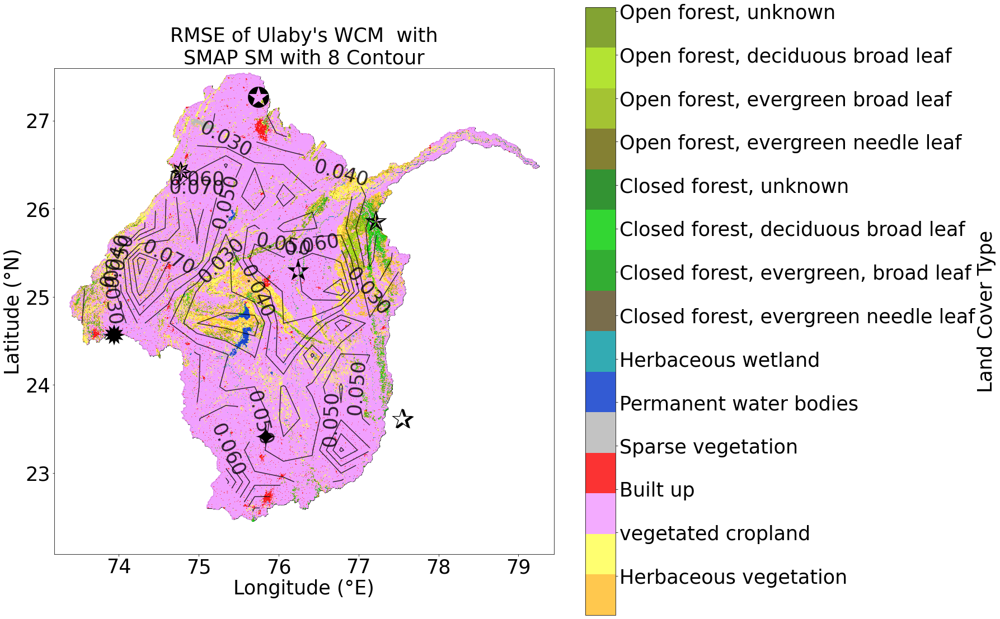

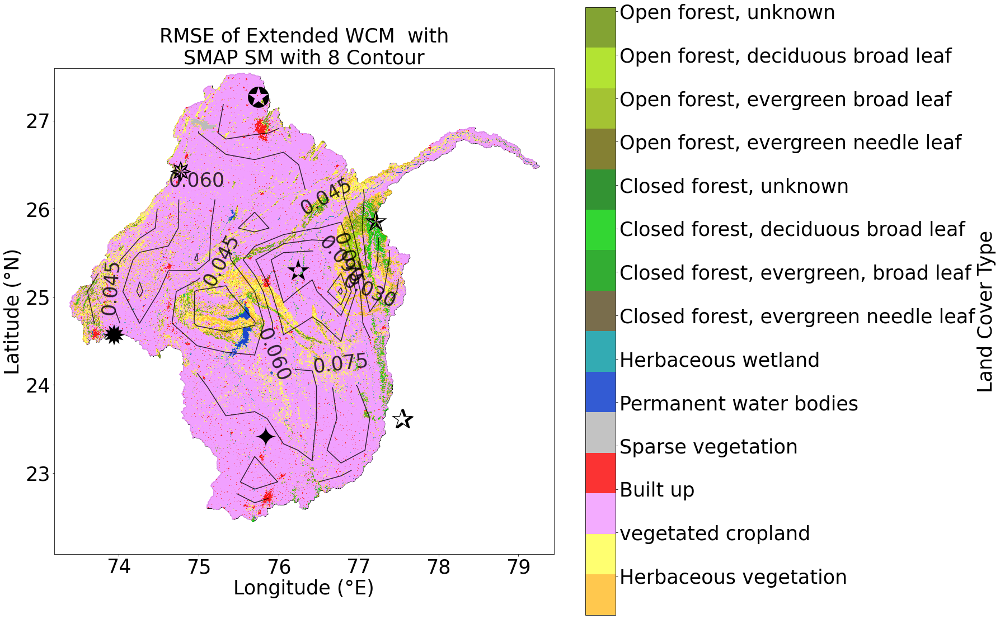

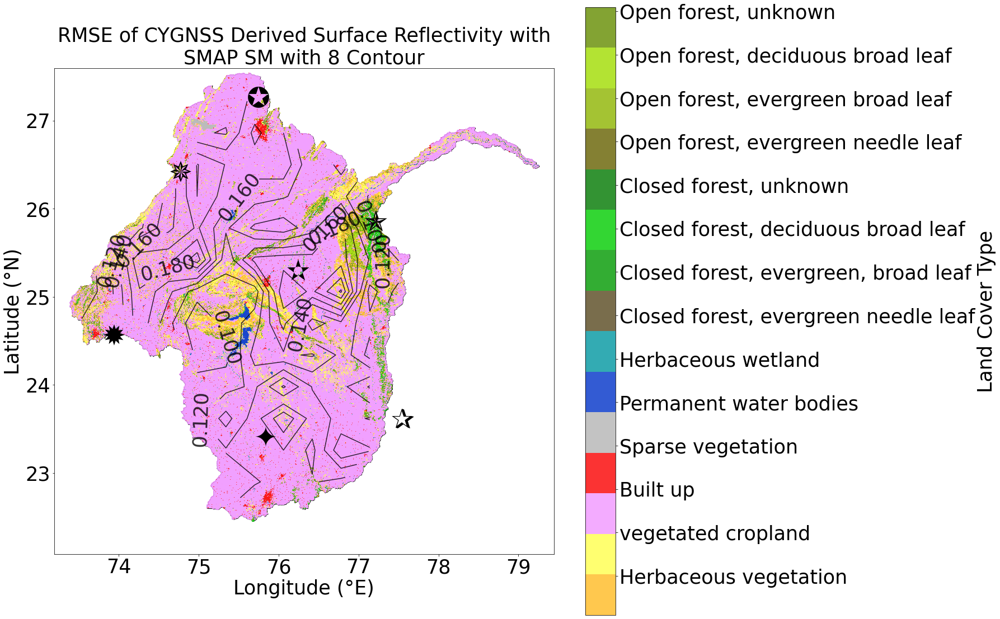

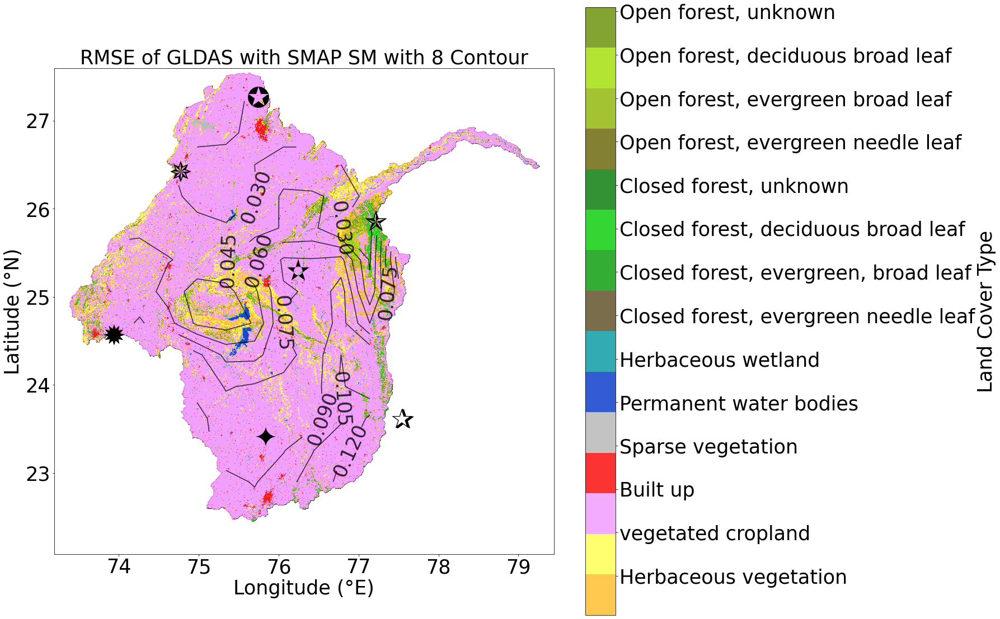

In [161]:
%%time
for i in range(len(keys21)):
  K = keys21[i]
  Plotting6(K,n1,S1,Sz)

## Conclusion
+ We found that the average values of A, B, C, E1, and E2 remained constant at 0.0089, 0.096, 13.92, -5, and -190, respectively. On the other hand, D has a range of -0.02 to 0.02 and an average value of 0.00076. We found a greater than 64% temporal correlation between the adjusted soil moisture value calculated using the water cloud model and the SMAP soil moisture values, with an RMSE of 0.024 m3/m3.


+ I noticed the temporal correlation between the adjusted soil moisture value by the water cloud model and the SMAP soil moisture values to be greater than 63% with RMSE of 0.006 m3/m3. This was done using batch adjustment for the entire year’s data for the same pixel of SMAP. However, the Water Cloud Model is frequency sensitive and only valid for microwave signals with a frequency greater than 9 GHz. 


+ This Model will behave as a linear Model for the microwave frequency less than 9 GHz and will not consider the vegetation attenuation. And will act as a Non-linear Model for microwave frequencies more than 9 GHz and consider the vegetation attenuation. The Water Cloud Model needs to do better in accounting for vegetation attenuation for CYGNSS backscatter at GPS L1 frequency (1.5 GHz). 


+ The water cloud model is vanishing the vegetation attenuation term containing the vegetation attenuation parameters A and B, too, because E1 and E2, the canopy geometry 96 parameters, are taking such values (-5 and -190). As a result, the water cloud model’s behavior for the GPS L1 frequency signal is linear. That’s why the soil moisture coming from this Model correlates more than 76% with SMAP soil moisture with an RMSE score of 0.04 m3/m3.

### Modified Water Cloud Model Developed
+ We achieved a correlation of more than 77% using the updated Water Cloud Model, which is a remarkable improvement over the original Model Ulaby created for crop field monitoring.


+ Additionally, this Model’s RMSE score dropped from 0.04 to 0.03 m3/m3 and demonstrated a significant improvement in the GLDAS soil moisture. By fitting the CYGNSS backscatter to the SMAP soil moisture and comparing the RMSE values between them, we can see that the extended WCM has improved the RMSE value more than Ulaby’s WCM. 


+ However, Ulaby’s WCM has a higher correlation and coefficient of determination than the extended one at more than 77%. The extended WCM performs poorly in the built-in area but excels in the forest area, which is the cause of the overall poor performance of the Model.